#**CUSTOMER LIFETIME VALUE**#


##**Content Summary**##

1. Business Problem Understanding
2. Data Understanding
3. Data Preprocessing
4. Modeling (Regression and Classification)
5. Conclusion
6. Recommendation

## **Business Problem Understanding**

**Business Goals**
> Sebuah perusahaan asuransi mobil ingin mengkategorikan Customer (Pemegang Polis) perusahaan berdasarkan besarnya kontribusi revenue yang mereka hasilkan selama mereka menjadi Customer perusahaan (Customer Lifetime Value). Analisa ini dilakukan berkenaan dengan rencana perusahaan dalam melakukan efisiensi operasional dan pemasaran yang lebih spesifik terkhusus kepada kategori Customer yang memberikan kontribusi signifikan.

> Secara khusus perusahaan akan menjaga **Customer Relationship** yang lebih intens dengan Customer yang mempunya kontribusi yang lebih besar terhadap perusahaan.

> Perusahaan tersebut juga tertarik untuk melakukan perkiraan terhadap  seberapa besar nilai Customer Lifetime Value dengan menggunakan data informasi detail Polis Customer, yang akan menjadi variabel dalam prediksi.

Untuk menjawab permasalahan bisnis tersebut, maka kita perlu menjawab rumusan masalah sebagai berikut

1. **Apa saja faktor-faktor yang terindikasi memberikan pengaruh terhadap Customer Lifetime Value (CLV)?**
2. **Apakah faktor-faktor tersebut sungguh dapat memprediksi Customer Lifetime Value seorang customer?**


**Kerangka Pemikiran**

Kita akan menggunakan acuan pemikiran dari sumber berikut https://www.semanticscholar.org/paper/Modeling-Customer-Lifetime-Value-Gupta-Hanssens/f2ab7d284fcf45b68b8eedf6bd9fc246042ae1a7/figure/0.

Terlihat pada gambar dibawah, Customer Lifetime Value terdiri atas 3 komponen, meliputi:
1. Customer Acquisition, yaitu akuisis customer baru ke dalam perusahaan
2. Customer Retention, yaitu seberapa banyak Customer membeli ulang atau bertahan dalam menggunakan produk kita
3. Customer Expansion, yaitu bagaimana Customer kita melakukan Upselling (membeli lagi) atau Cross Selling (membelli produk lain di perusahaan yang sama).

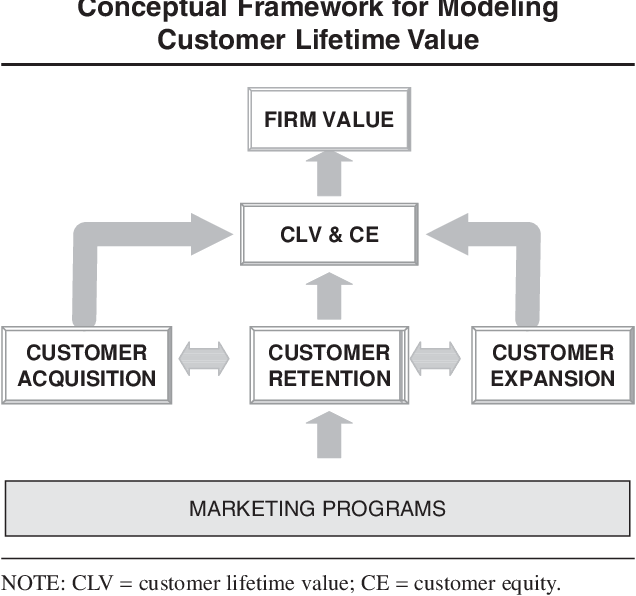

Nantinya, kita akan melihat dalam dataset kita, kolom-kolom atau feature apa saja yang kiranya dapat menjelaskan setidaknya salah satu faktor dasar yang mempengaruhi besarnya Customer Lifetime Value seperti yang dipaparkan dalam kerangka pemikiran ini.

**Analytic Approach**

Kita akan terlebih dahulu melakukan analisa terhadap pola dan sebaran data yang ada dalam dataset, untuk menentukan dan mencari arah model prediksi yang dapat membantu melakukan prediksi terhadap besarnya Customer Lifetime Value.

Selain itu, model yang kita cari, sekurang-kurangnya harus bisa menjelaskan faktor-faktor utama yang berpengaruh signifikan terhadap Customer Lifetime Value.

**Metric Evaluation**

Pengukuran reliabilitas model yang digunakan dalam kasus ini meliputi:
1. RMSE : rataan akar kuadrat error
2. MSE : rata-rata kuadrat error
3. MAE : rataan nilai absolut error
4. MAPE : rataan persentase error

Semakin kecil ketiga pengukuran di atas maka model Machine Learning yang kita gunakan akan semakin bagus. Namun, utamanya, disini saya akan menggunakan MAPE, karena setidaknya kita bisa memberikan standar kategori reliabilitas model apabila nilai MAPE :
1. 0% - 10%, model tergolong sangat baik
2. 10%-20%, model tergolong baik
3. Above 20%, model cukup baik tapi tidak terlalu reliable.

Sebagai pelengkap kita akan menggunakan model r-square di tahap terakhir untuk mengukur seberap baik model kita menjelaskan varians pada dataset.

## **Data Understanding**

> Pada bagian ini, kita akan melakukan analisa terhadap data Customer pemegang Polis Asuransi Mobil untuk mengetahui pola dan anomali data sehingga kita dapat menentukan penanganan terbaik untuk membangun sebuah modeling yang dapat memprediksi kebutuhan bisnis yang sudah dirumuskan sebelumnya.

### **Library**

In [42]:
# Melakukan import pada library
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as st
import statsmodels.api as sm
import missingno

#set lebar kolom untuk mempermudah melihat dataframe
pd.set_option('display.max_colwidth',None)
pd.set_option('display.max_columns',None)

## Analisa Uji Kenormalan data
from scipy.stats import shapiro

## Preprocessing

## Model Selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

## Encoders
## install category encoders
!pip install category_encoders
import category_encoders as ce
from category_encoders import BinaryEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import RobustScaler

from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.metrics import mean_squared_log_error

## Pipeline
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline

##import data dari google collab
from google.colab import drive
drive.mount('/content/drive')  


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### **Data**

In [7]:
# Membuat dataframe data source
clv = pd.read_csv('/content/drive/My Drive/machine_learning/data_customer_lifetime_value.csv', encoding = 'utf-8')
clv

,Vehicle Class,Coverage,Renew Offer Type,EmploymentStatus,Marital Status,Education,Number of Policies,Monthly Premium Auto,Total Claim Amount,Income,Customer Lifetime Value
0,Four-Door Car,Extended,Offer1,Retired,Divorced,High School or Below,2.0,90.0,571.479602,11828.0,10083.486880
1,Four-Door Car,Basic,Offer1,Employed,Married,College,6.0,62.0,114.514440,44762.0,4943.386117
2,Two-Door Car,Basic,Offer1,Retired,Married,Master,2.0,62.0,257.248789,21514.0,11981.984810
3,Four-Door Car,Premium,Offer3,Disabled,Married,High School or Below,1.0,116.0,556.800000,17913.0,4550.856045
4,Two-Door Car,Basic,Offer3,Medical Leave,Married,High School or Below,1.0,62.0,355.820799,19030.0,2372.155492
...,...,...,...,...,...,...,...,...,...,...,...
5664,Four-Door Car,Basic,Offer4,Unemployed,Single,High School or Below,1.0,74.0,532.800000,0.0,2442.216651
5665,Four-Door Car,Premium,Offer1,Employed,Divorced,Bachelor,2.0,109.0,523.200000,27778.0,12904.943360
5666,Four-Door Car,Basic,Offer1,Employed,Single,Bachelor,1.0,62.0,44.780402,84658.0,2447.053134
5667,Luxury SUV,Extended,Offer2,Employed,Divorced,Master,7.0,239.0,1294.700423,22705.0,19160.989940


In [8]:
# Menghitung nilai missing value pada setiap kolom
clv.isna().sum()

Vehicle Class              0
Coverage                   0
Renew Offer Type           0
EmploymentStatus           0
Marital Status             0
Education                  0
Number of Policies         0
Monthly Premium Auto       0
Total Claim Amount         0
Income                     0
Customer Lifetime Value    0
dtype: int64

In [9]:
# list nama kolom clv
clv.columns

Index(['Vehicle Class', 'Coverage', 'Renew Offer Type', 'EmploymentStatus',
       'Marital Status', 'Education', 'Number of Policies',
       'Monthly Premium Auto', 'Total Claim Amount', 'Income',
       'Customer Lifetime Value'],
      dtype='object')

In [10]:
# Memeriksa tipe data setiap kolom
clv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5669 entries, 0 to 5668
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Vehicle Class            5669 non-null   object 
 1   Coverage                 5669 non-null   object 
 2   Renew Offer Type         5669 non-null   object 
 3   EmploymentStatus         5669 non-null   object 
 4   Marital Status           5669 non-null   object 
 5   Education                5669 non-null   object 
 6   Number of Policies       5669 non-null   float64
 7   Monthly Premium Auto     5669 non-null   float64
 8   Total Claim Amount       5669 non-null   float64
 9   Income                   5669 non-null   float64
 10  Customer Lifetime Value  5669 non-null   float64
dtypes: float64(5), object(6)
memory usage: 487.3+ KB


Dataset memiliki 11 kolom, dengan informasi yang digambarkan pada setiap kolomnya antara lain sebagai berikut:


1.  `Vehicle Class`, berisi informasi mengenai tipe/kelas kendaraan yang diasuransikan (skala ordinal).
2.   `Coverage`, berisi informasi jenis polis asuransi yang meng-cover kendaraan tersebut (skala ordinal).
3. `Renew Offer Type`, informasi tipe perpanjangan polis asuransi (skala nominal).
4. `EmploymentStatus`, informasi status pekerjaan pemegang polis asuransi (skala nominal).
5. `Marital Status`, berisi status pernikahan pemegang polis (skala nominal).
6. `Education`, berisi informasi pendidikan terakhir pemegang polis (skala ordinal).
7. `Number of Policies`, informasi jumlah polis yang dimiliki oleh pemegang polis (skala numerik rasio). 
8. `Monthly Premium Auto`, informasi fee bulanan yang dibayarkan pemegang polis (skala numerik rasio).
9. `Total Claim Amount`, informasi total nilai asuransi yang pernah diklaim pemegang polis (skala numerik rasio).
10. `Income`, informasi data income pemegang polis (skala numerik rasio).
11. `Customer Lifetime Value`, informasi kontribusi benefit pemegang polis terhadap perusahaan (skala numerik rasio).


### **Exploratory Data Analysis (EDA)**

Kita akan melakukan eksplorasi sebaran data untuk mengetahui model dan tindakan penanganan dataset terbaik yang akan dilakukan.

#### **1. Analisa Sebaran Data**

In [ ]:
# overview value unik dari setiap kolom
items = []

for col in clv.columns:
  items.append([col, clv[col].unique(), clv[col].nunique(), clv[col].value_counts().sum()])

overview = pd.DataFrame(columns = ['nama_kol','nilai_unik','distinct_count','counts'], data = items)
overview

,nama_kol,nilai_unik,distinct_count,counts
0,Vehicle Class,"[Four-Door Car, Two-Door Car, SUV, Sports Car, Luxury SUV, Luxury Car]",6,5669
1,Coverage,"[Extended, Basic, Premium]",3,5669
2,Renew Offer Type,"[Offer1, Offer3, Offer2, Offer4]",4,5669
3,EmploymentStatus,"[Retired, Employed, Disabled, Medical Leave, Unemployed]",5,5669
4,Marital Status,"[Divorced, Married, Single]",3,5669
5,Education,"[High School or Below, College, Master, Bachelor, Doctor]",5,5669
6,Number of Policies,"[2.0, 6.0, 1.0, 8.0, 5.0, 3.0, 7.0, 4.0, 9.0]",9,5669
7,Monthly Premium Auto,"[90.0, 62.0, 116.0, 107.0, 101.0, 66.0, 65.0, 117.0, 78.0, 63.0, 70.0, 71.0, 61.0, 64.0, 129.0, 100.0, 68.0, 126.0, 95.0, 128.0, 84.0, 125.0, 98.0, 97.0, 121.0, 192.0, 69.0, 83.0, 72.0, 67.0, 103.0, 74.0, 89.0, 86.0, 110.0, 124.0, 73.0, 191.0, 122.0, 133.0, 165.0, 127.0, 144.0, 114.0, 194.0, 118.0, 111.0, 138.0, 119.0, 76.0, 80.0, 154.0, 189.0, 130.0, 109.0, 161.0, 88.0, 93.0, 113.0, 87.0, 136.0, 106.0, 99.0, 105.0, 82.0, 96.0, 159.0, 181.0, 146.0, 115.0, 187.0, 108.0, 209.0, 102.0, 104.0, 77.0, 79.0, 283.0, 150.0, 92.0, 91.0, 180.0, 131.0, 112.0, 184.0, 137.0, 185.0, 94.0, 198.0, 135.0, 140.0, 132.0, 139.0, 85.0, 123.0, 214.0, 201.0, 155.0, 193.0, 81.0, ...]",191,5669
8,Total Claim Amount,"[571.479602, 114.51444, 257.248789, 556.8, 355.820799, 85.063708, 584.567645, 144.987956, 264.563772, 582.781896, 39.781368, 227.44626, 347.857619, 239.328571, 340.8, 439.2, 307.2, 1178.950186, 480.0, 350.65008, 51.961915, 907.2, 423.787608, 234.683628, 456.0, 614.4, 475.2, 286.781601, 788.206874, 600.0, 265.877583, 513.6, 196.37368, 312.0, 335.840529, 580.8, 1921.248929, 331.2, 389.636991, 229.620398, 159.266473, 291.91645, 321.6, 685.227276, 355.2, 616.005527, 395.729716, 302.4, 287.5426, 528.0, 282.500791, 135.892444, 316.8, 525.6, 604.8, 981.010879, 650.52179, 668.29397, 349.954886, 345.6, 638.4, 1452.213743, 609.6, 93.128128, 297.6, 292.8, 268.471802, 624.023564, 245.447622, 476.903351, 624.711448, 820.431905, 547.2, 469.257835, 1067.291208, 416.2618, 566.4, 40.622304, 497.126827, 314.880326, 938.513425, 307.639408, 482.4, 29.984815, 290.70096, 30.874869, 199.79727, 384.0, 41.464402, 739.2, 571.2, 460.741097, 532.8, 206.810286, 199.851173, 799.2, 142.205246, 114.815893, 44.284642, 336.0, ...]",3274,5669
9,Income,"[11828.0, 44762.0, 21514.0, 17913.0, 19030.0, 94389.0, 25419.0, 26477.0, 36615.0, 59624.0, 37813.0, 35624.0, 24910.0, 62739.0, 18608.0, 46210.0, 0.0, 15192.0, 50397.0, 82210.0, 22538.0, 31614.0, 78358.0, 36510.0, 51962.0, 45345.0, 62039.0, 66550.0, 71134.0, 26721.0, 66726.0, 40672.0, 44685.0, 78804.0, 23616.0, 38667.0, 59961.0, 57117.0, 25221.0, 33806.0, 46051.0, 42526.0, 43963.0, 52819.0, 50450.0, 51972.0, 72421.0, 38183.0, 20325.0, 51032.0, 20567.0, 23671.0, 45302.0, 21102.0, 53565.0, 59797.0, 47509.0, 22239.0, 14665.0, 64801.0, 44986.0, 43817.0, 36845.0, 49259.0, 26486.0, 56446.0, 67787.0, 89464.0, 22475.0, 31972.0, 58089.0, 41990.0, 84903.0, 67137.0, 21450.0, 99874.0, 26100.0, 31275.0, 71186.0, 91580.0, 69417.0, 88592.0, 26806.0, 23656.0, 94527.0, 44096.0, 66839.0, 18643.0, 58682.0, 87002.0, 47725.0, 22244.0, 26245.0, 61085.0, 62464.0, 48367.0, 59207.0, 75007.0, 72874.0, 72540.0, ...]",3625,5669


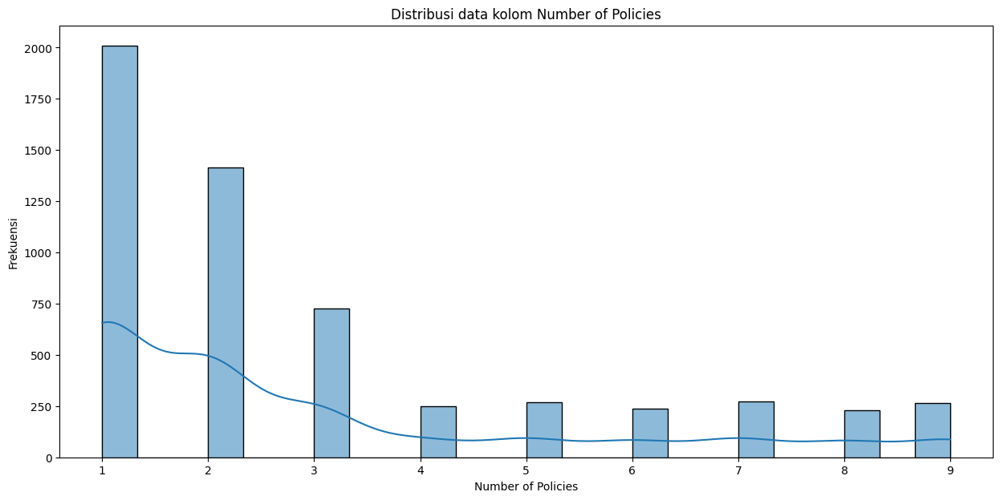

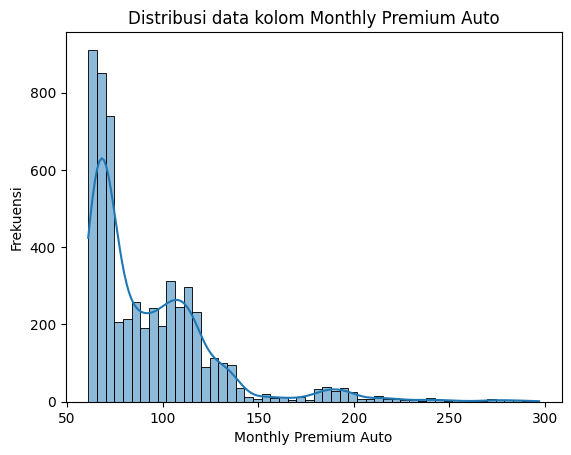

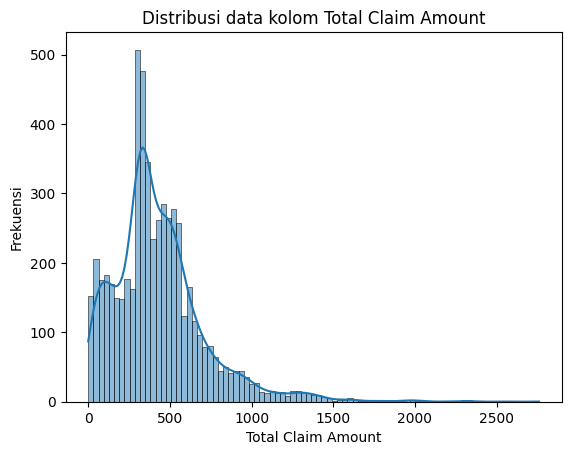

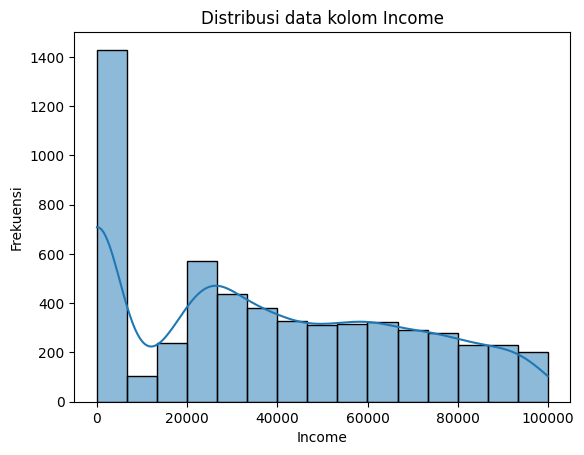

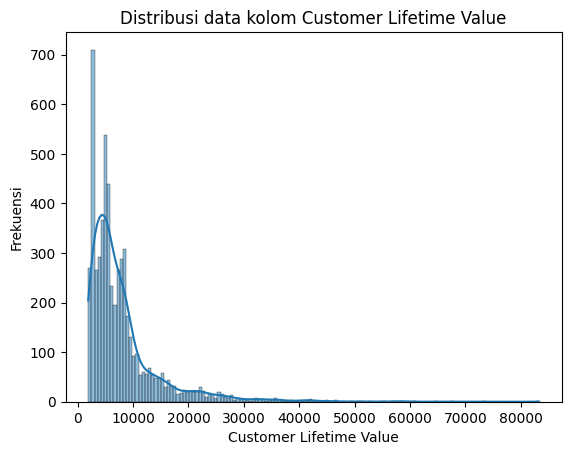

In [ ]:
# distribusi data kolom yang tipenya numerik
plt.figure(figsize = (15,7))

for col in clv.dtypes[clv.dtypes == float].index :
  sns.histplot(clv[col], kde=True)
  plt.title(f'Distribusi data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Frekuensi')
  plt.show()

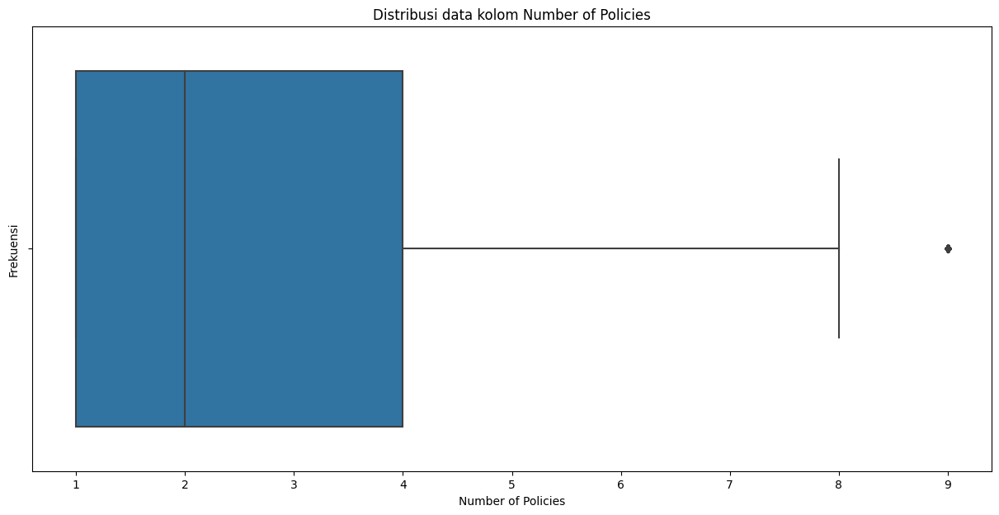

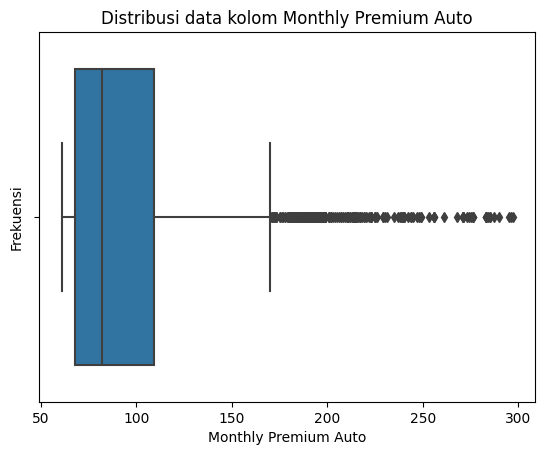

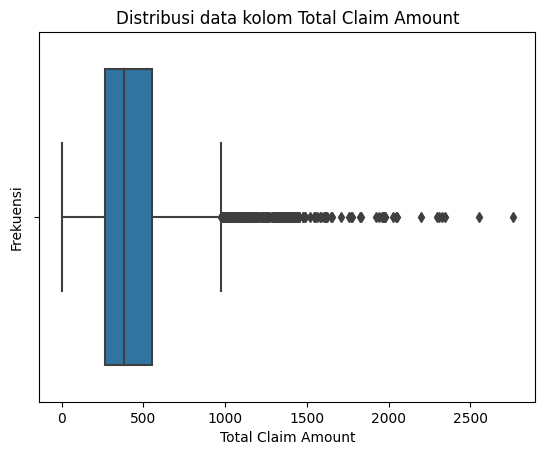

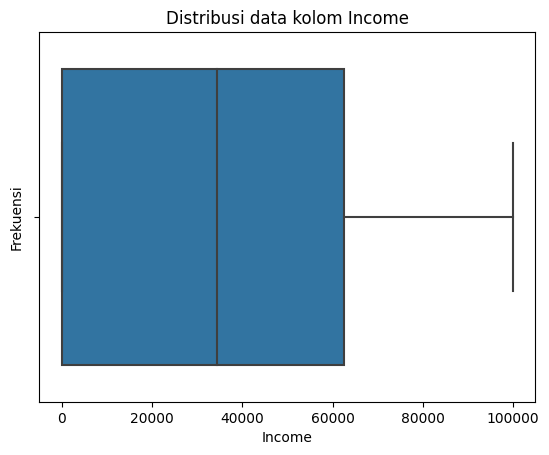

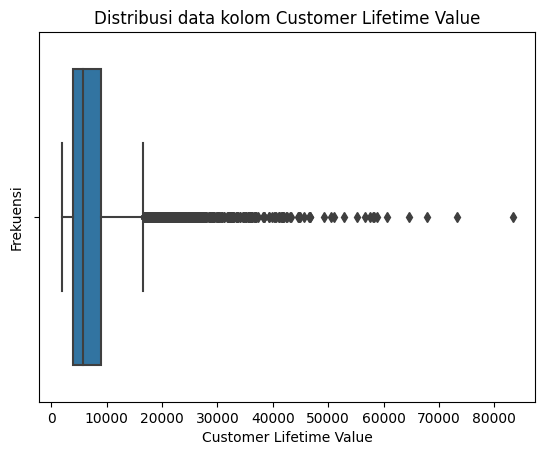

In [ ]:
#distribusi boxplot data kolom/variabel yang tipenya numerik
plt.figure(figsize = (15,7))

for col in clv.dtypes[clv.dtypes == float].index :
  sns.boxplot(x = clv[col])
  plt.title(f'Distribusi data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Frekuensi')
  plt.show()

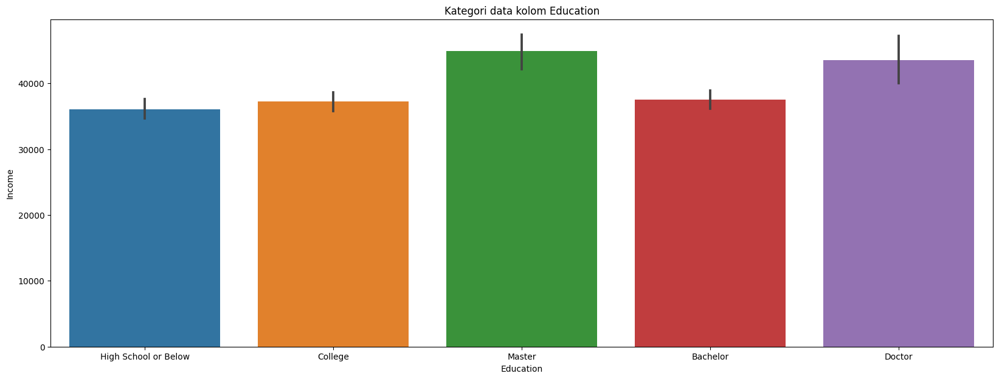

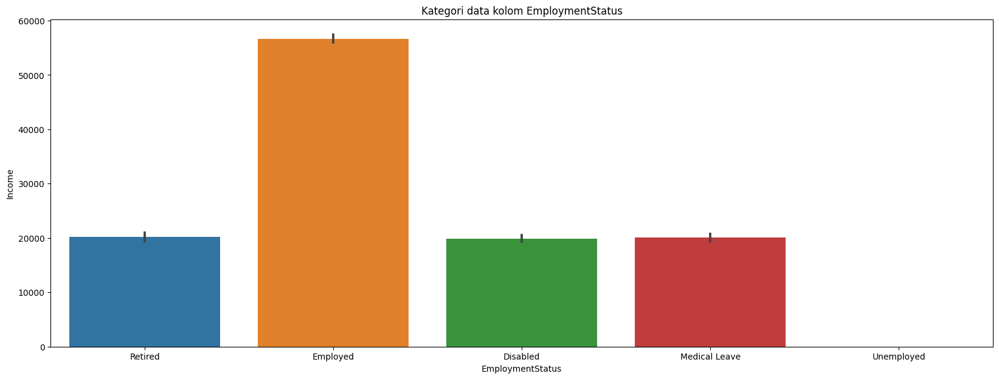

In [ ]:
#sebaran data kolom numerik dalam scatterplot
for col in clv[['Education','EmploymentStatus']].columns:
  plt.figure(figsize=(20,7))
  sns.barplot(y = clv['Income'], x = clv[col], data=clv)
  plt.title(f'Kategori data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Income')
  plt.show()

Berdasarkan data diatas kita menemukan bahwa data sebaran data numerik tidaklah normal, dan memiliki banyak nilai outliers yang besar. Hal ini akan mendasarkan penanganan data berubah pengubahan skala data dengan **Robust Scaler** sekaligus penghapusan beberapa outliers yang dinilai mengganggu distribusi sebaran data dan membuat akurasi nilai regresi kita akan menjadi terpengaruh.

In [ ]:
## menghitung pagar atas dan pagar bawah
clv_describe_num = clv.describe(include = 'float')
clv_describe_num.loc['range'] = clv_describe_num.loc['max'] - clv_describe_num.loc['min']
clv_describe_num.loc['IQR'] = clv_describe_num.loc['75%'] - clv_describe_num.loc['25%']
clv_describe_num.loc['LOWER_FENCE'] = clv_describe_num.loc['25%'] - 1.5 * clv_describe_num.loc['IQR']
clv_describe_num.loc['UPPER_FENCE'] = clv_describe_num.loc['75%'] + 1.5 * clv_describe_num.loc['IQR']
clv_describe_num 

,Number of Policies,Monthly Premium Auto,Total Claim Amount,Income,Customer Lifetime Value
count,5669.000000,5669.000000,5669.000000,5669.000000,5669.000000
mean,2.979361,93.026989,431.407103,37868.188569,8029.874592
std,2.393187,34.551795,287.558038,30490.490723,6916.708246
min,1.000000,61.000000,0.423310,0.000000,1898.007675
25%,1.000000,68.000000,266.932542,0.000000,3954.344534
50%,2.000000,82.000000,379.200000,34322.000000,5800.188903
75%,4.000000,109.000000,549.986128,62464.000000,9031.214859
max,9.000000,297.000000,2759.794354,99934.000000,83325.381190
range,8.000000,236.000000,2759.371044,99934.000000,81427.373515
IQR,3.000000,41.000000,283.053586,62464.000000,5076.870325


##### **1. Uji Hubungan EmploymentStatus, Education terhadap Income** 

Kita akan mencoba menguji, apakah ada hubungan antar variabel independen yang dapat kita deteksi untuk mendapatkan insight mengenai variabel apa saja yang kira-kira akan menjadi variabel kunci dalam dataset ini.

In [ ]:
## membuat dataframe baru income pred
income_pred = clv[['EmploymentStatus','Education','Income']]
income_pred.head()

## daftar variabel yang akan diterapkan transformasi encoding
onehot_var = ['EmploymentStatus','Education']
income_var = ['Income']
robust = RobustScaler()
onehot = OneHotEncoder(drop = 'first')

## penyusunan model transformer 
transformer = ColumnTransformer([
    ('onehot',onehot,onehot_var),
    ('robust',robust, income_var)
],remainder = 'passthrough')

## melakukan fit data dari transformer
income_pred = transformer.fit_transform(income_pred)

## list nama feature yang dihasilkan dari fit_transform
features = list(transformer.transformers_[0][1].get_feature_names_out())+['Income']

## menyusun dataframe income_pred
income_pred = pd.DataFrame(income_pred.toarray(),columns= features)
income_pred

,EmploymentStatus_Employed,EmploymentStatus_Medical Leave,EmploymentStatus_Retired,EmploymentStatus_Unemployed,Education_College,Education_Doctor,Education_High School or Below,Education_Master,Income
0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,-0.360111
1,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.167136
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,-0.205046
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.262695
4,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.244813
...,...,...,...,...,...,...,...,...,...
5664,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,-0.549468
5665,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.104764
5666,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.805840
5667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.185979


In [ ]:
# import modul transformasi Polynomial
from sklearn.preprocessing import PolynomialFeatures

## List nama variabel yang akan diterapkan transformasi polinomial dan yang tidak diterapkan polinomial
polinomvar = ['EmploymentStatus_Employed','EmploymentStatus_Medical Leave','EmploymentStatus_Retired']
non_polinom = list(income_pred.drop(columns=['EmploymentStatus_Employed','EmploymentStatus_Medical Leave','EmploymentStatus_Retired']).columns)

## menyusun model transformasi polinomial
polinom = PolynomialFeatures(degree = 1, include_bias = False)
transformer = ColumnTransformer([
    ('polinom',polinom,polinomvar)
],remainder = 'passthrough')

## fit_transform model polynomial
income_pred = transformer.fit_transform(income_pred)
features = list(transformer.transformers_[0][1].get_feature_names_out())+non_polinom

## membuat dataframe hasil transformasi polynimial
income_pred = pd.DataFrame(income_pred,columns= features)
income_pred

,EmploymentStatus_Employed,EmploymentStatus_Medical Leave,EmploymentStatus_Retired,EmploymentStatus_Unemployed,Education_College,Education_Doctor,Education_High School or Below,Education_Master,Income
0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,-0.360111
1,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.167136
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,-0.205046
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.262695
4,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.244813
...,...,...,...,...,...,...,...,...,...
5664,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,-0.549468
5665,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.104764
5666,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.805840
5667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.185979


In [ ]:
## melakukan prediksi income (y) dengan dataframe income_pred sebagai fitur
y = income_pred['Income']
model = sm.OLS(y,income_pred.drop(columns = ['Income']))
result = model.fit()
print(result.summary())#munculkan hasil

                                 OLS Regression Results                                
Dep. Variable:                 Income   R-squared (uncentered):                   0.664
Model:                            OLS   Adj. R-squared (uncentered):              0.663
Method:                 Least Squares   F-statistic:                              1397.
Date:                Mon, 29 May 2023   Prob (F-statistic):                        0.00
Time:                        07:21:46   Log-Likelihood:                         -926.33
No. Observations:                5669   AIC:                                      1869.
Df Residuals:                    5661   BIC:                                      1922.
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
                                     coef    std err          t      P>|t|      [0.025      0.975]
---------------------

Kita menemukan hubungan yang positif dan cukup kuat bahwa Customer bekerja atau tidak, akan mempengaruhi Income dari Customer. Hasil perhitungan R-Square menunjukkan bahwa :
1. Income akan bertambah sebesar 0.374 dollar bila Customer tersebut bekerja dibandingkan apabila Customer tersebut dalam kondisi disabilitas. 
2. Dalam kondisi lain seperti Cuti Medis, Pensiun, maupun tidak bekerja, maka nilai incomenya lebih kecil daripada mereka yang menderita disabilitas. 
3. Dalam variabel lain seperti Edukasi, sebenernya tidak terlalu berdampak signifikan, dan oleh sebab itu tidak dapat diukur secara reliabel.

##### **2. Uji Hubungan Coverage, Renew Offer Type, Vehicle Class terhadap Total Claim Amount** 

Seperti terlihat pada grafik dibawah, kita menemukan bahwa :
1. Total Claim Amount cenderung lebih dipengaruhi oleh jenis kendaraan (**Vehicle Class**) yang diasuransikan. Semakin mewah suatu kendaraan, yaitu **Luxury Car**, maka hal ini akan menaikkan kecenderungan **Total Claim Amount** asuransi yang diklaim pemegang polis.
2. Klaim Asuransi paling banyak terjadi pada polis asuransi tipe **Premium**.

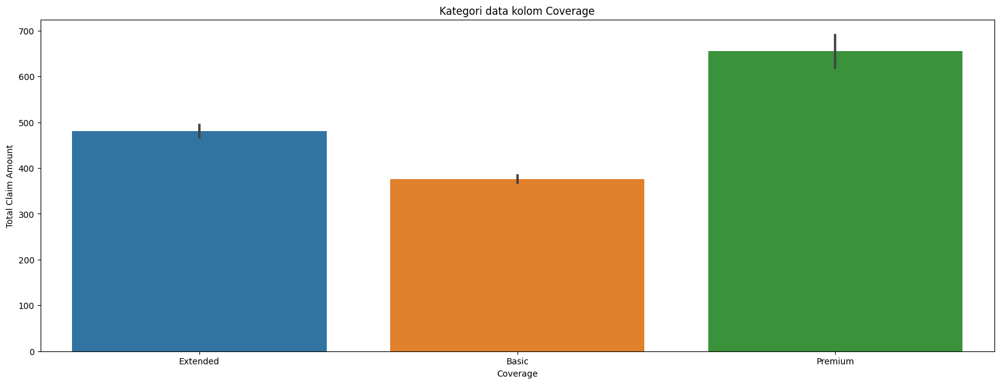

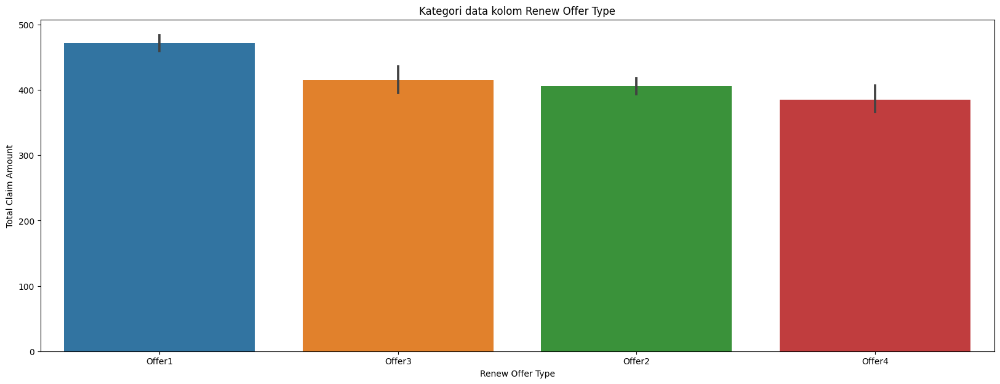

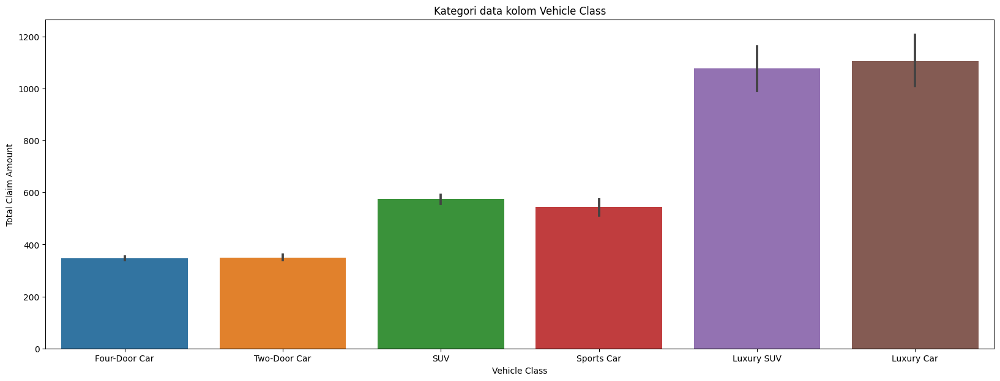

In [ ]:
#sebaran data kolom numerik dalam scatterplot
for col in clv[['Coverage','Renew Offer Type', 'Vehicle Class']].columns:
  plt.figure(figsize=(20,7))
  sns.barplot(y = clv['Total Claim Amount'], x = clv[col], data=clv)
  plt.title(f'Kategori data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Total Claim Amount')
  plt.show()

##### **3. Uji Hubungan Income, 'Marital Status','EmploymentStatus','Vehicle Class','Coverage' terhadap Monthly Premium Auto** 

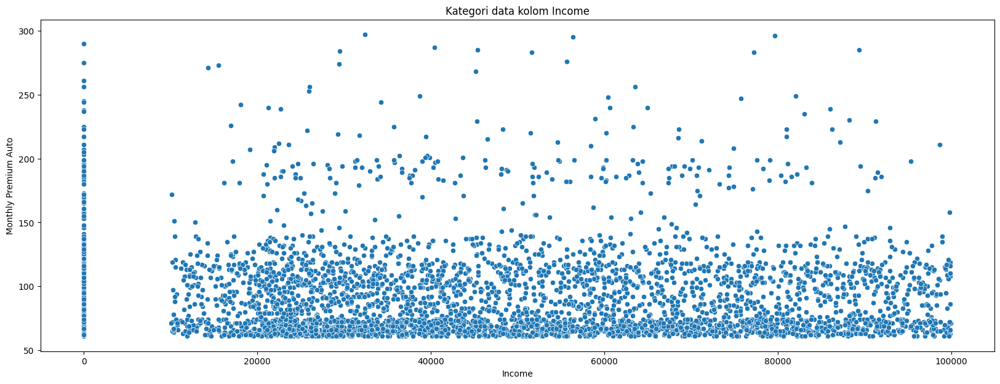

In [ ]:
#sebaran data kolom numerik dalam scatterplot
for col in clv[['Income']] :
  plt.figure(figsize=(20,7))
  sns.scatterplot(y = clv['Monthly Premium Auto'], x = clv[col], data=clv)
  plt.title(f'Kategori data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Monthly Premium Auto')
  plt.show()

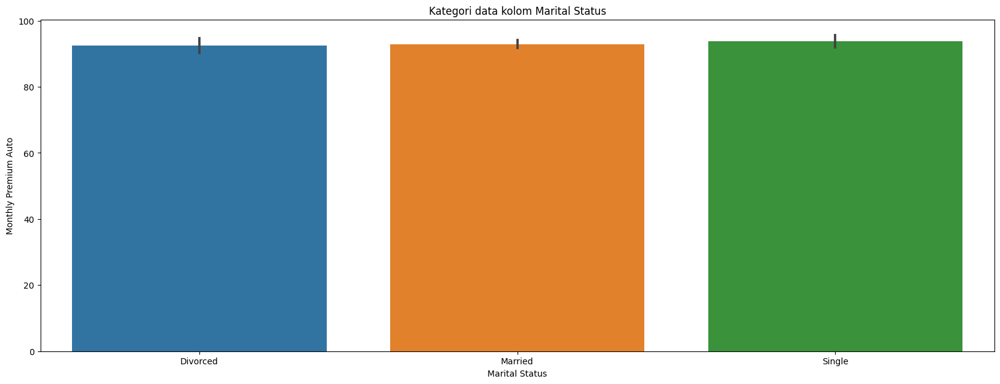

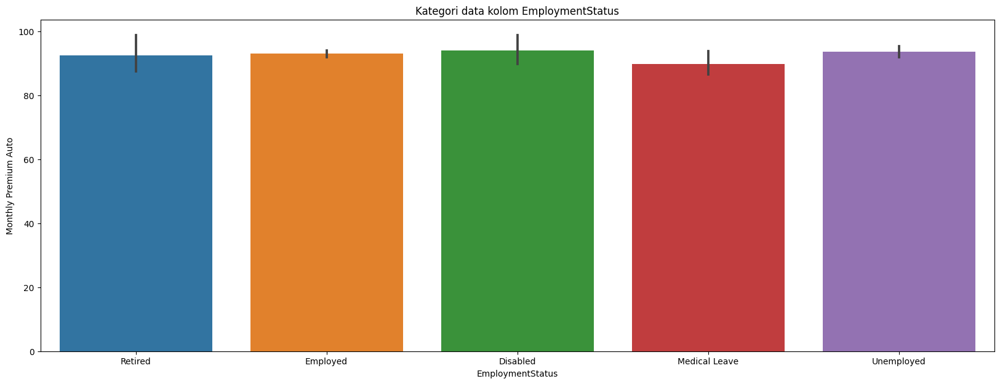

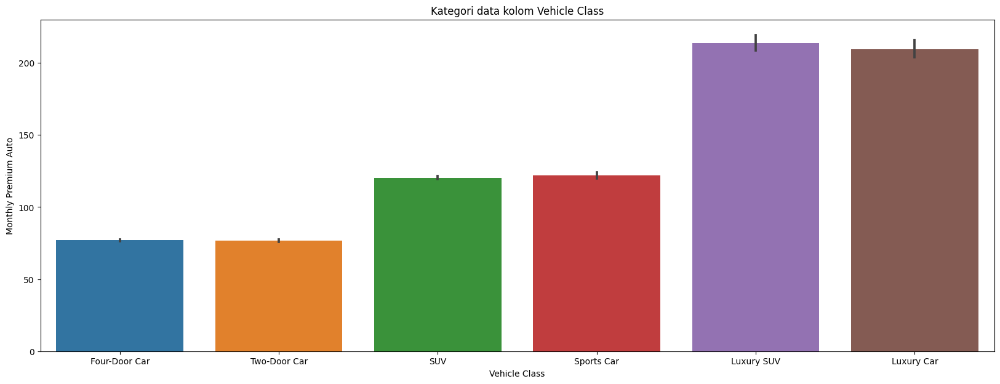

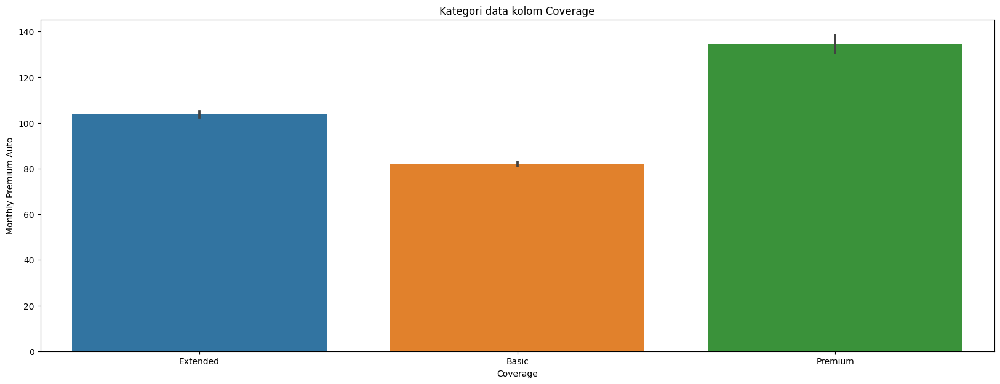

In [ ]:
#sebaran data kolom numerik dalam scatterplot
for col in clv[['Marital Status','EmploymentStatus','Vehicle Class','Coverage']] :
  plt.figure(figsize=(20,7))
  sns.barplot(y = clv['Monthly Premium Auto'], x = clv[col], data=clv)
  plt.title(f'Kategori data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Monthly Premium Auto')
  plt.show()

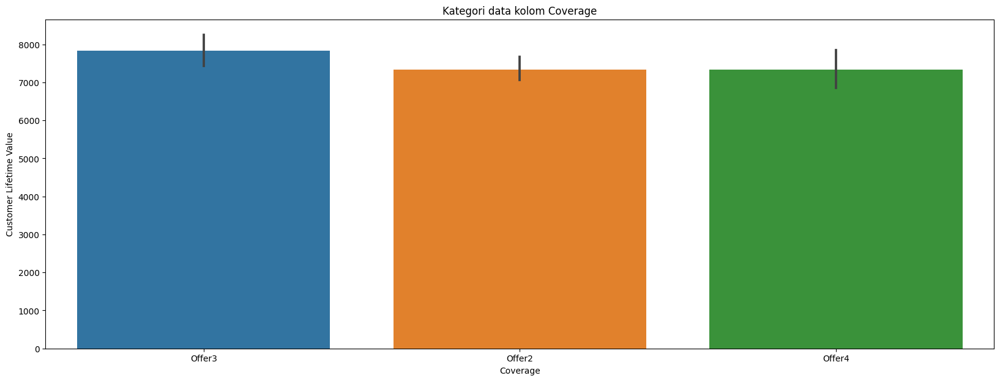

In [ ]:
#sebaran data kolom numerik dalam scatterplot
plt.figure(figsize=(20,7))
sns.barplot(y = clv['Customer Lifetime Value'], x = clv[clv['Renew Offer Type']!='Offer1']['Renew Offer Type'], data=clv)
plt.title(f'Kategori data kolom {col}')
plt.xlabel(f'{col}')
plt.ylabel('Customer Lifetime Value')
plt.show()

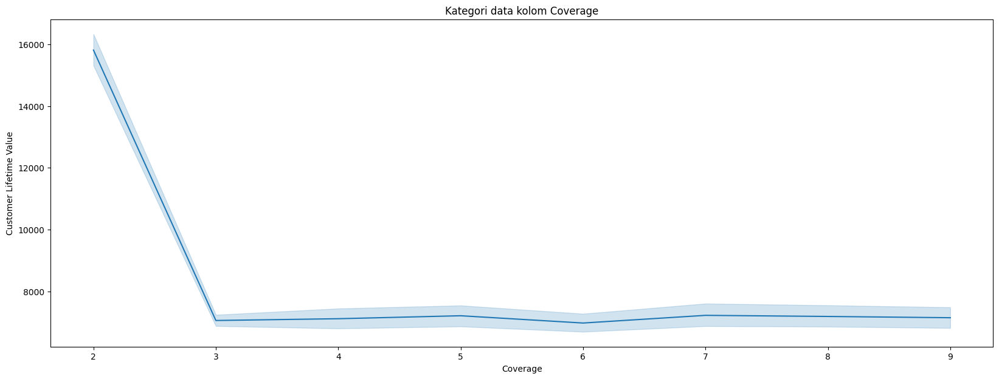

In [ ]:
#sebaran data kolom numerik dalam scatterplot
plt.figure(figsize=(20,7))
sns.lineplot(y = clv['Customer Lifetime Value'], x = clv[clv['Number of Policies']>1]['Number of Policies'], data=clv)
plt.title(f'Kategori data kolom {col}')
plt.xlabel(f'{col}')
plt.ylabel('Customer Lifetime Value')
plt.show()

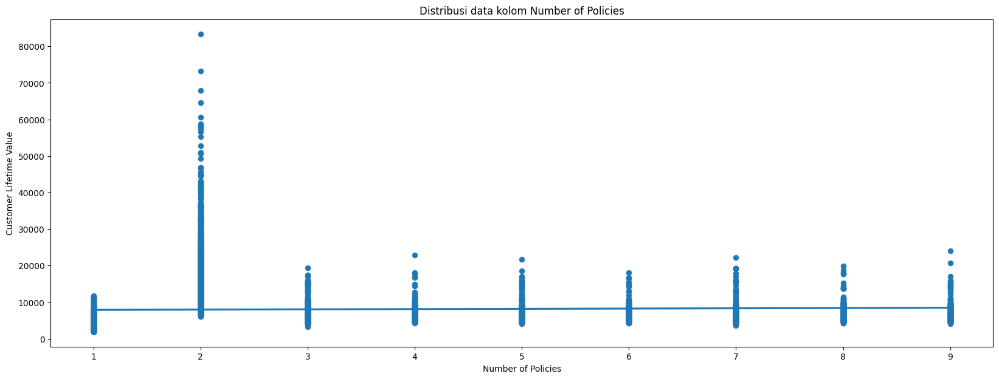

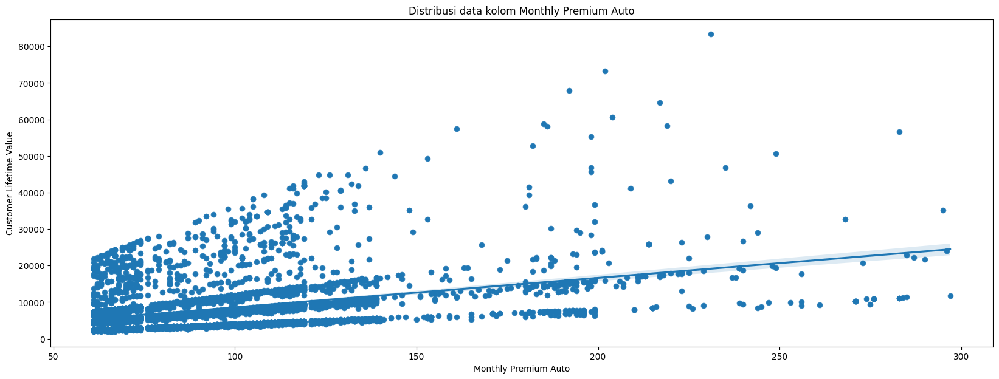

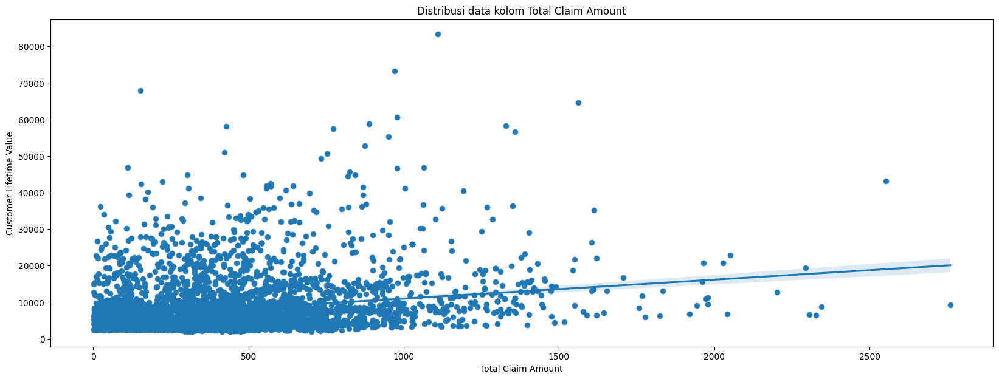

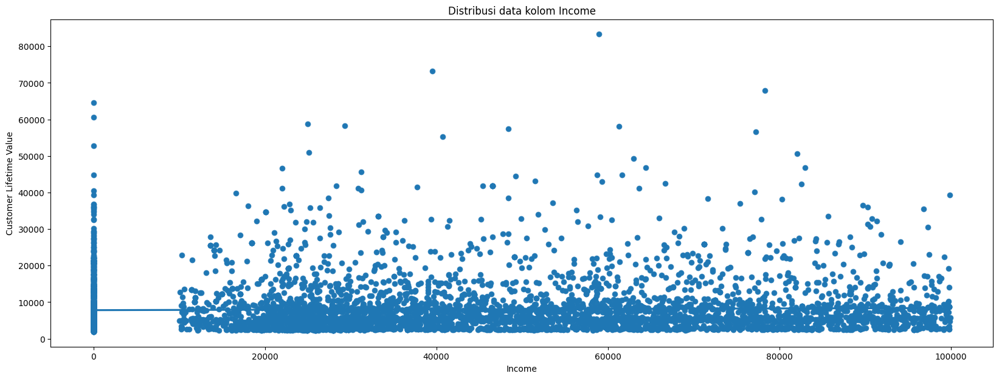

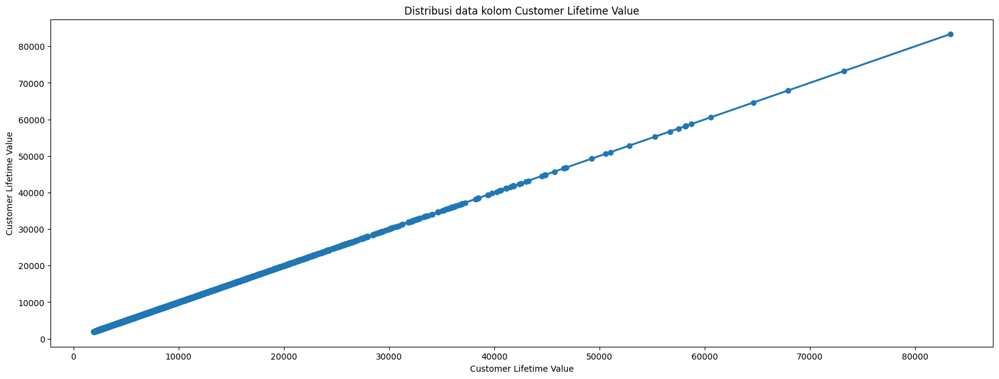

In [ ]:
#sebaran data kolom numerik dalam scatterplot
for col in clv.dtypes[clv.dtypes == float].index :
  plt.figure(figsize=(20,7))
  sns.scatterplot(y = clv['Customer Lifetime Value'], x = clv[col], data=clv)
  sns.regplot(data=clv, y = clv['Customer Lifetime Value'], x = clv[col])
  plt.title(f'Distribusi data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Customer Lifetime Value')
  plt.show()

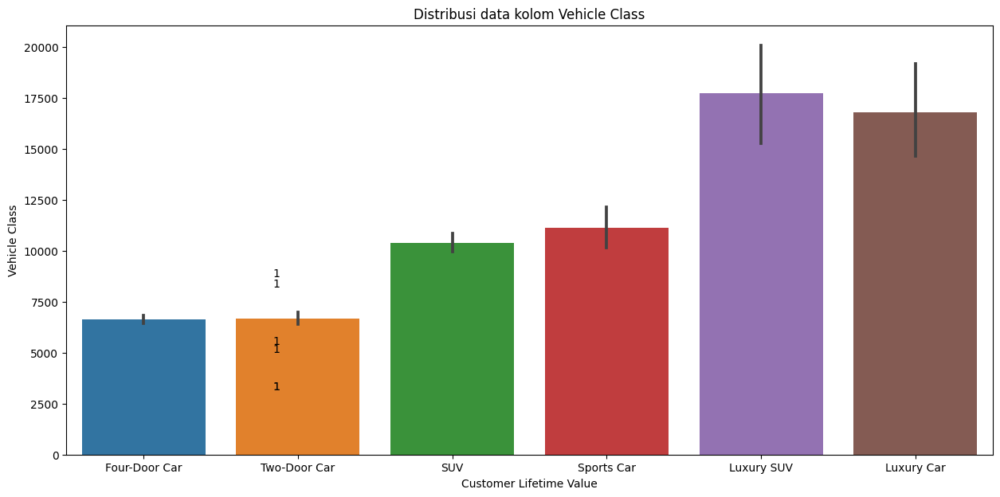

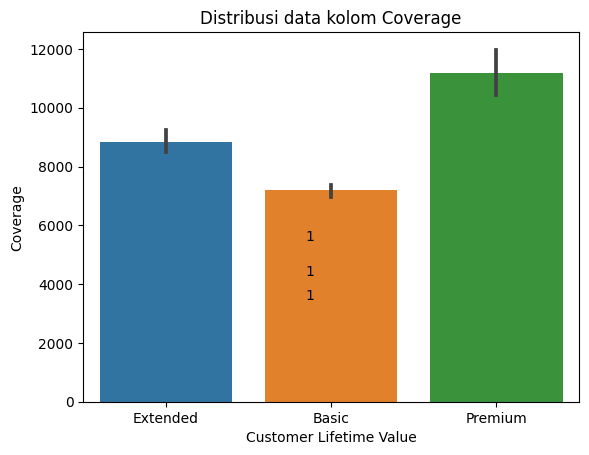

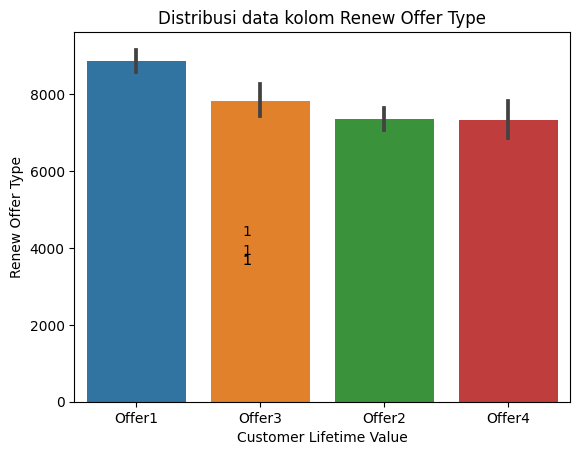

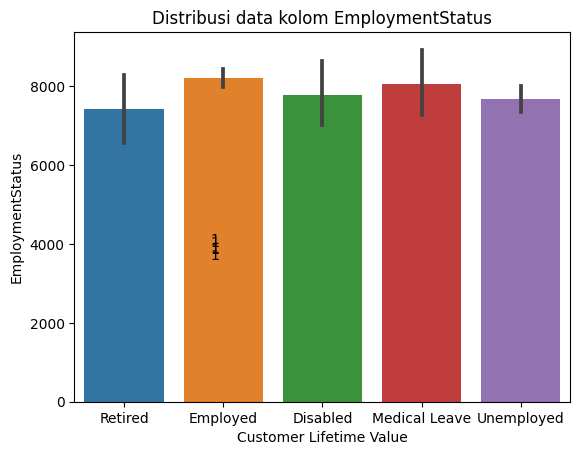

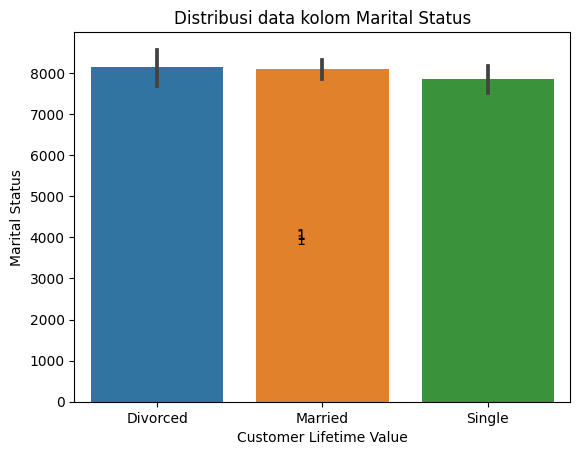

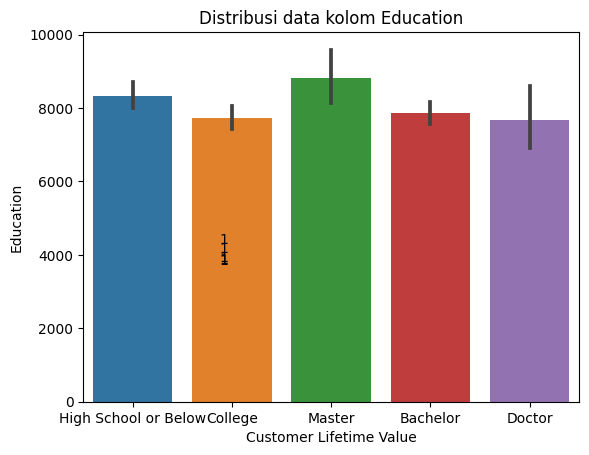

In [ ]:
#sebaran Customer Lifetime Value terhadap kolom kategorikal
plt.figure(figsize = (15,7))

for col in clv.dtypes[clv.dtypes == object].index :
  x, y = clv[col], clv['Customer Lifetime Value']
  clv_bar = sns.barplot(x = x, y = y)
  plt.title(f'Distribusi data kolom {col}')
  plt.ylabel(f'{col}')
  plt.xlabel('Customer Lifetime Value')

  for i, p in enumerate(clv_bar.patches):
    clv_bar.annotate('{:,.0f}'.format(p.get_width()), 
                             (p.get_width(), p.get_y() + p.get_height() / 2.),
                             ha='left', va='center',
                             xytext=(5, 0),
                             textcoords='offset points')
    
  plt.show()

Kalau kita lihat data di atas, jenis kendaraan yang diasuransikan terutama Luxury Car, sangat berpengaruh terhadap besarnya Customer Lifetime Value. Possibility bahwa Customer Lifetime Value meningkat apabila kendaraan yang diasuransikan berjenis Luxury Car, diikuti dengan jenis kendaraan Sports Car dan SUV dan asuransi yang dipakai berjenis Premium.

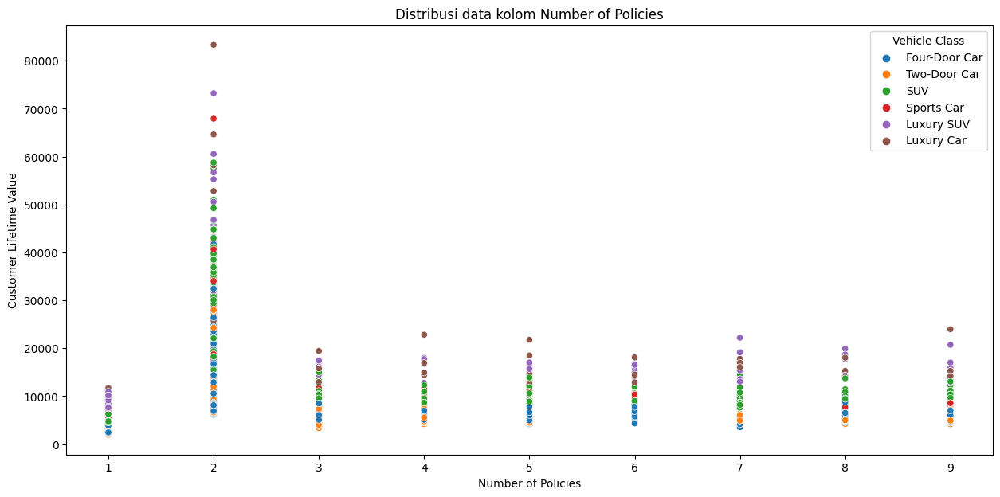

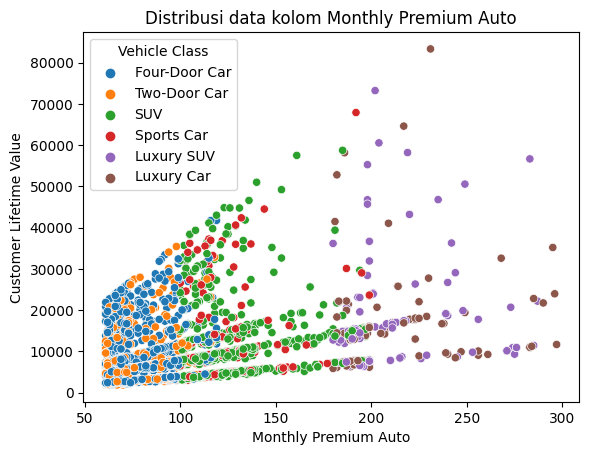

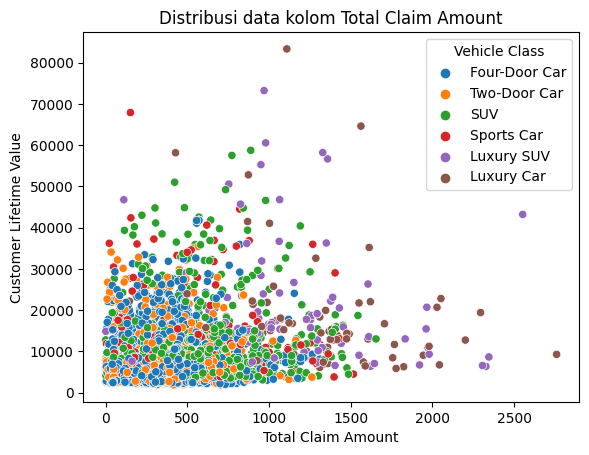

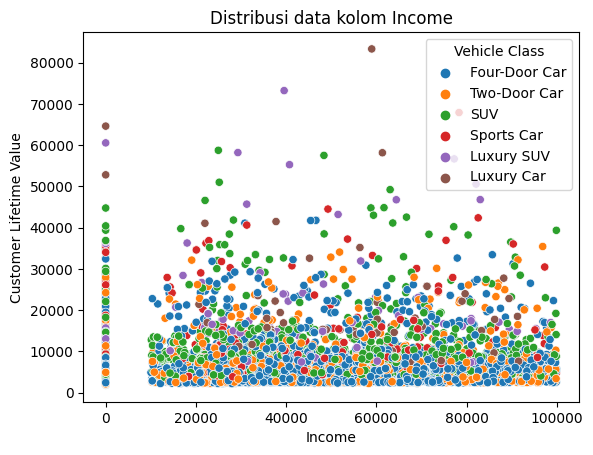

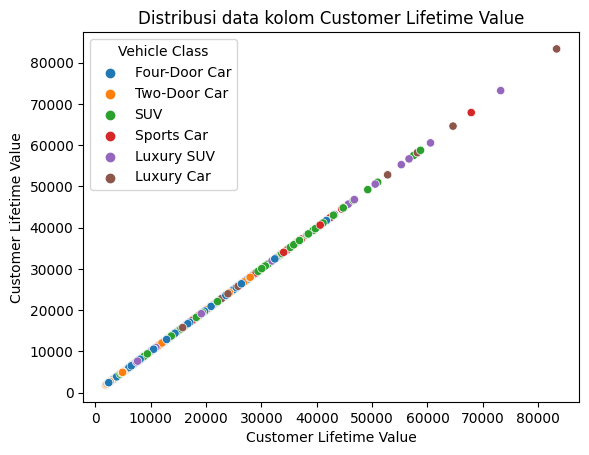

In [ ]:
#sebaran data kolom numerik dalam scatterplot
plt.figure(figsize = (15,7))

for col in clv.dtypes[clv.dtypes == float].index :
  sns.scatterplot(data=clv, y = clv['Customer Lifetime Value'], x = clv[col], hue = clv['Vehicle Class'])
  plt.title(f'Distribusi data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Customer Lifetime Value')
  plt.show()

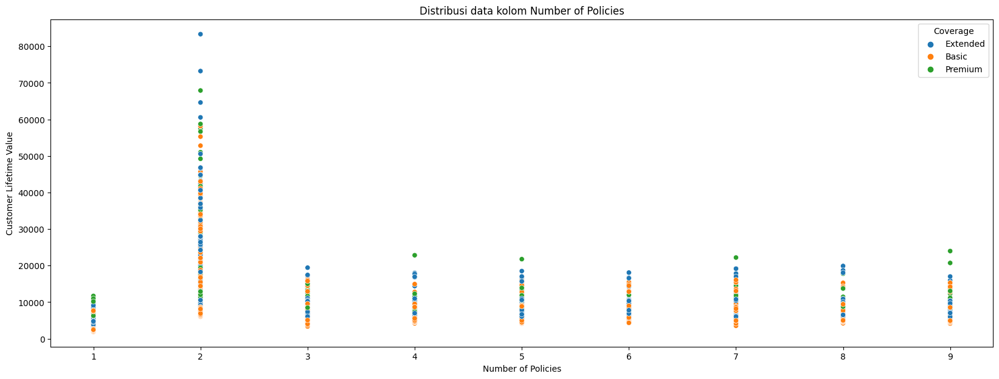

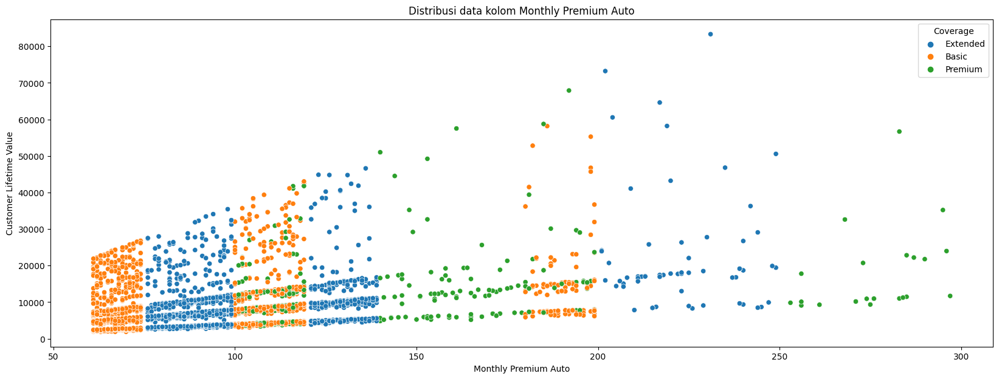

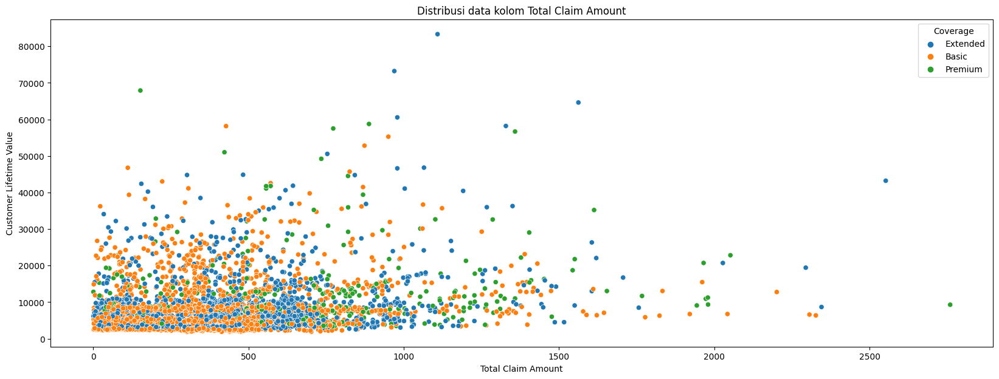

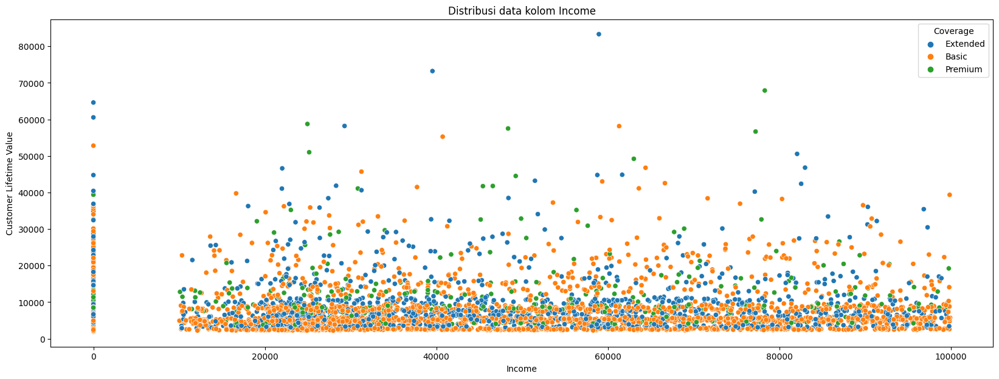

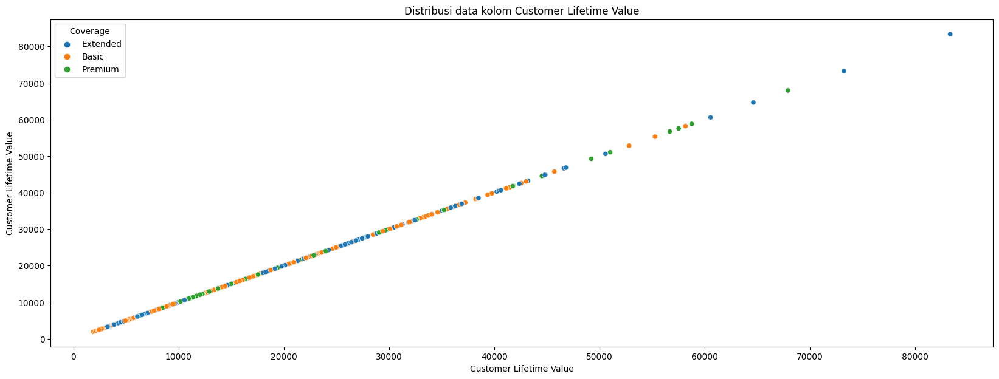

In [ ]:
#sebaran data kolom numerik dalam scatterplot

for col in clv.dtypes[clv.dtypes == float].index :
  plt.figure(figsize=(20,7))
  sns.scatterplot(data=clv, y = clv['Customer Lifetime Value'], x = clv[col], hue = clv['Coverage'])
  plt.title(f'Distribusi data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Customer Lifetime Value')
  plt.show()

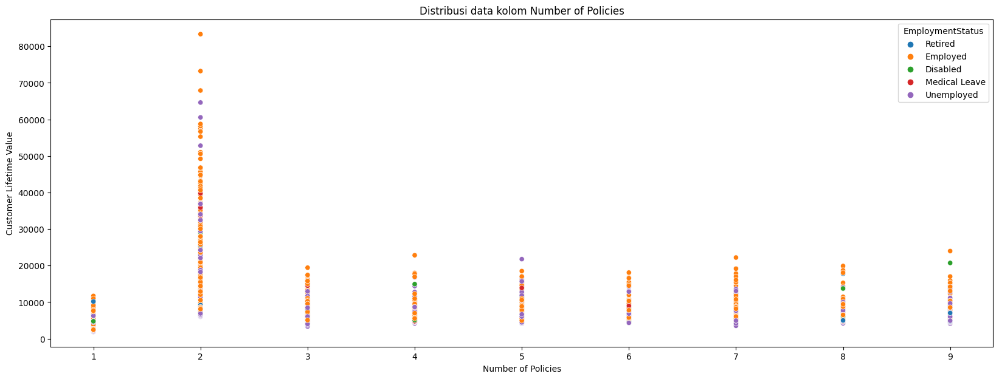

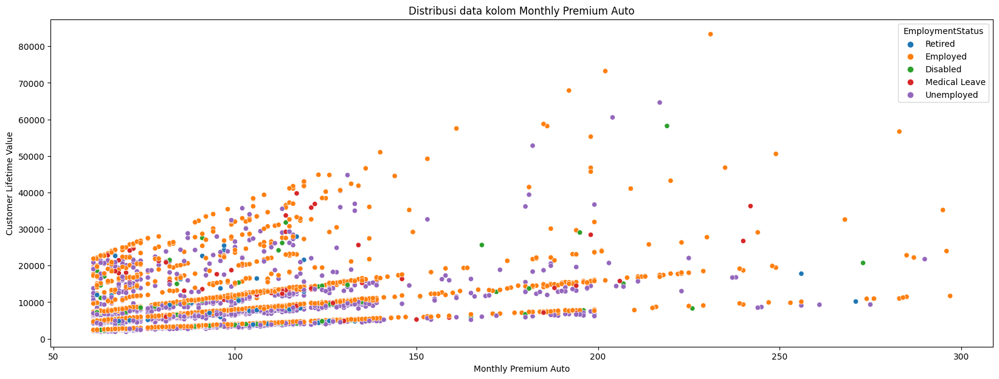

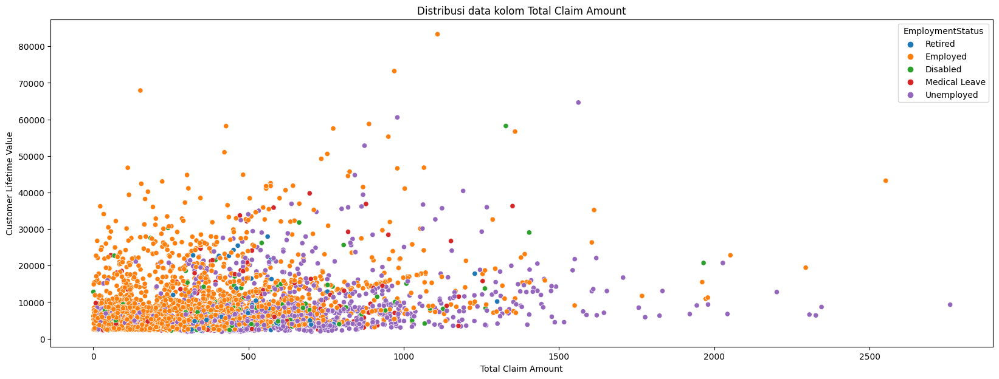

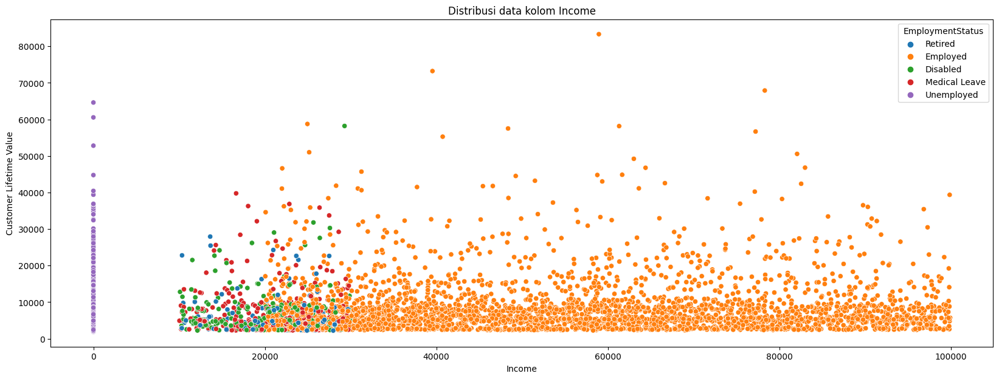

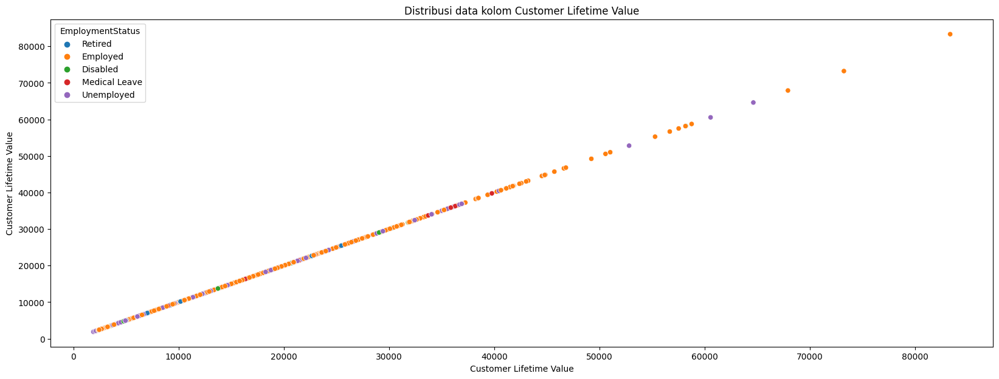

In [ ]:
#sebaran data kolom numerik dalam scatterplot

for col in clv.dtypes[clv.dtypes == float].index :
  plt.figure(figsize=(20,7))
  sns.scatterplot(data=clv, y = clv['Customer Lifetime Value'], x = clv[col], hue = clv['EmploymentStatus'])
  plt.title(f'Distribusi data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Customer Lifetime Value')
  plt.show()

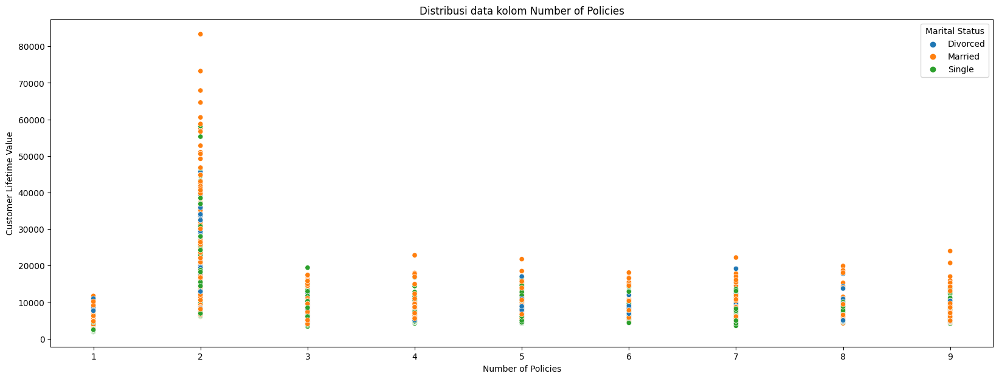

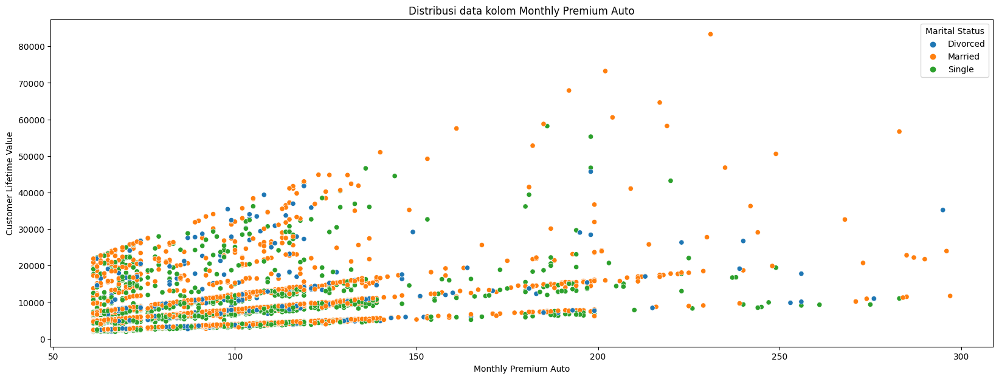

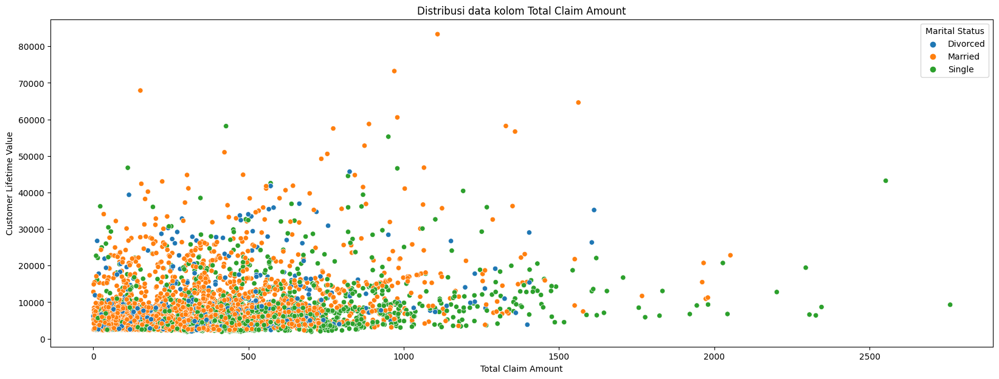

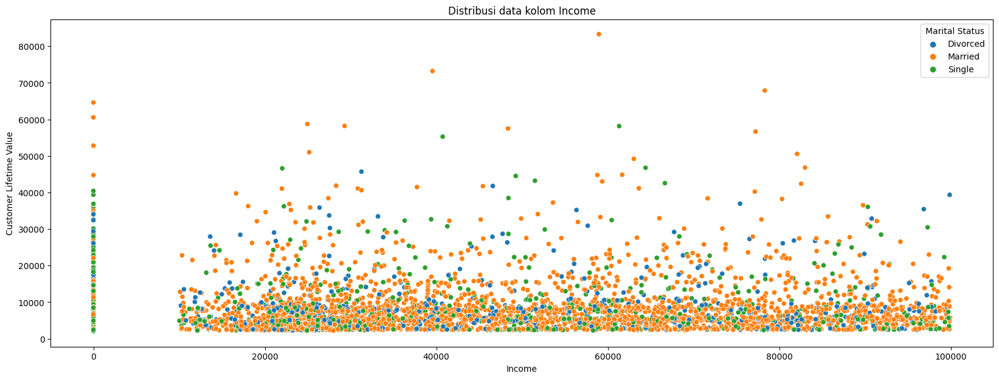

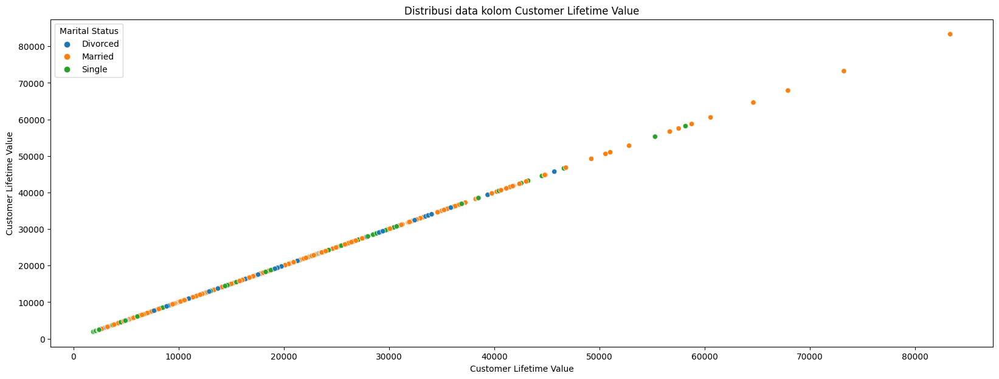

In [ ]:
#sebaran data kolom numerik dalam scatterplot

for col in clv.dtypes[clv.dtypes == float].index :
  plt.figure(figsize=(20,7))
  sns.scatterplot(data=clv, y = clv['Customer Lifetime Value'], x = clv[col], hue = clv['Marital Status'])
  plt.title(f'Distribusi data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Customer Lifetime Value')
  plt.show()

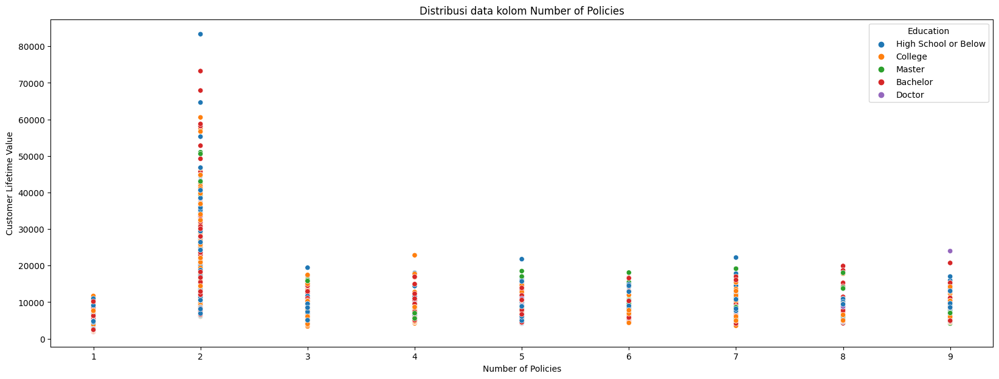

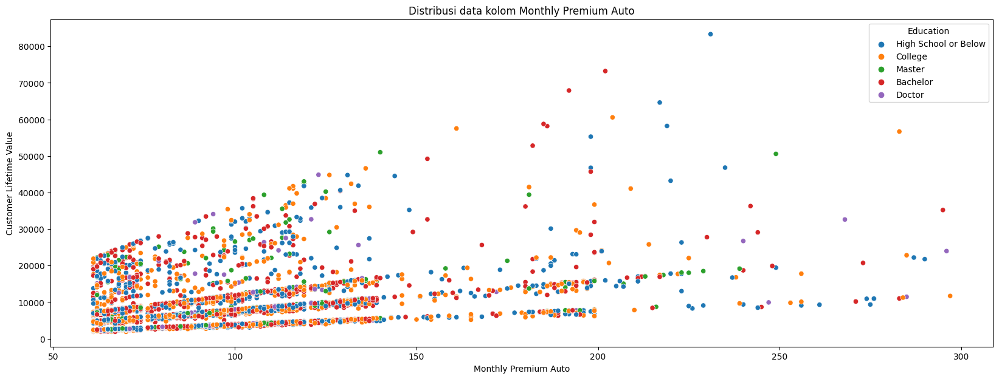

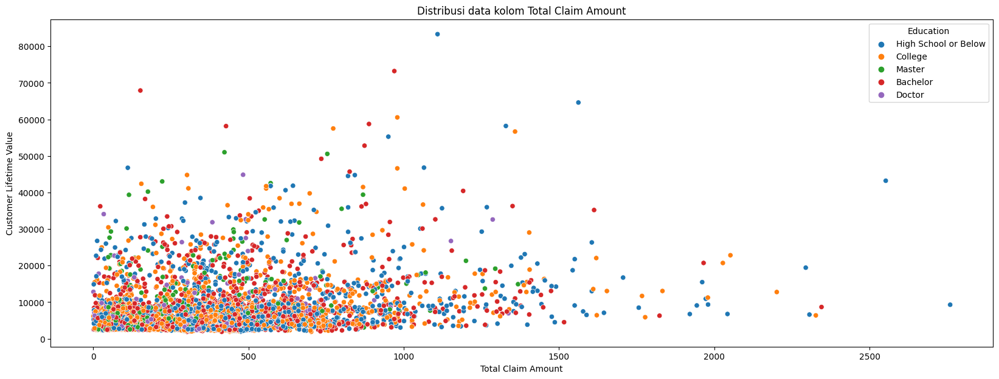

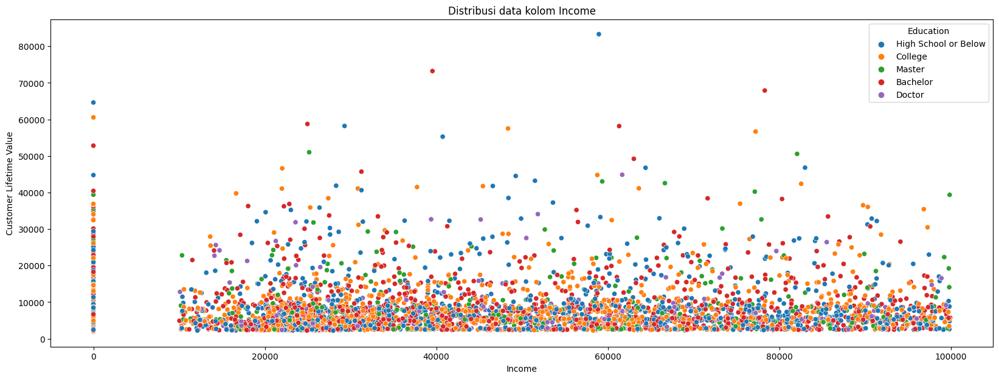

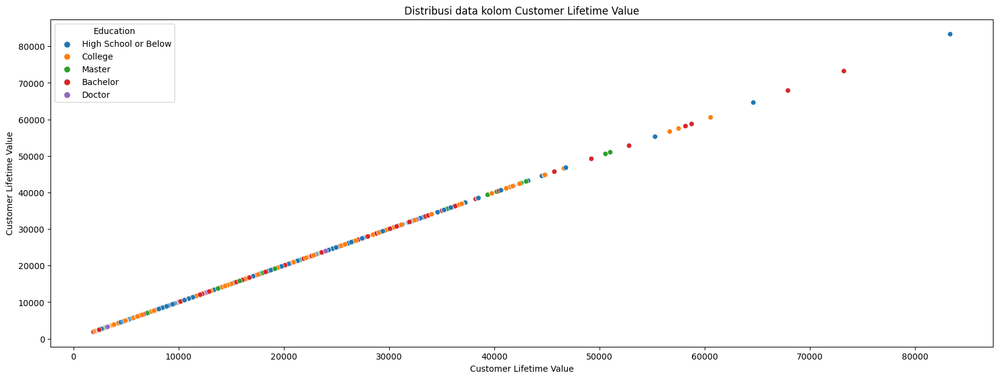

In [ ]:
#sebaran data kolom numerik dalam scatterplot

for col in clv.dtypes[clv.dtypes == float].index :
  plt.figure(figsize=(20,7))
  sns.scatterplot(data=clv, y = clv['Customer Lifetime Value'], x = clv[col], hue = clv['Education'])
  plt.title(f'Distribusi data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Customer Lifetime Value')
  plt.show()

In [ ]:
#Statistika deskriptif setiap kolom
display(clv.describe(include = 'object'),clv.describe())

,Vehicle Class,Coverage,Renew Offer Type,EmploymentStatus,Marital Status,Education
count,5669,5669,5669,5669,5669,5669
unique,6,3,4,5,3,5
top,Four-Door Car,Basic,Offer1,Employed,Married,Bachelor
freq,2858,3477,2292,3541,3305,1703


,Number of Policies,Monthly Premium Auto,Total Claim Amount,Income,Customer Lifetime Value
count,5669.000000,5669.000000,5669.000000,5669.000000,5669.000000
mean,2.979361,93.026989,431.407103,37868.188569,8029.874592
std,2.393187,34.551795,287.558038,30490.490723,6916.708246
min,1.000000,61.000000,0.423310,0.000000,1898.007675
25%,1.000000,68.000000,266.932542,0.000000,3954.344534
50%,2.000000,82.000000,379.200000,34322.000000,5800.188903
75%,4.000000,109.000000,549.986128,62464.000000,9031.214859
max,9.000000,297.000000,2759.794354,99934.000000,83325.381190


In [ ]:
#Pengujian normalitas data numerik dengan metode uji statistik
def uji_normalitas(data):
  
  print(
      '''H0 : Data tidak terdistribusi normal
         H1 : Data terdistribusi normal
      ''')
  
  for col in clv.dtypes[clv.dtypes == float].index:
    stats, p_val = shapiro(data[col])

    if p_val<0.05:
      print(f'P-value : {p_val}. Data {col} tidak terdistribusi normal, tolak H0')
    elif p_val>=0.05:
      print(f'P-value : {p_val}. Data {col} terdistribusi normal, tolak H1')

uji_normalitas(clv)

H0 : Data tidak terdistribusi normal
         H1 : Data terdistribusi normal
      
P-value : 0.0. Data Number of Policies tidak terdistribusi normal, tolak H0
P-value : 0.0. Data Monthly Premium Auto tidak terdistribusi normal, tolak H0
P-value : 0.0. Data Total Claim Amount tidak terdistribusi normal, tolak H0
P-value : 0.0. Data Income tidak terdistribusi normal, tolak H0
P-value : 0.0. Data Customer Lifetime Value tidak terdistribusi normal, tolak H0


/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [ ]:
#Uji korelasi antar kolom numerik
clv_corr = clv.corr(method = 'spearman')
clv_corr

<ipython-input-291-79a708937e60>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  clv_corr = clv.corr(method = 'spearman')


,Number of Policies,Monthly Premium Auto,Total Claim Amount,Income,Customer Lifetime Value
Number of Policies,1.000000,0.017457,-0.006175,-0.005598,0.491475
Monthly Premium Auto,0.017457,1.000000,0.531712,-0.026349,0.459641
Total Claim Amount,-0.006175,0.531712,1.000000,-0.399990,0.205196
Income,-0.005598,-0.026349,-0.399990,1.000000,0.052740
Customer Lifetime Value,0.491475,0.459641,0.205196,0.052740,1.000000


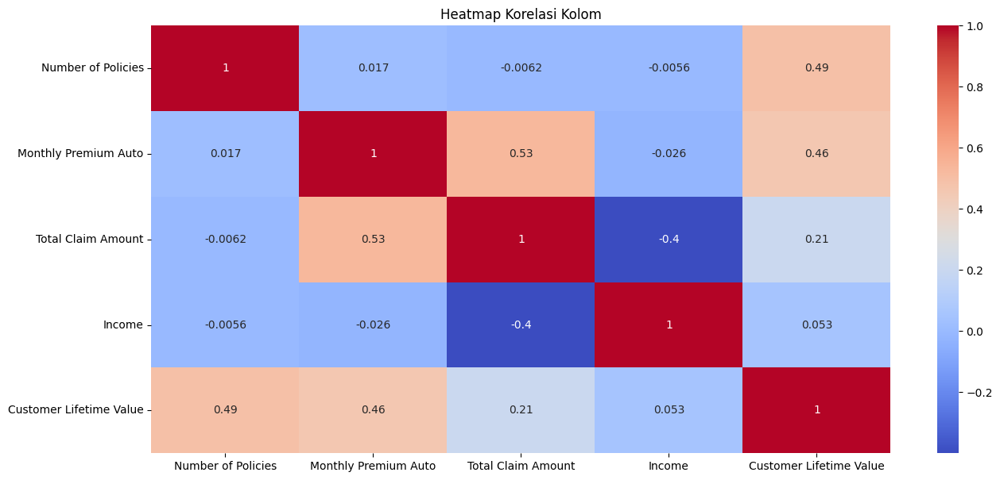

In [ ]:
#Grafik korelasi antar kolom numerik
plt.figure(figsize = (15,7))

sns.heatmap(clv_corr, annot = True, cmap = 'coolwarm')
plt.title('Heatmap Korelasi Kolom')
plt.show()

####**2. Eksplorasi Data dengan Pemodelan Supervised Learning (Linear Regression, Lasso)**

##### **Temuan 1 (Asumsi Normalitas dan Korelasi) : Data Tidak Terdistribusi Normal**

Berdasarkan analisa deskriptif, ditemukan bahwa:
1. Number of Policies, tidak terdistribusi normal (mean > median), condong kanan (negatively skewed), p-value < 0.05
2. Monthly Premium Auto, tidak terdistribusi normal (mean > median), condong kanan (negatively skewed), p-value < 0.05
3. Total Claim Amount, tidak terdistribusi normal (mean > median), condong kanan (negatively skewed), p-value < 0.05
4. Income, tidak terdistribusi normal (mean > median), condong kanan (negatively skewed), p-value < 0.05
5. Customer Lifetime Value, tidak terdistribusi normal (mean > median), condong kanan (negatively skewed), p-value < 0.05

Selain itu di identifikasi ada korelasi yang sedang antara kolom:
1. `Monthly Premium Auto` dan `Total Claim Amount`, sedang condong ke arah kuat (mendekati 1).
2. `Monthly Premium Auto`dan `Customer Lifetime Value`, sedang condong ke arah lemah (mendekati 0)
3. `Number of Policies`dan `Customer Lifetime Value`, sedang condong ke arah lemah (mendekati 0).

Mengenai validitas temuan ini, nantinya akan kita uji kausalitas antar kolom numerik dengan menggunakan metode analisa regresi linear.

##### **Analisa Uji Multikolinearitas, Asumsi Gauss-Markov, Heteroskedastisitas**


######**1. Uji Model terhadap Multikolinearitas**

Kita akan menguji adanya hubungan antar variabel numerik (multikolinearitas) menggunakan suatu model regresi dengan variabel dependen (y) yaitu `Customer Lifetime Value` dan variabel independen yaitu `Number of Policies`,	`Monthly Premium Auto`,	`Total Claim Amount`, dan	`Income`, dengan hipotesa :

1. **Tolak H0** jika minimal ada salah satu variabel independen yang berpengaruh terhadap *Customer Lifetime Value* (Prob. F-Statistic < 0.05).
2. **Tolak H1** jika tidak terbukti minimal ada salah satu variabel independen yang berpengaruh terhadap *Customer Lifetime Value*(Prob. F-Statistic > 0.05).

**Tanda-tanda terjadinya multikolinearitas** antara lain:
1. **Nilai R2 tinggi / signifikan** tapi hanya sedikit variabel yang signfikan secara uji-t.
2. **Prob. F-Statistic selalu menolak H0**, tapi tidak ada variabel independen yang menolak H0 masing-masing uji-t.
3. **Korelasi antar pasangan variabel x (variabel independen) lebih besar** dibandingkan korelasi antara masing-masing variabel x dan variabel y (variabel dependen).

In [ ]:
#definisikan variabel dependen dan independen
y = clv[['Customer Lifetime Value']] #variabel dependen
x = clv[['Number of Policies', 'Monthly Premium Auto', 'Total Claim Amount','Income']] #variabel independen
x = sm.add_constant(x) # add constant

In [ ]:
# pemodelan linear beserta hasilnya
model = sm.OLS(y,x) # definisi model
result = model.fit()
print(result.summary())#munculkan hasil

                               OLS Regression Results                              
Dep. Variable:     Customer Lifetime Value   R-squared:                       0.165
Model:                                 OLS   Adj. R-squared:                  0.165
Method:                      Least Squares   F-statistic:                     280.3
Date:                     Mon, 29 May 2023   Prob (F-statistic):          3.62e-220
Time:                             07:22:40   Log-Likelihood:                -57655.
No. Observations:                     5669   AIC:                         1.153e+05
Df Residuals:                         5664   BIC:                         1.154e+05
Df Model:                                4                                         
Covariance Type:                 nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

**Summary :**
1. **Adj. R-Squared 16.5%**, artinya variabel numerik yang dimodelkan dapat menjelaskan variasi nilai *Customer Lifetime Value* sebesar 16.5%, sisanya dijelaskan oleh variabel lain yang tidak di include pada model.
2. **Prob(F-Statistic): 0.000...000362 < 0.05 (tolak H0)**, artinya minimal ada salah satu variabel independen yang berpengaruh terhadap *Customer Lifetime Value*.
3. **Uji T.prob masing-masing variabel b0,b1,b2,b3,b4**:
    *   prob b0 : 0.588 > 0.05 (terima H0), model tidak memerlukan intercept.
    *   prob b1 : 0.064 > 0.05 (terima H0), artinya `Number of Policies` tidak berpengaruh terhadap `Customer Lifetime Value`.
    *   prob b2 : 0.000 < 0.05 (tolak H0), artinya `Monthly Premium Auto` berpengaruh terhadap `Customer Lifetime Value`.
    *   prob b3 : 0.000 < 0.05 (tolak H0), artinya `Total Claim Amount` berpengaruh terhadap `Customer Lifetime Value`.
    *   prob b4 : 0.400 > 0.05 (terima H0), artinya `Income` tidak berpengaruh terhadap `Customer Lifetime Value`.



In [ ]:
# pengujian multikolinearitas menggunakan vif
# import modul vif
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
# membuat fungsi uji vif
def kalkulasi_vif(x):
  vif=pd.DataFrame()
  vif['variabel']=x.columns
  vif['vif']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
  return vif

In [ ]:
#drop konstanta x
x_vif = x.drop(columns = 'const')
x_vif.head(3)

,Number of Policies,Monthly Premium Auto,Total Claim Amount,Income
0,2.0,90.0,571.479602,11828.0
1,6.0,62.0,114.514440,44762.0
2,2.0,62.0,257.248789,21514.0


In [ ]:
#hasil perhitungan vif
kalkulasi_vif(x_vif)

,variabel,vif
0,Number of Policies,2.211783
1,Monthly Premium Auto,10.991837
2,Total Claim Amount,6.741815
3,Income,2.699565


Ada indikasi masalah multikolinearitas yang serius karena vif > 4 (diatas 10) yang terjadi antara variabel **Monthly Premium Auto** dan **Total claim Amount**, yang ternyata sudah kita identifikasi korelasinya pada heatmap sebelumnya.

Maka untuk menangani multikolinearitas tersebut, maka akan ada beberapa alternatif pendekatan:

1. **Menghapus satu atau lebih variabel independen yang berkorelasi tinggi**: Dalam beberapa kasus, salah satu atau beberapa variabel independen yang berkorelasi tinggi dapat dihapus dari model. Ini dapat membantu mengurangi efek multikolinearitas pada model, tetapi juga dapat mengurangi akurasi model dan informasi yang terkandung dalam data.

2. **Menggabungkan variabel independen yang berkorelasi tinggi**: Dalam beberapa kasus, beberapa variabel independen yang berkorelasi tinggi dapat digabungkan menjadi satu variabel baru. Ini dapat membantu mengurangi efek multikolinearitas pada model dan mempertahankan informasi yang terkandung dalam data.

3. **Menggunakan teknik regularisasi**: Teknik regularisasi, seperti Ridge Regression atau Lasso Regression, dapat membantu menangani multikolinearitas dalam model regresi dengan mengurangi koefisien variabel independen yang tidak penting atau yang berkorelasi tinggi.

4. **Menggunakan analisis komponen utama (PCA)**: Analisis komponen utama dapat digunakan untuk mengurangi dimensi variabel independen dalam model regresi. Ini dapat membantu mengurangi efek multikolinearitas dan meningkatkan akurasi model.

5. **Menggunakan metode lain selain regresi linear**: Jika masalah multikolinearitas tetap terjadi dan tidak dapat diatasi, mungkin perlu menggunakan metode analisa regresi data lain yang tidak terlalu mempertimbangkan masalah korelasi seperti **RandomForestRegressor**.


######**2. Uji VIF dengan menghapus kolom yang berkorelasi**

Kita akan menguji ulang tingkat korelasi variabel independen yaitu menghapus 1 variabel yang berkorelasi tinggi (dalam hal ini yang nilai korelasinya terhadap `Customer Lifetime Value` lebih kecil yaitu **Total Claim Amount**).

In [ ]:
# Mengubah variabel x
x = clv[['Number of Policies', 'Monthly Premium Auto','Income']] #perubahan variabel independen
x = sm.add_constant(x) # add constant

In [ ]:
# pemodelan linear beserta hasilnya
model = sm.OLS(y,x) # definisi model
result = model.fit()
print(result.summary())#munculkan hasil

                               OLS Regression Results                              
Dep. Variable:     Customer Lifetime Value   R-squared:                       0.163
Model:                                 OLS   Adj. R-squared:                  0.163
Method:                      Least Squares   F-statistic:                     368.8
Date:                     Mon, 29 May 2023   Prob (F-statistic):          8.23e-219
Time:                             07:22:40   Log-Likelihood:                -57661.
No. Observations:                     5669   AIC:                         1.153e+05
Df Residuals:                         5665   BIC:                         1.154e+05
Df Model:                                3                                         
Covariance Type:                 nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

**Summary :**
1. **Adj. R-Squared 16.3%**, artinya variabel numerik yang dimodelkan dapat menjelaskan variasi nilai *Customer Lifetime Value* sebesar 5.9%, sisanya dijelaskan oleh variabel lain yang tidak di include pada model.
2. **Prob(F-Statistic): 0.000...000058 < 0.05 (tolak H0)**, artinyminimal ada salah satu variabel independen yang berpengaruh terhadap *Customer Lifetime Value*.
3. **Uji T.prob masing-masing variabel b0,b1,b2,b3**:
    *   prob b0 : 0.000 > 0.05 (terima H0), model memerlukan intercept.
    *   prob b1 : 0.061 > 0.05 (terima H0), artinya `Number of Policies` tidak berpengaruh terhadap `Customer Lifetime Value`.
    *   prob b2 : 0.000 < 0.05 (tolak H0), artinya `Total Claim Amount` berpengaruh terhadap `Customer Lifetime Value`.
    *   prob b3 : 0.000 > 0.05 (terima H0), artinya `Income` berpengaruh terhadap `Customer Lifetime Value`.


In [ ]:
#hasil perhitungan vif
x_vif = x.drop(columns = 'const')
kalkulasi_vif(x_vif)

,variabel,vif
0,Number of Policies,2.208715
1,Monthly Premium Auto,2.968824
2,Income,2.170171


###### **3. Uji Asumsi Gauss-Markov dan Heteroskedastisitas**

Dengan syarat :
1. Membandingkan residual dengan garis 0, untuk memeriksa rataan error (rataan error = 0).
2. Error tidak saling berkorelasi / tidak berpola.
3. Ragam error homogen (homoskedastisitas).

**Problem yang ditemukan dalam model**

Dalam grafik diatas, kita melihat :

1. Rataan error tidak terpusat pada nilai 0, dan condong berada diatas nilai 0 dengan pada prediksi yang bernilai kecil, dan condong dibawah 0 ketika nilai prediksi semakin besar (kemungkinan bias besar).
2. Posisi error bergantung pada besarnya nilai Y, semakin kecil nilai prediksi, nilai error cenderung melebihi nilai prediksi, semakin besar nilai prediksi, nilai error cenderung kurang dari nilai prediksi (nilai R-Square tidak akurat, dan mungkin hubungan variabel dengan hasil prediksi tidak akurat).
3. Standar deviasi tidak konstan, semakin besar nilai prediksi, ragam semakin besar dan semakin tidak akurat (performa hasil prediksi tidak stabil dan tidak dapat diandalkan).

Grafik sebaran residual menandakan semua asumsi *Gauss-Markov* dilanggar, sehingga probabilitas terjadinya bias pada nilai prediksi dalam model sebelumnya besar dan kita **harus melakukan modelling ulang dan mengkaji kembali hasil Temuan 1** dengan: 
1. Mengeluarkan variabel yang dianggap tidak representatif untuk membangun model dan yang terindikasi multikolinear terhadap variabel lainnya.
2. Melakukan feature engineering terhadap dataframe.
3. Membuang outliers yang mengganggu pola data.

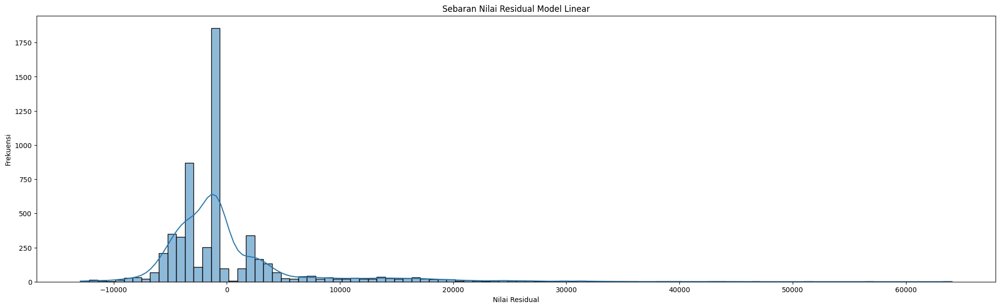

In [ ]:
# nilai residual model
plt.figure(figsize = (25,7))
sns.histplot(result.resid, bins = 100, kde = True)
plt.title("Sebaran Nilai Residual Model Linear")
plt.xlabel("Nilai Residual")
plt.ylabel("Frekuensi")
plt.show()

Data tidak tersebar normal (condong ke arah kiri, positively skewed), asumsi normalitas residual tidak terpenuhi

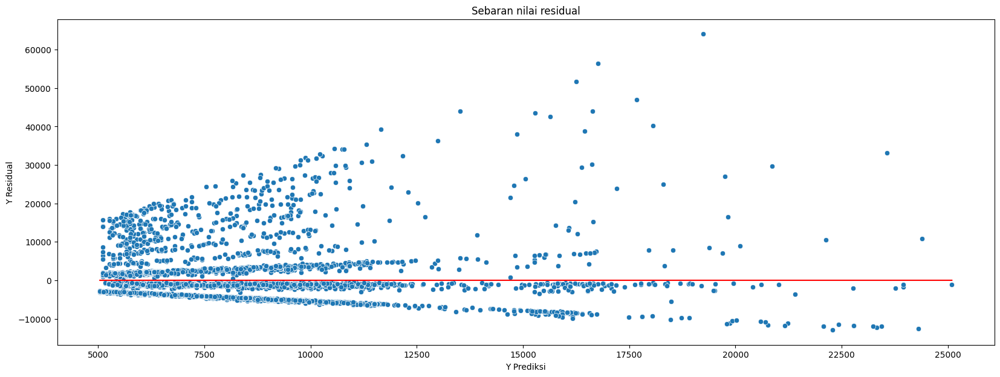

In [ ]:
# memeriksa relasi nilai prediksi Y dengan residual
plt.figure(figsize=(20,7))

sns.scatterplot(x = result.fittedvalues, y=result.resid)
sns.lineplot(x = result.fittedvalues, y=0, color="red")

plt.title('Sebaran nilai residual')
plt.xlabel('Y Prediksi')
plt.ylabel('Y Residual')

plt.show()

#### **3. Eksplorasi Variabel dengan metode Unsupervised Learning (PCA)**





In [37]:
## import librar PCA dan preprocessor Robust Scaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.decomposition import PCA
from sklearn.preprocessing import RobustScaler

In [ ]:
# Deklarasi variabel x,y, dan pca_onehotvar
x_pca = clv.copy().drop(columns = 'Customer Lifetime Value')
y_pca = clv[['Customer Lifetime Value']]
pca_onehotvar = ['Vehicle Class', 'Coverage', 'Renew Offer Type', 'EmploymentStatus', 'Marital Status', 'Education']
pca_robustvar = list(x_pca.select_dtypes(include='float').columns)

In [ ]:
feature_names = ['robust__Number of Policies', 'robust__Monthly Premium Auto',
       'robust__Total Claim Amount', 'robust__Income',
       'onehot__Vehicle Class_Luxury Car',
       'onehot__Vehicle Class_Luxury SUV', 'onehot__Vehicle Class_SUV',
       'onehot__Vehicle Class_Sports Car',
       'onehot__Vehicle Class_Two-Door Car', 'onehot__Coverage_Extended',
       'onehot__Coverage_Premium', 'onehot__Renew Offer Type_Offer2',
       'onehot__Renew Offer Type_Offer3',
       'onehot__Renew Offer Type_Offer4',
       'onehot__EmploymentStatus_Employed',
       'onehot__EmploymentStatus_Medical Leave',
       'onehot__EmploymentStatus_Retired',
       'onehot__EmploymentStatus_Unemployed',
       'onehot__Marital Status_Married', 'onehot__Marital Status_Single',
       'onehot__Education_College', 'onehot__Education_Doctor',
       'onehot__Education_High School or Below',
       'onehot__Education_Master']

In [ ]:
# scaling menggunakan one hot encoder Robust Scaler karena kita menemukan rentang outliers yang cukup besar
robust = RobustScaler()
onehot = OneHotEncoder(drop = 'first')

In [ ]:
## deklarasi algoritma PCA
pca = PCA(n_components = 24)

In [ ]:
## deklarasi transformer untuk pca preprocesss
pca_transformer = ColumnTransformer([
    ('robust',robust,pca_robustvar),
    ('onehot',onehot,pca_onehotvar)
], remainder = 'passthrough')

In [ ]:
## deklrasi transformer penyimpan data frame
to_df = FunctionTransformer(lambda X: pd.DataFrame(X,columns = feature_names))
transformer_2 = to_df

## deklarasi pipeline PCA
pca_pipeline = Pipeline([
    ('pca_transformer',pca_transformer),
    ('transformer_2', transformer_2),
    ('pca',pca)
])

pca_pipeline

Pipeline(steps=[('pca_transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('robust', RobustScaler(),
                                                  ['Number of Policies',
                                                   'Monthly Premium Auto',
                                                   'Total Claim Amount',
                                                   'Income']),
                                                 ('onehot',
                                                  OneHotEncoder(drop='first'),
                                                  ['Vehicle Class', 'Coverage',
                                                   'Renew Offer Type',
                                                   'EmploymentStatus',
                                                   'Marital Status',
                                                   'Education'])])),
                ('transformer_2',
                 FunctionTransformer(func=<function <lambda> at 0x7f06dfdfc430>)),
                ('pca', PCA(n_components=24))])

In [ ]:
# fit pipeline pca terhadap data x_pca
x_pca = pca_pipeline.fit_transform(x_pca)

In [ ]:
# mengubah data hasil pca menjadi dataframe
df_x_pca = pd.DataFrame(data = x_pca, columns = feature_names)
df_x_pca

,robust__Number of Policies,robust__Monthly Premium Auto,robust__Total Claim Amount,robust__Income,onehot__Vehicle Class_Luxury Car,onehot__Vehicle Class_Luxury SUV,onehot__Vehicle Class_SUV,onehot__Vehicle Class_Sports Car,onehot__Vehicle Class_Two-Door Car,onehot__Coverage_Extended,onehot__Coverage_Premium,onehot__Renew Offer Type_Offer2,onehot__Renew Offer Type_Offer3,onehot__Renew Offer Type_Offer4,onehot__EmploymentStatus_Employed,onehot__EmploymentStatus_Medical Leave,onehot__EmploymentStatus_Retired,onehot__EmploymentStatus_Unemployed,onehot__Marital Status_Married,onehot__Marital Status_Single,onehot__Education_College,onehot__Education_Doctor,onehot__Education_High School or Below,onehot__Education_Master
0,0.572295,-0.583711,-0.312649,0.468355,-0.026022,-0.509660,0.429500,-0.493465,-0.344640,-0.134026,0.014759,0.242499,1.006446,-0.116083,-0.132906,-0.061443,0.387233,-0.051520,-0.044798,0.730593,0.156753,0.034939,-0.178357,0.016770
1,-1.466470,0.174217,1.015998,-0.660816,-0.211295,0.196432,-0.357323,0.040719,-0.268101,-0.281759,-0.065620,0.219528,0.036347,-0.221578,-0.079806,-0.092193,-0.140397,0.214863,-0.140987,0.003749,0.052056,-0.002672,-0.008927,-0.017184
2,-0.959204,-0.530684,-0.312577,0.020511,-0.673048,-0.118881,-0.249620,-0.143315,0.766789,0.435753,0.490596,-0.281480,0.614748,0.210215,-0.615318,-0.191282,-0.249467,0.017096,-0.014498,0.839520,0.309775,0.012914,-0.190445,-0.022448
3,0.753818,0.105676,-0.636648,0.379116,-0.654913,-0.824951,-0.505550,0.213270,0.238364,0.063954,-0.827426,0.292401,0.275265,0.011052,-0.103698,0.720928,0.062725,-0.024957,0.115513,0.182884,0.036455,0.017684,0.399987,0.011079
4,-0.640358,-0.658163,-0.619285,0.605010,-0.757265,-0.579932,-0.588039,-0.379183,0.353425,0.054969,-0.668968,-0.448099,0.727467,0.581276,0.135590,0.190456,-0.287356,-0.095508,-0.022159,-0.410846,-0.088217,0.003342,-0.111372,-0.020884
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5664,0.425270,-1.538501,-0.657639,0.453968,0.237924,-0.584397,-0.183647,0.151207,-0.147094,-0.625535,0.398148,0.330899,-0.415429,0.385542,0.018750,0.108958,0.124742,-0.070431,-0.033191,0.011899,0.017494,-0.015715,-0.006510,0.038152
5665,0.464894,0.283182,-0.338531,-0.067881,0.383832,-0.147212,-0.433133,0.265207,0.345304,0.194135,0.198316,0.428637,0.322494,-0.669565,-0.019840,0.447680,0.487729,0.284893,0.065164,-0.092705,-0.164939,0.029024,-0.030924,-0.029128
5666,-1.566297,-0.131870,-0.651255,-0.129616,1.217278,-0.308405,-0.121100,0.285220,-0.035193,0.137954,0.227909,0.181653,-0.056436,-0.248599,0.193618,-0.041033,-0.403007,-0.185862,-0.099915,0.080496,-0.113002,-0.004257,0.013587,-0.017040
5667,4.290269,1.792435,1.272673,0.083152,0.434238,0.470095,0.764466,-0.199120,0.734812,0.676753,0.226910,0.520190,0.168197,0.490823,-0.484045,-0.424263,0.576979,0.281357,-0.599859,-0.172200,0.059757,-0.641062,0.005653,0.049037


In [ ]:
## membuat dataframe components PCA
pca_components = pd.DataFrame(data = pca.components_, columns = feature_names)

top_component = []

## mencari variabel terbesar yang menjadi variabel utama pada setiap komponen
for i in range(0,pca_components.shape[1]):
  for col in pca_components:
    if np.absolute(pca_components.loc[i,col]) == np.max(np.absolute(pca_components.iloc[i])):
      top_component.append(col)

## melihat hasil top component pada setiap PCA  
top_component

['robust__Total Claim Amount',
 'robust__Monthly Premium Auto',
 'robust__Number of Policies',
 'onehot__Education_High School or Below',
 'onehot__Marital Status_Married',
 'onehot__Renew Offer Type_Offer2',
 'onehot__Coverage_Extended',
 'onehot__Coverage_Extended',
 'onehot__Vehicle Class_Two-Door Car',
 'onehot__Education_High School or Below',
 'onehot__Renew Offer Type_Offer3',
 'onehot__Vehicle Class_SUV',
 'onehot__EmploymentStatus_Unemployed',
 'onehot__Renew Offer Type_Offer4',
 'onehot__Education_Master',
 'onehot__Coverage_Premium',
 'onehot__Marital Status_Single',
 'robust__Income',
 'onehot__Vehicle Class_Sports Car',
 'onehot__EmploymentStatus_Retired',
 'onehot__Education_Doctor',
 'onehot__Vehicle Class_Luxury Car',
 'onehot__EmploymentStatus_Retired',
 'onehot__Vehicle Class_Luxury SUV']

In [ ]:
pca_names = pca.get_feature_names_out()
pca_names

array(['pca0', 'pca1', 'pca2', 'pca3', 'pca4', 'pca5', 'pca6', 'pca7',
       'pca8', 'pca9', 'pca10', 'pca11', 'pca12', 'pca13', 'pca14',
       'pca15', 'pca16', 'pca17', 'pca18', 'pca19', 'pca20', 'pca21',
       'pca22', 'pca23'], dtype=object)

In [ ]:
## mencari variabel independen dengan pengaruh tertinggi
top_var = pca_components.copy()
top_var['pca_var'] = pca_names
top_var['top_var']= top_component
top_var

,robust__Number of Policies,robust__Monthly Premium Auto,robust__Total Claim Amount,robust__Income,onehot__Vehicle Class_Luxury Car,onehot__Vehicle Class_Luxury SUV,onehot__Vehicle Class_SUV,onehot__Vehicle Class_Sports Car,onehot__Vehicle Class_Two-Door Car,onehot__Coverage_Extended,onehot__Coverage_Premium,onehot__Renew Offer Type_Offer2,onehot__Renew Offer Type_Offer3,onehot__Renew Offer Type_Offer4,onehot__EmploymentStatus_Employed,onehot__EmploymentStatus_Medical Leave,onehot__EmploymentStatus_Retired,onehot__EmploymentStatus_Unemployed,onehot__Marital Status_Married,onehot__Marital Status_Single,onehot__Education_College,onehot__Education_Doctor,onehot__Education_High School or Below,onehot__Education_Master,pca_var,top_var
0,0.007906,0.538075,0.773936,-0.151384,0.041055,0.043892,0.106008,0.024702,-0.070823,0.061436,0.065545,-0.040482,-0.006168,-0.017905,-0.143840,0.003108,0.006156,0.128410,-0.093960,0.099771,-0.006977,-0.008750,0.040202,-0.014955,pca0,robust__Total Claim Amount
1,0.004870,0.507620,-0.077292,0.431470,0.035784,0.041048,0.102056,0.024801,-0.069494,0.056702,0.065095,0.073659,-0.003859,0.026561,0.440179,-0.023273,-0.018041,-0.381866,0.300489,-0.289966,0.002139,0.014493,-0.041682,0.031007,pca1,robust__Monthly Premium Auto
2,0.998275,-0.006587,-0.008807,-0.006164,0.000212,-0.000926,-0.000510,0.000971,-0.006935,0.005061,-0.008853,-0.022809,-0.003529,-0.030039,0.001698,0.000627,-0.011427,0.012142,0.019095,-0.005642,-0.023044,0.002020,0.021969,0.001621,pca2,robust__Number of Policies
3,-0.019040,-0.213851,0.228052,0.114155,-0.003633,-0.006968,-0.119565,-0.014476,0.118980,-0.063889,-0.002165,0.330630,-0.105783,-0.022265,0.103023,-0.017023,-0.010262,-0.069407,0.074530,-0.033887,-0.591157,-0.000493,0.602394,-0.013424,pca3,onehot__Education_High School or Below
4,0.017513,0.048549,-0.042022,0.317872,0.009380,0.007038,-0.023972,0.001999,-0.005663,0.017519,0.004640,-0.024820,-0.003035,-0.025122,0.304043,-0.063629,-0.017977,-0.171253,-0.689048,0.539096,-0.016239,-0.010912,0.010120,0.012538,pca4,onehot__Marital Status_Married
5,0.029723,-0.240268,0.304245,0.088605,-0.002683,-0.011280,-0.118865,-0.018408,0.148701,-0.091337,-0.004706,0.651997,-0.266254,-0.125981,0.095793,-0.010398,0.001419,-0.066308,0.035172,0.002132,0.403896,-0.009225,-0.322057,-0.046557,pca5,onehot__Renew Offer Type_Offer2
6,-0.005108,0.270993,-0.335478,-0.149550,-0.008411,0.002303,0.067850,0.022377,-0.082242,0.675016,-0.123768,0.414107,-0.226443,-0.119783,-0.154956,-0.002625,0.009883,0.155058,-0.076322,0.066366,-0.097890,0.024135,0.043627,0.033916,pca6,onehot__Coverage_Extended
7,0.000593,0.228343,-0.269634,-0.102095,-0.000559,-0.000446,0.338674,0.025145,-0.350309,-0.649051,0.141142,0.299420,-0.152253,-0.142292,-0.134608,0.010118,-0.001087,0.109613,-0.080934,0.060342,-0.102992,0.001466,0.023738,0.028521,pca7,onehot__Coverage_Extended
8,0.007728,0.351774,-0.193012,-0.074260,0.060435,0.075514,-0.370636,0.048684,0.687771,-0.193691,0.258114,0.023216,-0.052379,-0.004873,-0.114261,0.012996,-0.001327,0.081983,-0.041024,0.024836,-0.179807,0.030232,-0.174097,0.134373,pca8,onehot__Vehicle Class_Two-Door Car
9,-0.008094,-0.121559,0.119160,-0.012368,-0.011957,-0.004011,-0.005027,-0.014438,-0.152437,0.056300,-0.063749,0.104879,0.428320,-0.357598,0.022454,0.004429,0.008908,-0.055587,-0.019609,-0.049310,-0.473180,0.101968,-0.514480,0.334831,pca9,onehot__Education_High School or Below


In [ ]:
# uji variansi dalam model PCA
var = []

for i in range(0, x_pca.shape[1]):
  var.append(np.var(x_pca[:,i]))

In [ ]:
#melihat_features_hasil_pca
df_var = pd.DataFrame(data = var, columns = ['var'])
df_var['pca_names'] = pca_names
df_var['top_var']=top_component
df_var

,var,pca_names,top_var
0,1.567352,pca0,robust__Total Claim Amount
1,0.676275,pca1,robust__Monthly Premium Auto
2,0.637797,pca2,robust__Number of Policies
3,0.303080,pca3,onehot__Education_High School or Below
4,0.291124,pca4,onehot__Marital Status_Married
5,0.250693,pca5,onehot__Renew Offer Type_Offer2
6,0.225765,pca6,onehot__Coverage_Extended
7,0.204673,pca7,onehot__Coverage_Extended
8,0.160133,pca8,onehot__Vehicle Class_Two-Door Car
9,0.137418,pca9,onehot__Education_High School or Below


In [ ]:
## menghitung variansi total keseluruhan principal components
np.sum(var[:4])/np.sum(var)

0.6088049271652981

In [ ]:
# ten pca
df_four_pca = df_x_pca.iloc[:, :9]
df_four_pca.loc[:,'y_pca']= y_pca.values
df_four_pca

<ipython-input-319-ea21020323b8>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_four_pca.loc[:,'y_pca']= y_pca.values


,robust__Number of Policies,robust__Monthly Premium Auto,robust__Total Claim Amount,robust__Income,onehot__Vehicle Class_Luxury Car,onehot__Vehicle Class_Luxury SUV,onehot__Vehicle Class_SUV,onehot__Vehicle Class_Sports Car,onehot__Vehicle Class_Two-Door Car,y_pca
0,0.572295,-0.583711,-0.312649,0.468355,-0.026022,-0.509660,0.429500,-0.493465,-0.344640,10083.486880
1,-1.466470,0.174217,1.015998,-0.660816,-0.211295,0.196432,-0.357323,0.040719,-0.268101,4943.386117
2,-0.959204,-0.530684,-0.312577,0.020511,-0.673048,-0.118881,-0.249620,-0.143315,0.766789,11981.984810
3,0.753818,0.105676,-0.636648,0.379116,-0.654913,-0.824951,-0.505550,0.213270,0.238364,4550.856045
4,-0.640358,-0.658163,-0.619285,0.605010,-0.757265,-0.579932,-0.588039,-0.379183,0.353425,2372.155492
...,...,...,...,...,...,...,...,...,...,...
5664,0.425270,-1.538501,-0.657639,0.453968,0.237924,-0.584397,-0.183647,0.151207,-0.147094,2442.216651
5665,0.464894,0.283182,-0.338531,-0.067881,0.383832,-0.147212,-0.433133,0.265207,0.345304,12904.943360
5666,-1.566297,-0.131870,-0.651255,-0.129616,1.217278,-0.308405,-0.121100,0.285220,-0.035193,2447.053134
5667,4.290269,1.792435,1.272673,0.083152,0.434238,0.470095,0.764466,-0.199120,0.734812,19160.989940


In [ ]:
x = df_four_pca.drop(columns = 'y_pca')
y = df_four_pca['y_pca']

# pemodelan linear beserta hasilnya
model = sm.OLS(y,x) # definisi model Elastic Net
result = model.fit_regularized(alpha=1, L1_wt=0.5)
y_pred = result.fittedvalues
resid = y - y_pred

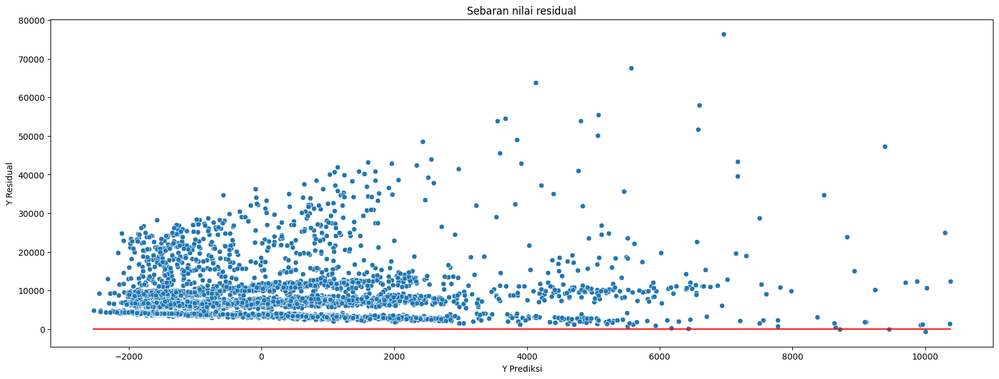

In [ ]:
# memeriksa relasi nilai prediksi Y dengan residual
plt.figure(figsize=(20,7))

sns.scatterplot(x = y_pred, y=resid)
sns.lineplot(x = y_pred, y=0, color="red")

plt.title('Sebaran nilai residual')
plt.xlabel('Y Prediksi')
plt.ylabel('Y Residual')

plt.show()

In [ ]:
## menghitung Unexplained Variation
unexplained_variaton = np.sum((y-y_pred)**2)
total_variation = np.sum((y-y.mean())**2)

In [ ]:
## menghitung r square
r2 = 1 - (unexplained_variaton/total_variation)
r2

-1.208973920253281

In [ ]:
x = df_four_pca.drop(columns = 'y_pca')
y = df_four_pca['y_pca']

#melakukan pemodelan linear terhadap component pca yang kita temukan
model = sm.OLS(y,x)
result = model.fit()
print(result.summary())

                                 OLS Regression Results                                
Dep. Variable:                  y_pca   R-squared (uncentered):                   0.071
Model:                            OLS   Adj. R-squared (uncentered):              0.070
Method:                 Least Squares   F-statistic:                              48.29
Date:                Mon, 29 May 2023   Prob (F-statistic):                    1.19e-84
Time:                        07:23:08   Log-Likelihood:                         -60377.
No. Observations:                5669   AIC:                                  1.208e+05
Df Residuals:                    5660   BIC:                                  1.208e+05
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
                                         coef    std err          t      P>|t|      [0.025      0.975]
-----------------

**Summary :**

1. **Adj. R-Squared 7.1%**, artinya variabel numerik yang dimodelkan hanya dapat menjelaskan variasi nilai *Customer Lifetime Value* sebesar 7.1%, sisanya dijelaskan oleh variabel lain yang tidak di include pada model.
2. **Prob(F-Statistic): 0.000...000119 < 0.05 (tolak H0)**, artinya minimal ada salah satu variabel independen yang berpengaruh terhadap *Customer Lifetime Value*.
3. Berdasarkan data tersebut kita menemukan bahwa pemodelan linear menggunakan hasil PCA tidak berhasil menjelaskan variansi data Customer Lifetime Value yang terdapat dalam dataset. Namun setidaknya kita menemukan bahwa variabel yang memiliki pengaruh paling besar :
  1. Number of Policies, **koefisien = 1607** (uji t prob : 0.000 < 0.05, artinya `Number of Policies` berpengaruh terhadap `Customer Lifetime Value` secara positif).
  2. Monthly Premium Auto, **koefisien = 1946** (uji t prob : 0.000 < 0.05, artinya `Monthly Premium Auto` berpengaruh terhadap `Customer Lifetime Value` secara positif).
  3. Vehicle Class Luxury SUV, **koefisien = -1556** (uji t prob : 0.000 < 0.05, artinya `Vehicle Class Luxury SUV` berpengaruh terhadap `Customer Lifetime Value` secara negatif).
  4. Vehicle Class Two-Door Car, **koefisien = 1277** (uji t prob : 0.000 < 0.05, artinya `Two-Door Car` berpengaruh terhadap `Customer Lifetime Value` secara positif).



#### **4. Eksplorasi Data dengan Mengubah DataFrame Menjadi Polynomial**

In [ ]:
## import library polynomial features
from sklearn.preprocessing import PolynomialFeatures

In [ ]:
# Deklarasi variabel x,y, dan pca_onehotvar
x_poli = clv.copy().drop(columns = 'Customer Lifetime Value')
y_poli = clv[['Customer Lifetime Value']]
poli_onehotvar = ['Vehicle Class', 'Coverage', 'Renew Offer Type', 'EmploymentStatus', 'Marital Status', 'Education']
poli_robustvar = list(x_poli.select_dtypes(include='float').columns)

In [ ]:
feature_names = ['robust__Number of Policies', 'robust__Monthly Premium Auto',
       'robust__Total Claim Amount', 'robust__Income',
       'onehot__Vehicle Class_Luxury Car',
       'onehot__Vehicle Class_Luxury SUV', 'onehot__Vehicle Class_SUV',
       'onehot__Vehicle Class_Sports Car',
       'onehot__Vehicle Class_Two-Door Car', 'onehot__Coverage_Extended',
       'onehot__Coverage_Premium', 'onehot__Renew Offer Type_Offer2',
       'onehot__Renew Offer Type_Offer3',
       'onehot__Renew Offer Type_Offer4',
       'onehot__EmploymentStatus_Employed',
       'onehot__EmploymentStatus_Medical Leave',
       'onehot__EmploymentStatus_Retired',
       'onehot__EmploymentStatus_Unemployed',
       'onehot__Marital Status_Married', 'onehot__Marital Status_Single',
       'onehot__Education_College', 'onehot__Education_Doctor',
       'onehot__Education_High School or Below',
       'onehot__Education_Master']

In [ ]:
# scaling menggunakan one hot encoder Robust Scaler karena kita menemukan rentang outliers yang cukup besar
robust = RobustScaler()
onehot = OneHotEncoder(drop = 'first')

In [ ]:
## deklarasi transformer untuk pca preprocesss
poli_transformer = ColumnTransformer([
    ('robust',robust,poli_robustvar),
    ('onehot',onehot,poli_onehotvar)
], remainder = 'passthrough')

In [ ]:
## deklarasi polynom transformer
polinom = PolynomialFeatures(degree = 3, include_bias = False)

polinom_transformer= ColumnTransformer([
    ('polinomial',polinom,['robust__Monthly Premium Auto','robust__Number of Policies']) #'Education_High School or Below'])
],remainder = 'passthrough')

In [ ]:
## deklrasi transformer penyimpan data frame
to_df = FunctionTransformer(lambda X: pd.DataFrame(X,columns = feature_names))
transformer_2 = to_df

## deklarasi pipeline PCA
poli_pipeline = Pipeline([
    ('poli_transformer',pca_transformer),
    ('transformer_2', transformer_2),
    ('polinom',polinom_transformer)
])

poli_pipeline

Pipeline(steps=[('poli_transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('robust', RobustScaler(),
                                                  ['Number of Policies',
                                                   'Monthly Premium Auto',
                                                   'Total Claim Amount',
                                                   'Income']),
                                                 ('onehot',
                                                  OneHotEncoder(drop='first'),
                                                  ['Vehicle Class', 'Coverage',
                                                   'Renew Offer Type',
                                                   'EmploymentStatus',
                                                   'Marital Status',
                                                   'Education'])])),
                ('transformer_2',
                 FunctionTransformer(func=<function <lambda> at 0x7f06e05dacb0>)),
                ('polinom',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('polinomial',
                                                  PolynomialFeatures(degree=3,
                                                                     include_bias=False),
                                                  ['robust__Monthly Premium '
                                                   'Auto',
                                                   'robust__Number of '
                                                   'Policies'])]))])

In [ ]:
x_poli = poli_pipeline.fit_transform(x_poli)

In [ ]:
x_poli = pd.DataFrame(data = x_poli, columns = polinom_transformer.get_feature_names_out())
x_poli

,polinomial__robust__Monthly Premium Auto,polinomial__robust__Number of Policies,polinomial__robust__Monthly Premium Auto^2,polinomial__robust__Monthly Premium Auto robust__Number of Policies,polinomial__robust__Number of Policies^2,polinomial__robust__Monthly Premium Auto^3,polinomial__robust__Monthly Premium Auto^2 robust__Number of Policies,polinomial__robust__Monthly Premium Auto robust__Number of Policies^2,polinomial__robust__Number of Policies^3,remainder__robust__Total Claim Amount,remainder__robust__Income,remainder__onehot__Vehicle Class_Luxury Car,remainder__onehot__Vehicle Class_Luxury SUV,remainder__onehot__Vehicle Class_SUV,remainder__onehot__Vehicle Class_Sports Car,remainder__onehot__Vehicle Class_Two-Door Car,remainder__onehot__Coverage_Extended,remainder__onehot__Coverage_Premium,remainder__onehot__Renew Offer Type_Offer2,remainder__onehot__Renew Offer Type_Offer3,remainder__onehot__Renew Offer Type_Offer4,remainder__onehot__EmploymentStatus_Employed,remainder__onehot__EmploymentStatus_Medical Leave,remainder__onehot__EmploymentStatus_Retired,remainder__onehot__EmploymentStatus_Unemployed,remainder__onehot__Marital Status_Married,remainder__onehot__Marital Status_Single,remainder__onehot__Education_College,remainder__onehot__Education_Doctor,remainder__onehot__Education_High School or Below,remainder__onehot__Education_Master
0,0.195122,0.000000,0.038073,0.000000,0.000000,0.007429,0.000000,0.000000,0.000000,0.679305,-0.360111,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,-0.487805,1.333333,0.237954,-0.650407,1.777778,-0.116075,0.317271,-0.867209,2.370370,-0.935108,0.167136,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
2,-0.487805,0.000000,0.237954,-0.000000,0.000000,-0.116075,0.000000,-0.000000,0.000000,-0.430841,-0.205046,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
3,0.829268,-0.333333,0.687686,-0.276423,0.111111,0.570276,-0.229229,0.092141,-0.037037,0.627443,-0.262695,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,-0.487805,-0.333333,0.237954,0.162602,0.111111,-0.116075,-0.079318,-0.054201,-0.037037,-0.082596,-0.244813,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5664,-0.195122,-0.333333,0.038073,0.065041,0.111111,-0.007429,-0.012691,-0.021680,-0.037037,0.542653,-0.549468,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
5665,0.658537,0.000000,0.433670,0.000000,0.000000,0.285588,0.000000,0.000000,0.000000,0.508738,-0.104764,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5666,-0.487805,-0.333333,0.237954,0.162602,0.111111,-0.116075,-0.079318,-0.054201,-0.037037,-1.181471,0.805840,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
5667,3.829268,1.666667,14.663296,6.382114,2.777778,56.149693,24.438826,10.636856,4.629630,3.234371,-0.185979,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
# pemodelan linear beserta hasilnya
model = sm.OLS(y_poli,x_poli) # definisi model
result = model.fit()
print(result.summary())#munculkan hasil

                                   OLS Regression Results                                   
Dep. Variable:     Customer Lifetime Value   R-squared (uncentered):                   0.721
Model:                                 OLS   Adj. R-squared (uncentered):              0.719
Method:                      Least Squares   F-statistic:                              469.2
Date:                     Mon, 29 May 2023   Prob (F-statistic):                        0.00
Time:                             07:23:09   Log-Likelihood:                         -56972.
No. Observations:                     5669   AIC:                                  1.140e+05
Df Residuals:                         5638   BIC:                                  1.142e+05
Df Model:                               31                                                  
Covariance Type:                 nonrobust                                                  
                                                                      

**Summary :**

1. **Adj. R-Squared 72.1 %**, artinya variabel numerik yang dimodelkan hanya dapat menjelaskan variasi nilai *Customer Lifetime Value* sebesar 72.1 %, sisanya dijelaskan oleh variabel lain yang tidak di include pada model.
2. **Prob(F-Statistic): 0.000...00000 < 0.05 (tolak H0)**, artinya minimal ada salah satu variabel independen yang berpengaruh terhadap *Customer Lifetime Value*.
3. Berdasarkan data tersebut kita menemukan bahwa pemodelan linear menggunakan polynomial features cukup berhasil meningkatkan variasi nilai Customer Lifetime Value yang dapat dijelaskan oleh model. Kita menemukan bahwa variabel yang memiliki pengaruh paling besar :
  1. `Monthly Premium Auto` dan `Number of Policies` memiliki hubungan yang tidak linear terhadap Customer Lifetime Value, dan ini dapat dijelaskan dengan cukup baik dengan Polynomial Features derajat 3, terutama `Number of Policies`.
  2. `Monthly Premium Auto` dan `Number of Policies` saling mempengaruhi satu sama lain, yang akhirnya turut mempengaruhi `Customer Lifetime Value`. 
  3. `Vehicle Class Luxury Car`,`Vehicle Class Sports Car`,`EmployeeStatus Employed`,`Coverage Premium` mempengaruhi`Customer Lifetime Value` secara signifikan dan positif.

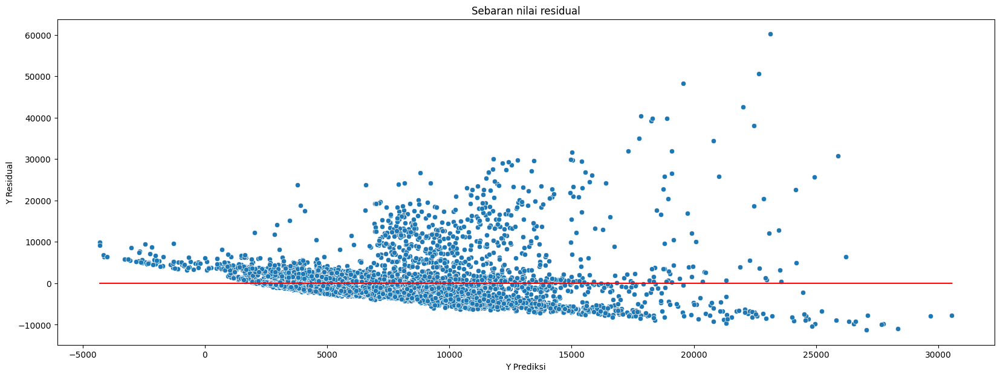

In [ ]:
# memeriksa relasi nilai prediksi Y dengan residual
plt.figure(figsize=(20,7))

sns.scatterplot(x = result.fittedvalues, y=result.resid)
sns.lineplot(x = result.fittedvalues, y=0, color="red")

plt.title('Sebaran nilai residual')
plt.xlabel('Y Prediksi')
plt.ylabel('Y Residual')

plt.show()

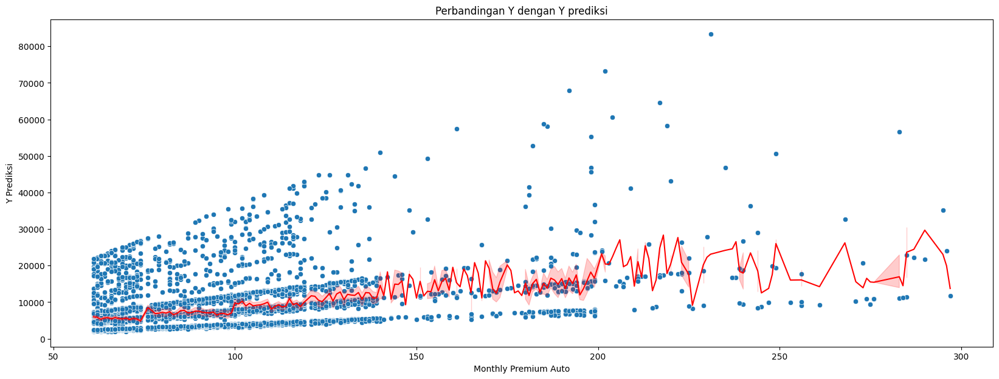

In [ ]:
# memeriksa relasi nilai prediksi Y dengan residual dan melihat model regresi polinom yang sudah kita susun
plt.figure(figsize=(20,7))
sns.scatterplot(data = clv, x = clv['Monthly Premium Auto'], y= y)
sns.lineplot(x = clv['Monthly Premium Auto'] , y=result.fittedvalues, color="red")

plt.title('Perbandingan Y dengan Y prediksi')
plt.xlabel('Monthly Premium Auto')
plt.ylabel('Y Prediksi')

plt.show()

#### **5. Eksplorasi Data dengan metode Agglomerative Clustering**

Kita akan melakukan eksplorasi data terakhir menggunakan agglomerative clustering untuk melihat kemungkinan pola lain yang belum kita temukan. Metode ini akan dilakukan dengan ward, average, dan complete clustering.

In [ ]:
## import library agglomerative clustering
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, ward, average, complete

In [ ]:
## definisi variabel yang akan dipakai untuk agglomerative clustering
onehot_var = ['Vehicle Class','Coverage','Renew Offer Type','EmploymentStatus','Marital Status']
income_var = ['Income']
ordinal_var = ['Education']
polinom_var = ['EmploymentStatus_Employed','EmploymentStatus_Medical Leave','EmploymentStatus_Retired']

In [ ]:
##pendefinisian variabel ordinal

ordinal_mapping = [
    {
        'col':'Education',
        'mapping':{None:0,'High School or Below':1,'College':2,'Bachelor':3,'Master':4,'Doctor':5}
    }
]

ordinal = ce.OrdinalEncoder(cols = ordinal_var, mapping = ordinal_mapping)

In [ ]:
## penyusunan transformer preprocessing
transformer_1 = ColumnTransformer([
    ('onehot',onehot,onehot_var),
    ('robust',robust, income_var),
    ('ordinal',ordinal,ordinal_var),
],remainder = 'passthrough')
transformer_1

## buat dataframe untuk agglomerative clustering
clv_2 = pd.DataFrame(transformer_1.fit_transform(clv), columns = (transformer_1.get_feature_names_out()))
clv_2

,onehot__Vehicle Class_Luxury Car,onehot__Vehicle Class_Luxury SUV,onehot__Vehicle Class_SUV,onehot__Vehicle Class_Sports Car,onehot__Vehicle Class_Two-Door Car,onehot__Coverage_Extended,onehot__Coverage_Premium,onehot__Renew Offer Type_Offer2,onehot__Renew Offer Type_Offer3,onehot__Renew Offer Type_Offer4,onehot__EmploymentStatus_Employed,onehot__EmploymentStatus_Medical Leave,onehot__EmploymentStatus_Retired,onehot__EmploymentStatus_Unemployed,onehot__Marital Status_Married,onehot__Marital Status_Single,robust__Income,ordinal__Education,remainder__Number of Policies,remainder__Monthly Premium Auto,remainder__Total Claim Amount,remainder__Customer Lifetime Value
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.360111,1.0,2.0,90.0,571.479602,10083.486880
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.167136,2.0,6.0,62.0,114.514440,4943.386117
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,-0.205046,4.0,2.0,62.0,257.248789,11981.984810
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.262695,1.0,1.0,116.0,556.800000,4550.856045
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,-0.244813,1.0,1.0,62.0,355.820799,2372.155492
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5664,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,-0.549468,1.0,1.0,74.0,532.800000,2442.216651
5665,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.104764,3.0,2.0,109.0,523.200000,12904.943360
5666,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.805840,3.0,1.0,62.0,44.780402,2447.053134
5667,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.185979,4.0,7.0,239.0,1294.700423,19160.989940


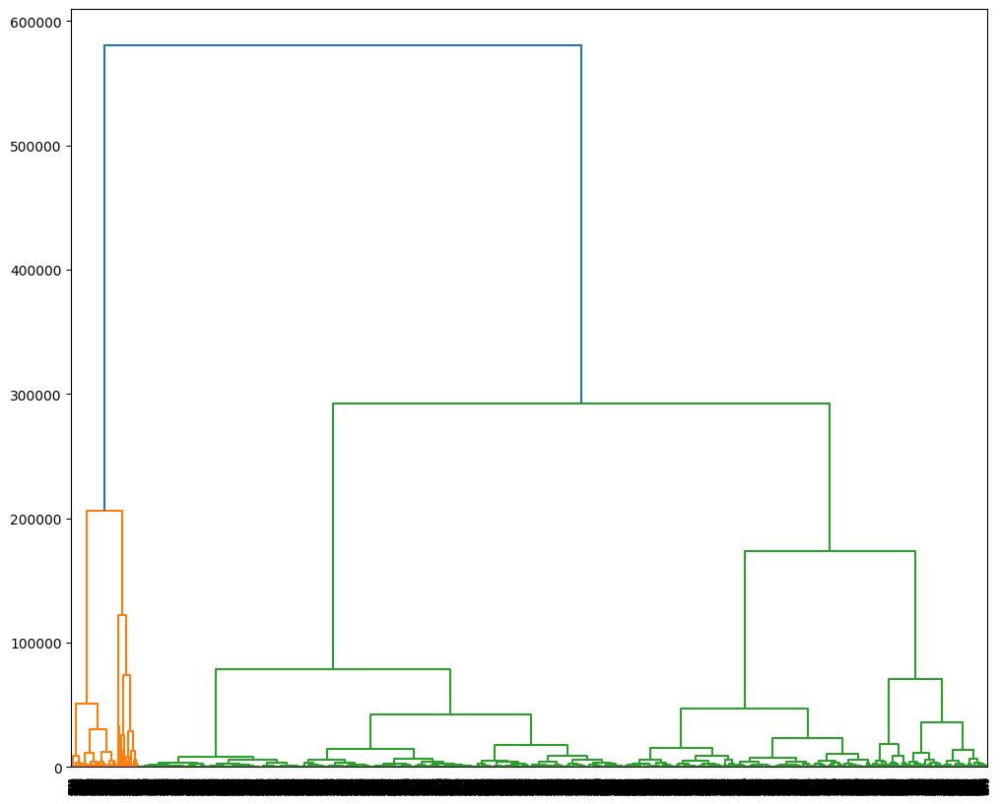

In [ ]:
## Clustering menggunakan metode ward
plt.figure(figsize = (12,10))

linkage_array = ward(clv_2)
dendrogram(linkage_array)

plt.show()

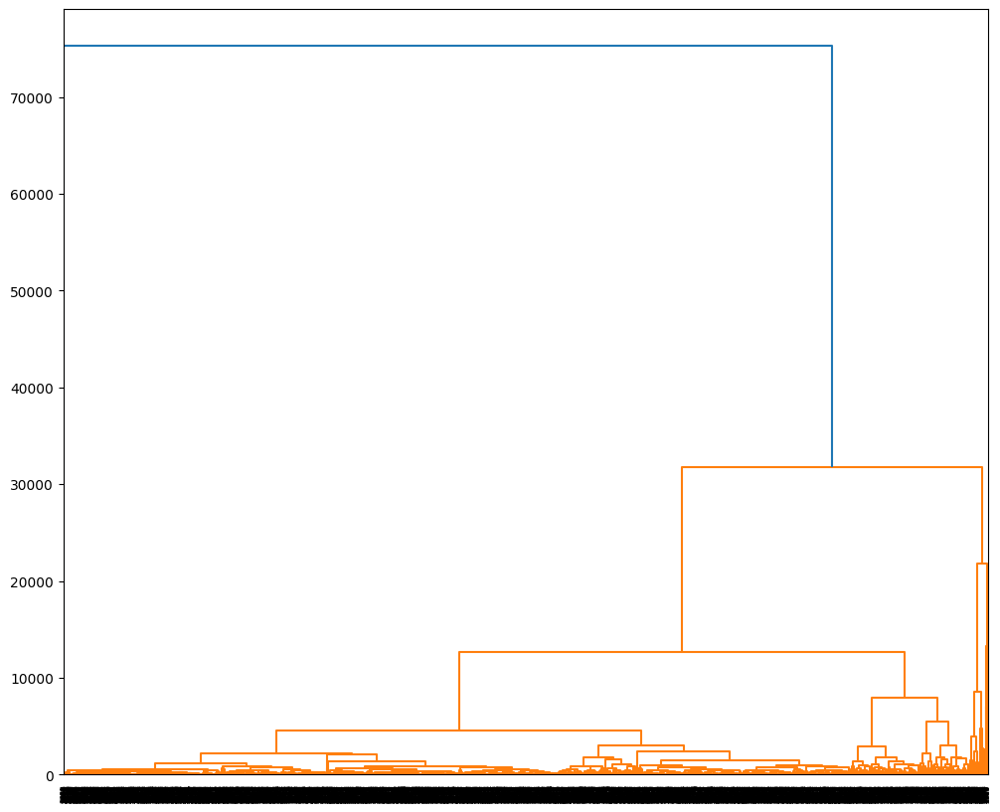

In [ ]:
## clustering menggunakan metode average
plt.figure(figsize = (12,10))

linkage_array = average(clv_2)
dendrogram(linkage_array)

plt.show()

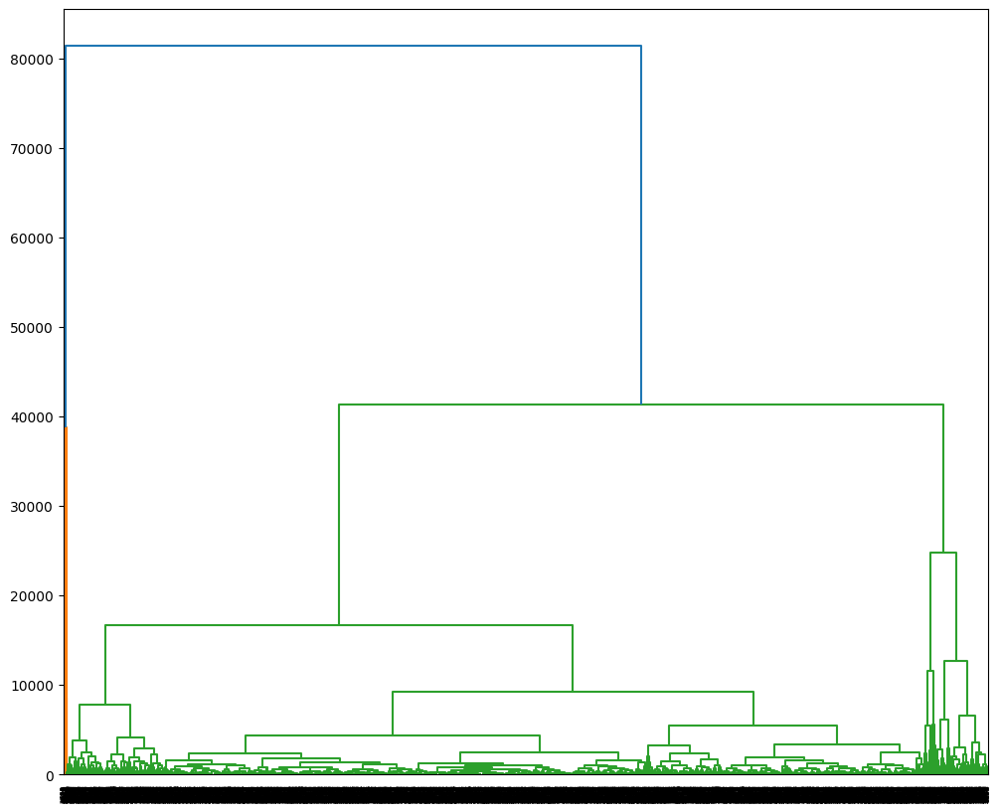

In [ ]:
## clusterng menggunakan metode complete
plt.figure(figsize = (12,10))

linkage_array = complete(clv_2)
dendrogram(linkage_array)

plt.show()

Dari ketiga metode clustering tersebut kita dapat memperkirakan bahwa jarak dendogram dari 2 cluster ke 3 cluster memberi pengurangan jarak clustering tertinggi sehingga kita menyimpulkan bahwa clustering terbaik yaitu 3 cluster.

In [ ]:
## tambah kolom hasil ward pada clv_2
clus_ward = AgglomerativeClustering(linkage = 'ward', n_clusters = 3)
clv_2['hasil ward']=clus_ward.fit_predict(clv_2)

In [ ]:
## tambah kolom hasil average pada clv_2
clus_avg = AgglomerativeClustering(linkage = 'average', n_clusters = 3)
clv_2['hasil avg']=clus_ward.fit_predict(clv_2)

In [ ]:
## tambah kolom hasil complete pada clv_2
clus_complete = AgglomerativeClustering(linkage = 'complete', n_clusters = 3)
clv_2['hasil complete']=clus_ward.fit_predict(clv_2)

In [ ]:
## mengubah hasil ward menjadi kategori A,B,C
clv_2.loc[clv_2['hasil ward'] == 0,'hasil ward'] = 'A'
clv_2.loc[clv_2['hasil ward'] == 1,'hasil ward'] = 'B'
clv_2.loc[clv_2['hasil ward'] == 2,'hasil ward'] = 'C'

In [ ]:
## mengubah hasil avg menjadi kategori A,B,C
clv_2.loc[clv_2['hasil avg'] == 0,'hasil avg'] = 'A'
clv_2.loc[clv_2['hasil avg'] == 1,'hasil avg'] = 'B'
clv_2.loc[clv_2['hasil avg'] == 2,'hasil avg'] = 'C'

In [ ]:
## mengubah hasil complete menjadi kategori A,B,C
clv_2.loc[clv_2['hasil complete'] == 0,'hasil complete'] = 'A'
clv_2.loc[clv_2['hasil complete'] == 1,'hasil complete'] = 'B'
clv_2.loc[clv_2['hasil complete'] == 2,'hasil complete'] = 'C'
clv_2

,onehot__Vehicle Class_Luxury Car,onehot__Vehicle Class_Luxury SUV,onehot__Vehicle Class_SUV,onehot__Vehicle Class_Sports Car,onehot__Vehicle Class_Two-Door Car,onehot__Coverage_Extended,onehot__Coverage_Premium,onehot__Renew Offer Type_Offer2,onehot__Renew Offer Type_Offer3,onehot__Renew Offer Type_Offer4,onehot__EmploymentStatus_Employed,onehot__EmploymentStatus_Medical Leave,onehot__EmploymentStatus_Retired,onehot__EmploymentStatus_Unemployed,onehot__Marital Status_Married,onehot__Marital Status_Single,robust__Income,ordinal__Education,remainder__Number of Policies,remainder__Monthly Premium Auto,remainder__Total Claim Amount,remainder__Customer Lifetime Value,hasil ward,hasil avg,hasil complete
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.360111,1.0,2.0,90.0,571.479602,10083.486880,B,B,B
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.167136,2.0,6.0,62.0,114.514440,4943.386117,C,C,C
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,-0.205046,4.0,2.0,62.0,257.248789,11981.984810,B,B,B
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.262695,1.0,1.0,116.0,556.800000,4550.856045,C,C,C
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,-0.244813,1.0,1.0,62.0,355.820799,2372.155492,C,C,C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5664,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,-0.549468,1.0,1.0,74.0,532.800000,2442.216651,C,C,C
5665,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.104764,3.0,2.0,109.0,523.200000,12904.943360,B,B,B
5666,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.805840,3.0,1.0,62.0,44.780402,2447.053134,C,C,C
5667,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.185979,4.0,7.0,239.0,1294.700423,19160.989940,A,A,A


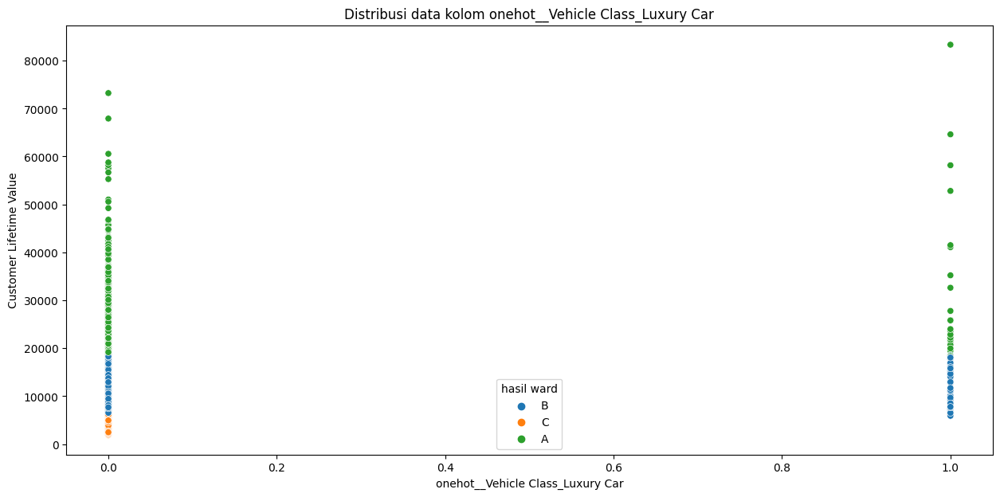

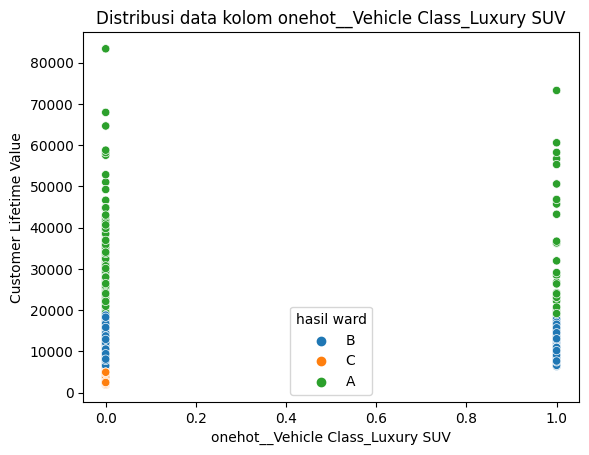

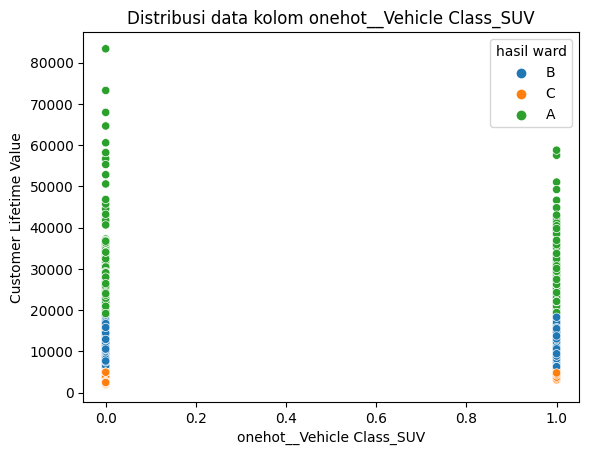

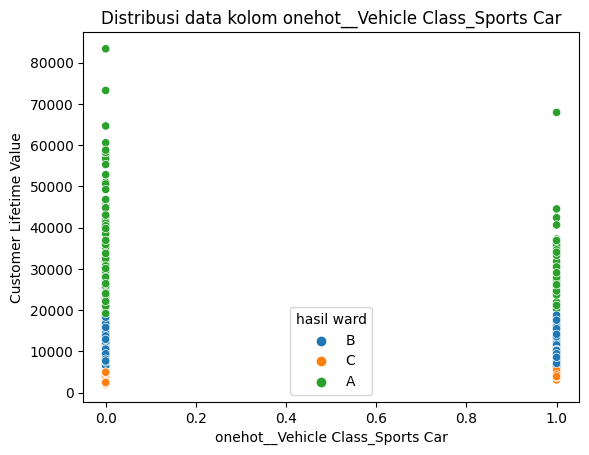

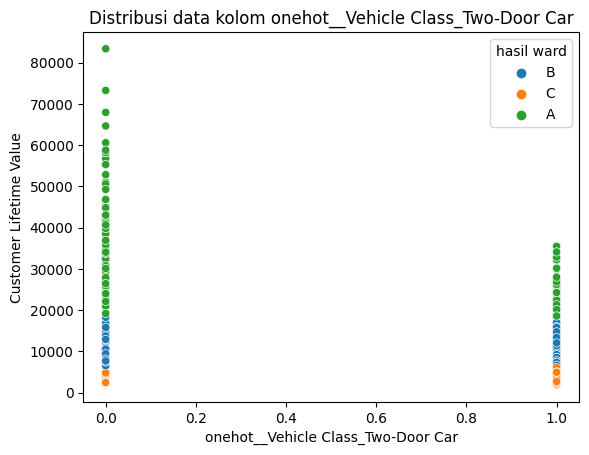

...

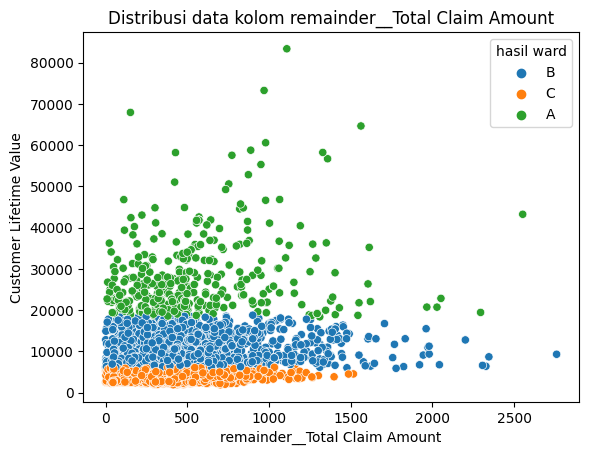

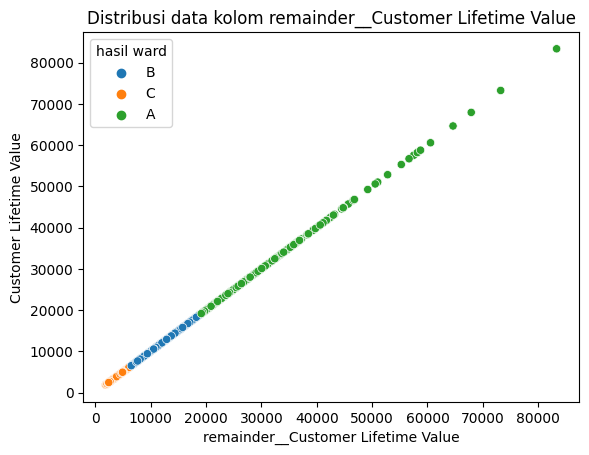

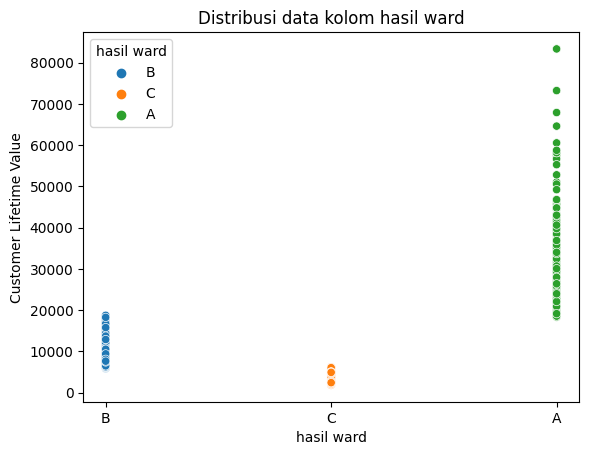

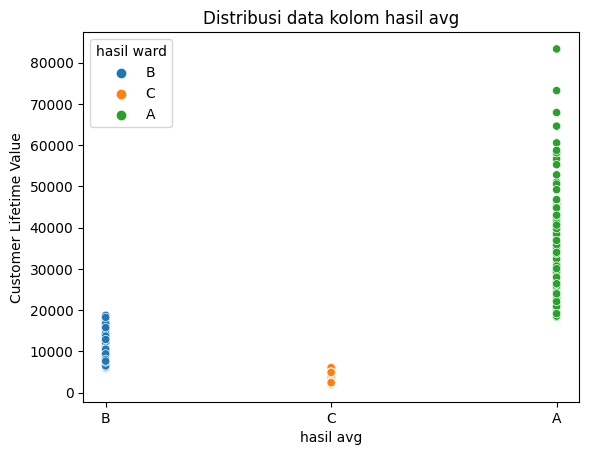

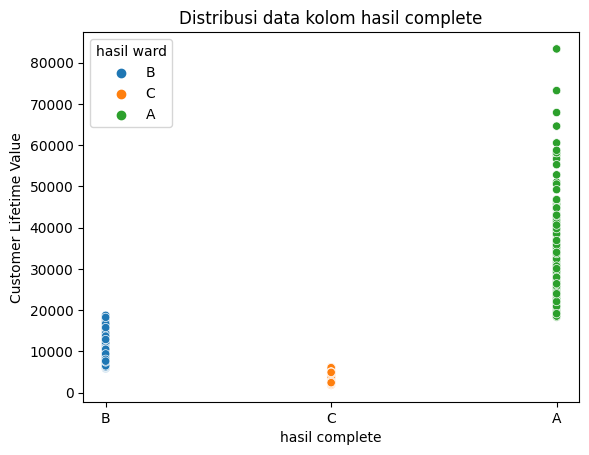

In [ ]:
#sebaran data kolom numerik dalam scatterplot
plt.figure(figsize = (15,7))

for col in clv_2.columns:
  sns.scatterplot(data=clv_2, y = clv_2['remainder__Customer Lifetime Value'], x = clv_2[col], hue = clv_2['hasil ward'])
  plt.title(f'Distribusi data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Customer Lifetime Value')
  plt.show()

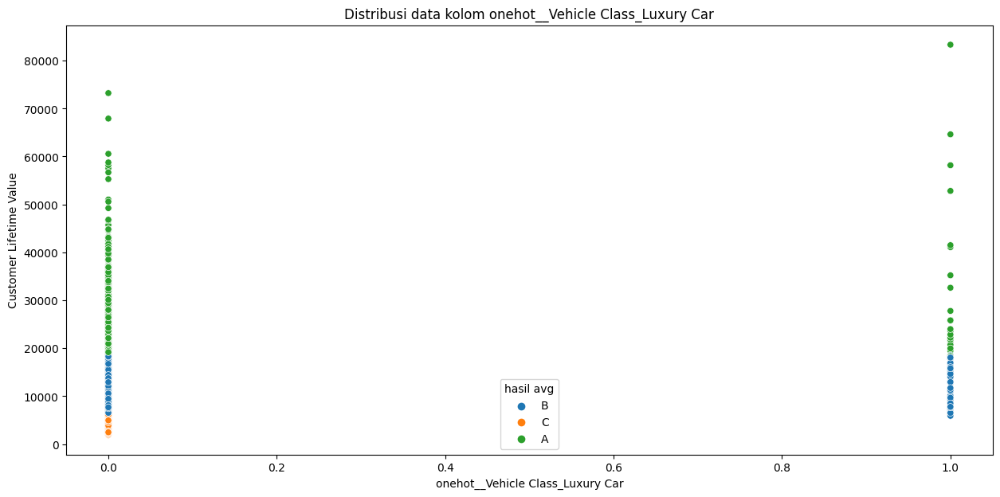

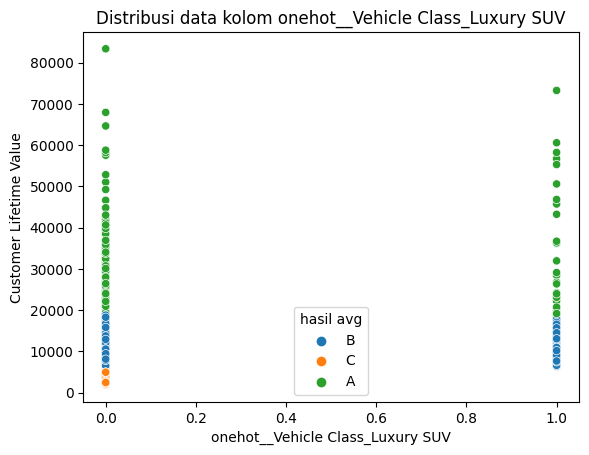

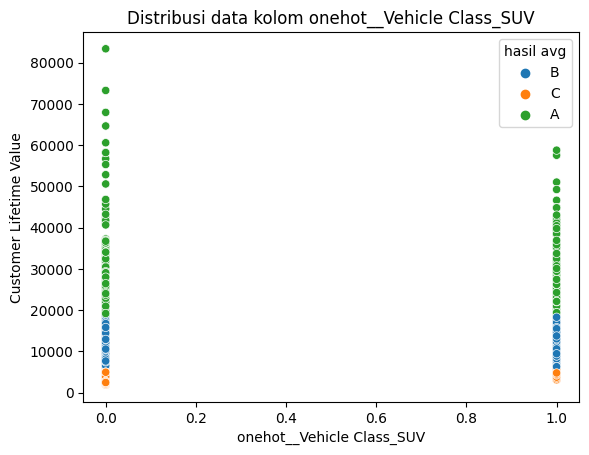

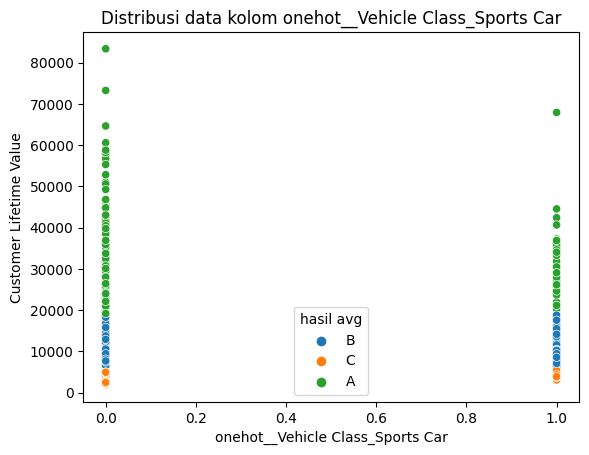

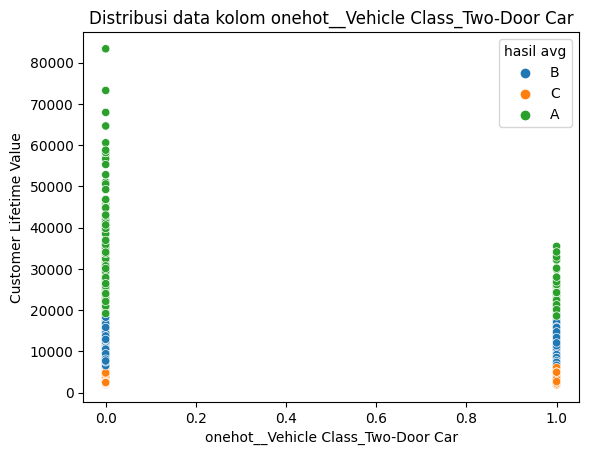

...

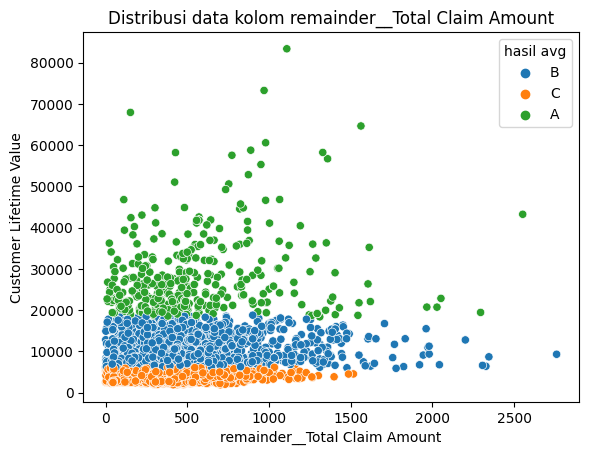

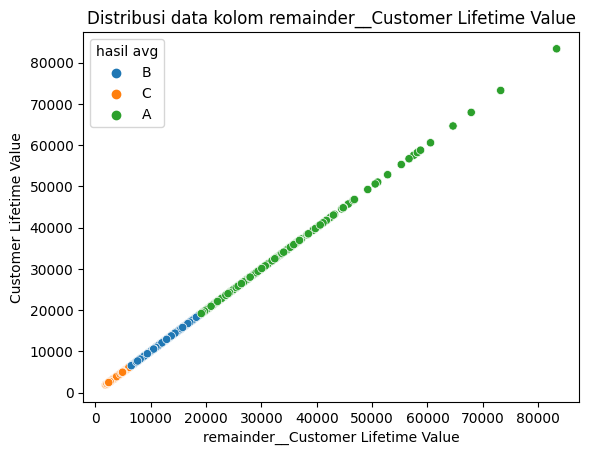

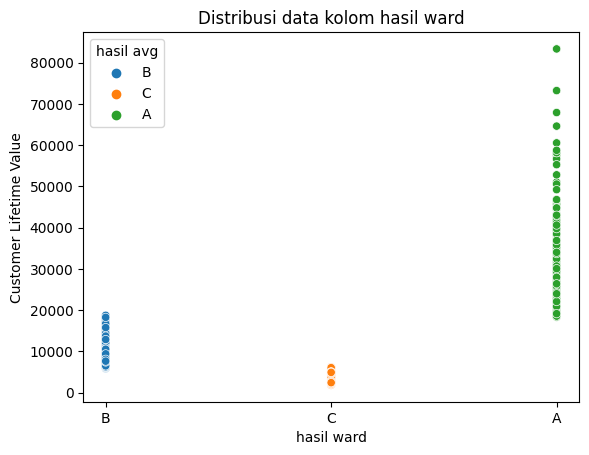

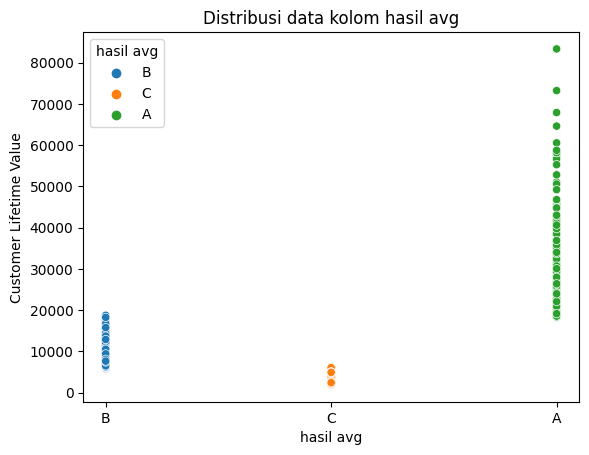

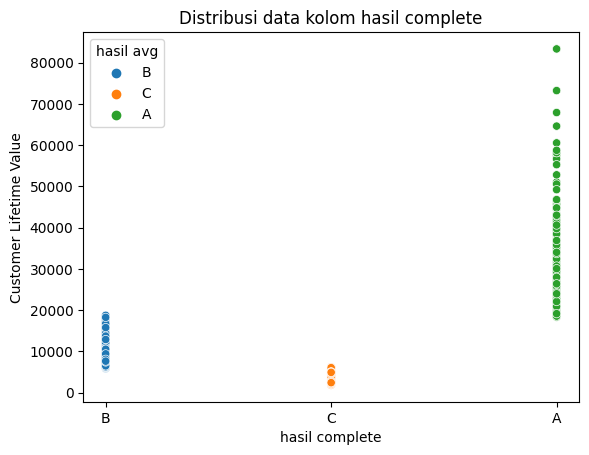

In [ ]:
#sebaran data kolom numerik dalam scatterplot
plt.figure(figsize = (15,7))

for col in clv_2.columns:
  sns.scatterplot(data=clv_2, y = clv_2['remainder__Customer Lifetime Value'], x = clv_2[col], hue = clv_2['hasil avg'])
  plt.title(f'Distribusi data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Customer Lifetime Value')
  plt.show()

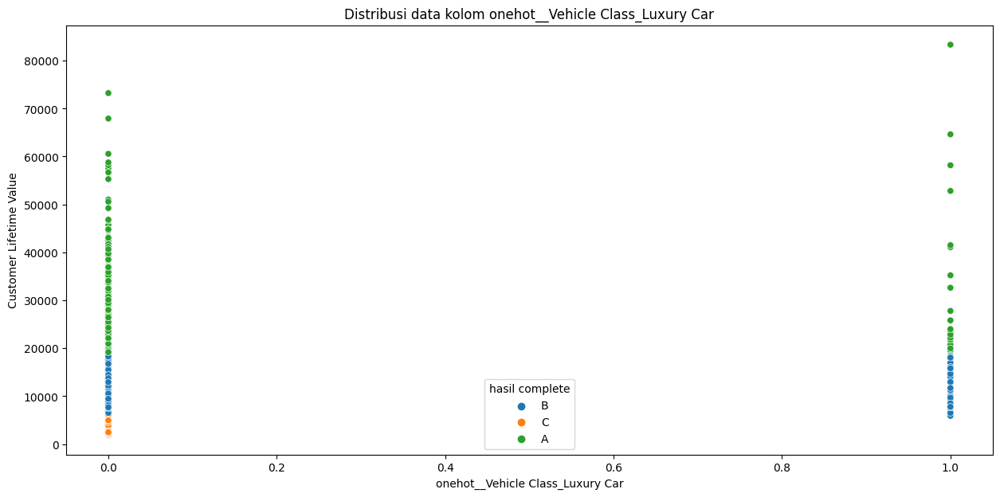

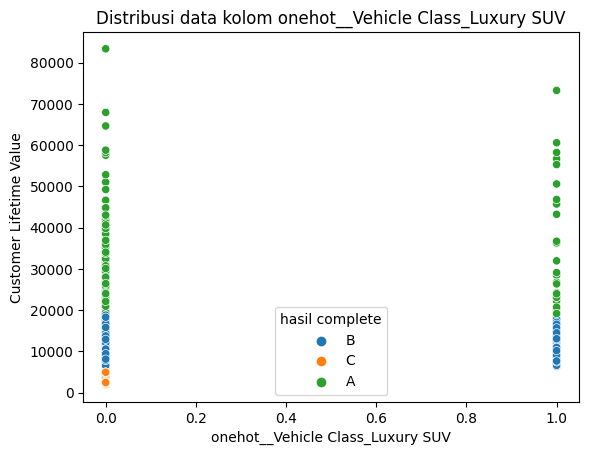

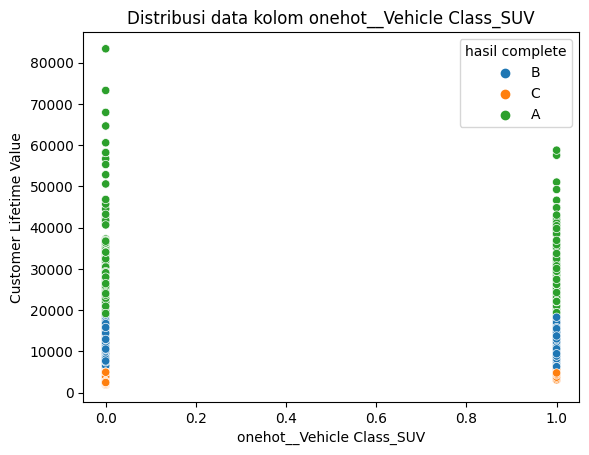

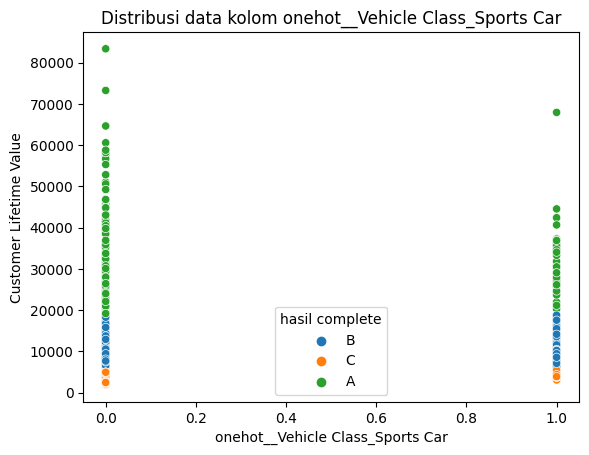

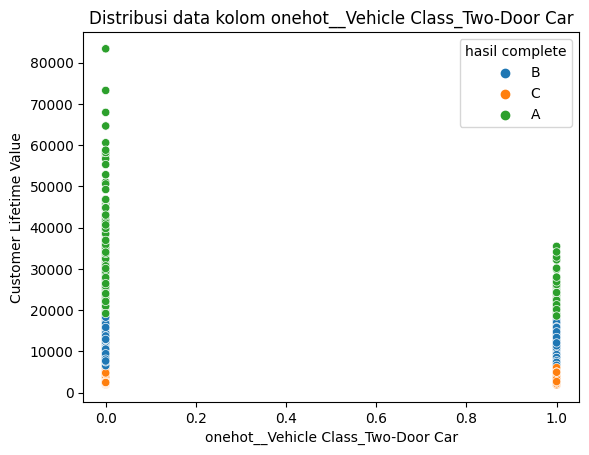

...

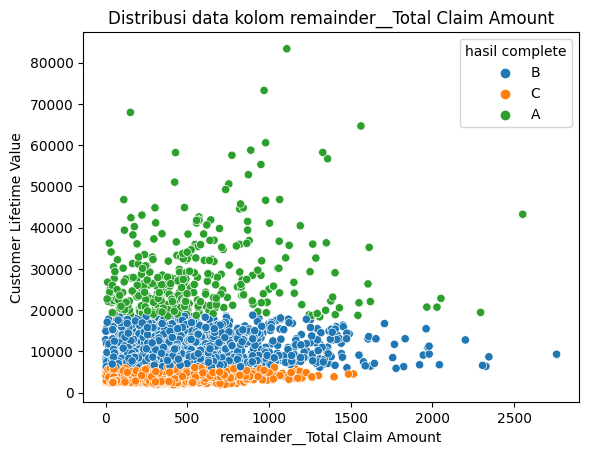

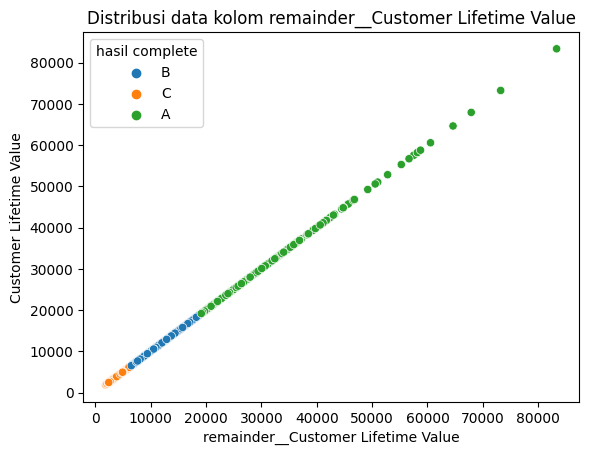

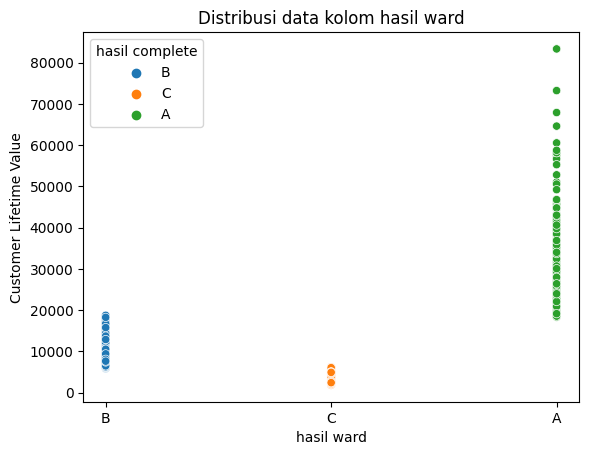

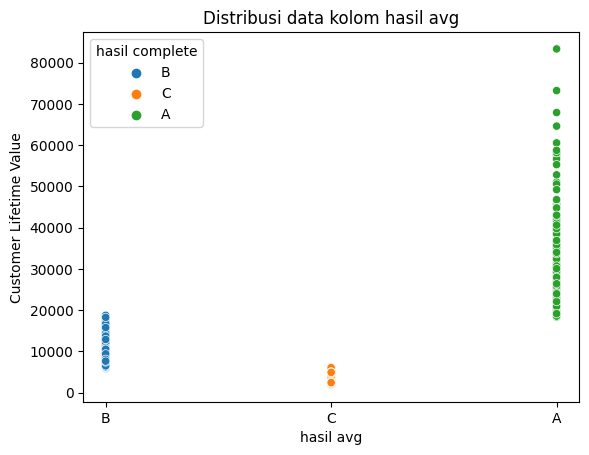

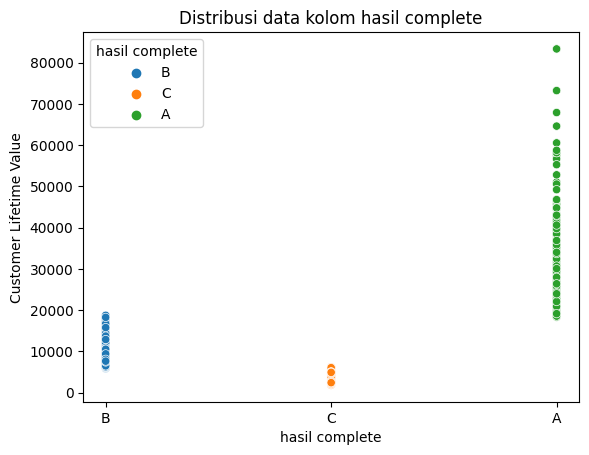

In [ ]:
#sebaran data kolom numerik dalam scatterplot
plt.figure(figsize = (15,7))

for col in clv_2.columns:
  sns.scatterplot(data=clv_2, y = clv_2['remainder__Customer Lifetime Value'], x = clv_2[col], hue = clv_2['hasil complete'])
  plt.title(f'Distribusi data kolom {col}')
  plt.xlabel(f'{col}')
  plt.ylabel('Customer Lifetime Value')
  plt.show()

In [ ]:
## melihat nilai maximum dan minimum masing-masing kategori hasil ward
display(clv_2.loc[clv_2['hasil ward']=='A','remainder__Customer Lifetime Value'].describe())

count      414.000000
mean     27455.358540
std       9236.493618
min      18361.555250
25%      21358.689205
50%      24259.865800
75%      30428.506825
max      83325.381190
Name: remainder__Customer Lifetime Value, dtype: float64

In [ ]:
## melihat nilai maximum dan minimum masing-masing kategori hasil ward
display(clv_2.loc[clv_2['hasil ward']=='B','remainder__Customer Lifetime Value'].describe())

count     2249.000000
mean      9796.162832
std       3003.616435
min       5886.221122
25%       7590.050089
50%       8676.698631
75%      11323.355550
max      18767.551610
Name: remainder__Customer Lifetime Value, dtype: float64

In [ ]:
## melihat nilai maximum dan minimum masing-masing kategori hasil ward
display(clv_2.loc[clv_2['hasil ward']=='C','remainder__Customer Lifetime Value'].describe())

count    3006.000000
mean     4033.024091
std      1208.349901
min      1898.007675
25%      2777.725028
50%      4122.767294
75%      5113.893003
max      6191.402312
Name: remainder__Customer Lifetime Value, dtype: float64

Kita akan mengacu pada hasil Clustering dengan metode Ward. 

Berdasarkan hasil dan penggambaran Clustering di atas, pada dasarnya Customer Lifetime Value terbagi menjadi 3 kategori, yaitu :
1. **Kategori A** : yaitu Customer dengan Customer Lifetime Value antara **18.361 hingga 83.325**.
2. **Kategori B** : yaitu Customer dengan Customer Lifetime Value antara **5.886 hingga 18.767**.
3. **Kategori C** : yaitu Customer dengan Customer Lifetime Value antara **1.898 hingga 6.191**.

Kita melihat adanya interval yang berbeda jauh antar kategori, dan ini kemungkinan besar disebabkan oleh outlier data, sehingga pola data menunjukkan discrepancy besar.

Tapi seperti juga yang ditunjukkan oleh boxplot, boxplot juga menunjukkan pengkategorian data outliers yang serupa, ketika Outer Fence box plot pada kolom Customer Lifetime Value yaitu 16.647 (dekat dengan nilai maximum cluster 2). Sehingga kita akan coba melakukan penghapusan data outliers dengan mengambil batas nilai di sekitar 30.000. Kita tidak mengambil tepat pada batas atas, karena kita lihat persebaran data Customer Lifetime Value pada batas tersebut masih tergolong stabil dan merata.

#### **6. Kesimpulan Insight Data dan Solusi Pengolahan**


Berdasarkan eksplorasi yang sudah kita lakukan sebelumnya. Kita menemukan beberapa kesamaan dan poin kunci.
1. Dataset tersebut harus kita lakukan proses feature engineering karena hubungannya tidak dapat dideteksi secara linear.
2. Kita perlu membuang beberapa data outliers, karena data tersebut mengganggu pola pembelajaran Machine Learning. Outliers tersebut berjumlah sedikit, sehingga peluang terjadinya akan sedikit di dunia nyata. Sementara Machine Learning perlu mengetahui pola umum yang terjadi.\
3. Terdapat variabel-variabel yang setelah kita uji dengan berbagai eksplorasi data, menempati urutan pengaruh tertinggi, yaitu meliputi :
  1. `Monthly Premium Auto` 
  2. `Number of Policies`  
  3. `Vehicle Class Luxury Car`,
  4. `Vehicle Class Sports Car`,
  5. `Vehicle Class Two-Door Car`,
  6. `Vehicle Class Luxury SUV`,
  7. `EmployeeStatus Employed`,
  8. `Coverage Premium` dan
  9. `Income`
4. Variabel ini yang akan kita jadikan kunci untuk melakukan modeling selanjutnya.

### **Data Preprocessing dan Transformasi**

1.  `Vehicle Class`, berisi informasi mengenai tipe/kelas kendaraan yang diasuransikan (skala ordinal).
2.   `Coverage`, berisi informasi jenis polis asuransi yang meng-cover kendaraan tersebut (skala ordinal).
3. `Renew Offer Type`, informasi tipe perpanjangan polis asuransi (skala nominal).
4. `EmploymentStatus`, informasi status pekerjaan pemegang polis asuransi (skala nominal).
5. `Marital Status`, berisi status pernikahan pemegang polis (skala nominal).
6. `Education`, berisi informasi pendidikan terakhir pemegang polis (skala ordinal).
7. `Number of Policies`, informasi jumlah polis yang dimiliki oleh pemegang polis (skala numerik rasio).
8. `Monthly Premium Auto`, informasi fee bulanan yang dibayarkan pemegang polis (skala numerik rasio).
9. `Total Claim Amount`, informasi total nilai asuransi yang pernah diklaim pemegang polis (skala numerik rasio).
10. `Income`, informasi data income pemegang polis (skala numerik rasio).
11. `Customer Lifetime Value`, informasi kontribusi benefit pemegang polis terhadap perusahaan (skala numerik rasio).


In [27]:
## import library
from sklearn.preprocessing import PolynomialFeatures, OneHotEncoder
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.model_selection import GridSearchCV
from category_encoders import OrdinalEncoder
from sklearn.model_selection import KFold
from sklearn.ensemble import VotingRegressor

#### **1. Outliers Handling**

In [29]:
## drop baris yang mengandung outliers
clv_cleaned = clv.drop(clv.loc[clv['Customer Lifetime Value'] > 28000].index, axis = 0)
clv_cleaned

,Vehicle Class,Coverage,Renew Offer Type,EmploymentStatus,Marital Status,Education,Number of Policies,Monthly Premium Auto,Total Claim Amount,Income,Customer Lifetime Value
0,Four-Door Car,Extended,Offer1,Retired,Divorced,High School or Below,2.0,90.0,571.479602,11828.0,10083.486880
1,Four-Door Car,Basic,Offer1,Employed,Married,College,6.0,62.0,114.514440,44762.0,4943.386117
2,Two-Door Car,Basic,Offer1,Retired,Married,Master,2.0,62.0,257.248789,21514.0,11981.984810
3,Four-Door Car,Premium,Offer3,Disabled,Married,High School or Below,1.0,116.0,556.800000,17913.0,4550.856045
4,Two-Door Car,Basic,Offer3,Medical Leave,Married,High School or Below,1.0,62.0,355.820799,19030.0,2372.155492
...,...,...,...,...,...,...,...,...,...,...,...
5664,Four-Door Car,Basic,Offer4,Unemployed,Single,High School or Below,1.0,74.0,532.800000,0.0,2442.216651
5665,Four-Door Car,Premium,Offer1,Employed,Divorced,Bachelor,2.0,109.0,523.200000,27778.0,12904.943360
5666,Four-Door Car,Basic,Offer1,Employed,Single,Bachelor,1.0,62.0,44.780402,84658.0,2447.053134
5667,Luxury SUV,Extended,Offer2,Employed,Divorced,Master,7.0,239.0,1294.700423,22705.0,19160.989940


#### **2. Feature Selection**

In [30]:
## drop kolom marital status
clv_cleaned.drop(columns = 'Marital Status', index = 1, inplace=True)

#### **3. Scalling and Encoding**

In [31]:
## Pendefinisian scaler dan encoders
robust = RobustScaler()

In [32]:
## Pendefinisian scaler dan encoders
onehot = OneHotEncoder(drop='first')
polinom = PolynomialFeatures(degree = 2, include_bias = False)
ordinal_var = ['Education']

ordinal_mapping = [
    {
        'col':'Education',
        'mapping':{None:0,'High School or Below':1,'College':2,'Bachelor':3,'Master':4,'Doctor':5}
    }
]

ordinal = ce.OrdinalEncoder(cols = ordinal_var, mapping = ordinal_mapping)

### **Modeling (Pemilihan Model Regresi)**

#### **1. Kandidat Model Regresi Linear Polynomial**:

##### **Data Test**

In [33]:
## pembagian antara data x dan y
x = clv_cleaned.drop(columns = ['Customer Lifetime Value'])
y = clv_cleaned[['Customer Lifetime Value']]

##### **Train Test Split**

In [34]:
## split test train
x_trainval, x_test, y_trainval, y_test = train_test_split(
    x,
    y,
    random_state = 2020,
    test_size = 0.2
)

##### **Model Pipeline Regresi Linear Reguler**

In [44]:
## import library
from sklearn.preprocessing import PolynomialFeatures, OneHotEncoder
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.model_selection import GridSearchCV
from category_encoders import OrdinalEncoder
from sklearn.model_selection import KFold
from sklearn.ensemble import VotingRegressor


## penyusunan model linear
linear_1 = LinearRegression()

## fungsi Polynomial Features
polynomial_transformer = PolynomialFeatures(degree = 2, include_bias = False)

## variabel onehot
onehot_var = ['Vehicle Class','Coverage','Renew Offer Type','EmploymentStatus']
income_var = ['Income']
ordinal_var = ['Education']
polynom_var = ['remainder__Number of Policies', 'remainder__Monthly Premium Auto']

feature_names = ['robust__Income', 'ordinal__Education',
       'onehot__Vehicle Class_Luxury Car',
       'onehot__Vehicle Class_Luxury SUV', 'onehot__Vehicle Class_SUV',
       'onehot__Vehicle Class_Sports Car',
       'onehot__Vehicle Class_Two-Door Car', 'onehot__Coverage_Extended',
       'onehot__Coverage_Premium', 'onehot__Renew Offer Type_Offer2',
       'onehot__Renew Offer Type_Offer3',
       'onehot__Renew Offer Type_Offer4',
       'onehot__EmploymentStatus_Employed',
       'onehot__EmploymentStatus_Medical Leave',
       'onehot__EmploymentStatus_Retired',
       'onehot__EmploymentStatus_Unemployed',
       'remainder__Number of Policies', 'remainder__Monthly Premium Auto',
       'remainder__Total Claim Amount']

## Fungsi mengubah numpy menjadi data frame
def df_transformer(X):
  df = pd.DataFrame(X,columns = feature_names)
  return df

to_df = FunctionTransformer(df_transformer)

## penyusunan model transformer_1
transformer_linear = ColumnTransformer([
    ('robust',robust, income_var),
    ('ordinal',ordinal,ordinal_var),
    ('onehot',onehot, onehot_var)
],remainder = 'passthrough')

## penyusunan model transformer_2
transformer_2 = to_df

## penyusunan model transformer polynomial
transformer_3 = ColumnTransformer([
    ('polynom',polynomial_transformer,polynom_var)
], remainder = 'passthrough')

## penyusunan model pipeline
pipeline_1 = Pipeline(steps =[
    ('transformer_1',transformer_linear),
    ('transformer_2',transformer_2),
    ('transformer_3',transformer_3),
    ('clf',linear_1)
])

pipeline_1

Pipeline(steps=[('transformer_1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('robust', RobustScaler(),
                                                  ['Income']),
                                                 ('ordinal',
                                                  OrdinalEncoder(cols=['Education'],
                                                                 mapping=[{'col': 'Education',
                                                                           'data_type': dtype('O'),
                                                                           'mapping': None                    0
High School or Below    1
College                 2
Bachelor                3
Master                  4
Doctor                  5
dtype: int64}]),
                                                  ['Education']),
                                                 ('onehot',
                                                  OneHotEncoder(drop='firs...
                                                  ['Vehicle Class', 'Coverage',
                                                   'Renew Offer Type',
                                                   'EmploymentStatus'])])),
                ('transformer_2',
                 FunctionTransformer(func=<function df_transformer at 0x7f7c37ef7f40>)),
                ('transformer_3',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('polynom',
                                                  PolynomialFeatures(include_bias=False),
                                                  ['remainder__Number of '
                                                   'Policies',
                                                   'remainder__Monthly Premium '
                                                   'Auto'])])),
                ('clf', LinearRegression())])

##### **Hyperparameter Tuning**

In [45]:
## variabel parameter
param_grid = {
    'clf__fit_intercept':[False,True],
    'transformer_3__polynom__degree':[2,3,4,5,6,7,8,9,10]
}

##### **Cross Validasi**

In [46]:
## pembagian data menjadi fold
kf = KFold(n_splits = 5, random_state = 2022, shuffle = True)

In [47]:
## train model dengan trainval
grid_search_linear = GridSearchCV(pipeline_1, param_grid=param_grid, scoring='r2',cv = kf, n_jobs = -1)
grid_search_linear.fit(x_trainval,y_trainval)

best_params = grid_search_linear.best_params_
best_score = grid_search_linear.best_score_
cv_results = grid_search_linear.cv_results_

print("Best Parameters:", best_params)
print("Best Score (R2):", best_score)
print("CV Results:")
pd.DataFrame(data = cv_results)

Best Parameters: {'clf__fit_intercept': True, 'transformer_3__polynom__degree': 5}
Best Score (R2): 0.7039922391044773
CV Results:


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_clf__fit_intercept,param_transformer_3__polynom__degree,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.103790,0.026584,0.043008,0.015204,False,2,"{'clf__fit_intercept': False, 'transformer_3__polynom__degree': 2}",0.185148,0.293009,0.277548,0.230086,0.236395,0.244437,0.038056,8
1,0.109907,0.026659,0.045389,0.019514,False,3,"{'clf__fit_intercept': False, 'transformer_3__polynom__degree': 3}",0.364452,0.448588,0.448978,0.407985,0.406850,0.415371,0.031473,6
2,0.103465,0.030038,0.053423,0.025060,False,4,"{'clf__fit_intercept': False, 'transformer_3__polynom__degree': 4}",0.549015,0.599489,0.606367,0.587505,0.582761,0.585027,0.019863,4
3,0.117649,0.017994,0.053323,0.015906,False,5,"{'clf__fit_intercept': False, 'transformer_3__polynom__degree': 5}",0.666513,0.699089,0.712794,0.699723,0.696028,0.694829,0.015284,2
4,0.139175,0.025109,0.039268,0.015012,False,6,"{'clf__fit_intercept': False, 'transformer_3__polynom__degree': 6}",-4.109278,-18.505170,-9.870711,-4.042106,-6.956154,-8.696684,5.353944,13
5,0.124721,0.033064,0.056525,0.017509,False,7,"{'clf__fit_intercept': False, 'transformer_3__polynom__degree': 7}",-0.633087,-0.404658,-3.772462,0.386246,-2.954743,-1.475741,1.599165,9
6,0.221859,0.043952,0.106230,0.024282,False,8,"{'clf__fit_intercept': False, 'transformer_3__polynom__degree': 8}",-7.545194,-39.537394,-7.373471,-9.209846,-0.768032,-12.886788,13.635016,14
7,0.286066,0.029055,0.116225,0.029846,False,9,"{'clf__fit_intercept': False, 'transformer_3__polynom__degree': 9}",-1.894928,-315.646342,-23.678773,-4.453175,-26.135005,-74.361645,121.038413,17
8,0.266062,0.023148,0.092873,0.030276,False,10,"{'clf__fit_intercept': False, 'transformer_3__polynom__degree': 10}",-3.603390,-446.635216,-57.295746,-5.331445,-42.928743,-111.158908,169.037623,18
9,0.202465,0.044444,0.079269,0.017082,True,2,"{'clf__fit_intercept': True, 'transformer_3__polynom__degree': 2}",0.184583,0.292696,0.277795,0.230272,0.237167,0.244503,0.038151,7


In [48]:
## model terbaik
linear_model = grid_search_linear.best_estimator_
y_pred = linear_model.predict(x_test)

##### **Loss Function : MSE, MAPE, RMSE**

Tes menggunakan parameter error sebagai berikut:
1. Jika nilai MAPE < 10% : Model sangat baik
2. Jika nilai MAPE diantara 10% - 20% : Model tergolong baik,
3. Jika nilai MAPE lebih besar dari 20% : Model perlu diimprove.

In [49]:
# Menghitung MSE
mse = mean_squared_error(y_test, y_pred)
print('MSE: ', mse)

# Menghitung MAE
mae = mean_absolute_error(y_test, y_pred)
print('MAE: ', mae)

# Menghitung MAPE
def mape(y_test, y_pred):
    return np.mean(np.abs((y_test - y_pred) / y_test)) * 100

mape = mape(y_test, y_pred)
print('MAPE: ', mape)

# Menghitung RMSE
rmse = mean_squared_error(y_test, y_pred, squared=False)
print('RMSE: ', rmse)

# Menghitung RMSLE
def rmsle(y_test, y_pred):
    return np.sqrt(np.mean(np.power(np.log1p(y_pred) - np.log1p(y_test), 2)))

rmsle = rmsle(y_test, y_pred)
print('RMSLE: ', rmsle)

MSE:  7373968.33422474
MAE:  1623.5315124911351
MAPE:  Customer Lifetime Value    18.344612
dtype: float64
RMSE:  2715.505171091512
RMSLE:  Customer Lifetime Value    0.242157
dtype: float64


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


##### **Linear Regression Prediction Plot**

In [51]:
# memeriksa grafik y prediksi dengan y test
plt.figure(figsize=(20,7))

sns.scatterplot(x = x_test['Monthly Premium Auto'], y = y_test['Customer Lifetime Value'])
sns.lineplot(x = x_test['Monthly Premium Auto'], y = y_pred.reshape(y_pred.shape[0],), color="red")

plt.title('Perbandingan Y dengan Y prediksi')
plt.xlabel('Monthly Premium Auto')
plt.ylabel('Y')

plt.show()

##### **Linear Regression Coefficient**

In [87]:
# periksa nilai coefficient setiap variabel
variabel = list(linear_model.named_steps['transformer_3'].get_feature_names_out())
koefisien = list(linear_model.named_steps['clf'].coef_.reshape(37,1))

koefisien = pd.DataFrame(data = koefisien, columns = ['koef'])
koefisien['variabel']=variabel
koefisien.sort_values(by='koef',ascending = False)

,koef,variabel
0,8.509931e+04,polynom__remainder__Number of Policies
5,1.052292e+04,polynom__remainder__Number of Policies^3
33,6.748863e+02,remainder__onehot__EmploymentStatus_Medical Leave
1,4.946314e+02,polynom__remainder__Monthly Premium Auto
34,3.726209e+02,remainder__onehot__EmploymentStatus_Retired
26,2.362938e+02,remainder__onehot__Vehicle Class_Two-Door Car
30,2.315161e+02,remainder__onehot__Renew Offer Type_Offer3
29,2.087067e+02,remainder__onehot__Renew Offer Type_Offer2
32,1.705434e+02,remainder__onehot__EmploymentStatus_Employed
25,1.455453e+02,remainder__onehot__Vehicle Class_Sports Car


#### **2. Kandidat Model Regresi (Lasso Polynomial)**

Polynomial Transformation on `remainder__Number of Policies` and `remainder__Monthly Premium Auto` columns.

##### **Data Test**

In [ ]:
## pembagian antara data x dan y
x = clv_cleaned.drop(columns = ['Customer Lifetime Value'])
y = clv_cleaned[['Customer Lifetime Value']]

In [ ]:
## variabel onehot
onehot_var = ['Vehicle Class','Coverage','Renew Offer Type','EmploymentStatus']
income_var = ['Income']
ordinal_var = ['Education']
polynom_var = ['remainder__Number of Policies', 'remainder__Monthly Premium Auto']

##### **Train Test Split**

In [ ]:
## split test train
x_trainval, x_test, y_trainval, y_test = train_test_split(
    x,
    y,
    random_state = 2020,
    test_size = 0.2
)

##### **Model Pipeline Regresi Lasso Polinomial**

In [ ]:
## penyusunan model linear
lasso = Lasso()

In [ ]:
## fungsi Polynomial Features
polynomial_transformer = PolynomialFeatures(degree = 2, include_bias = False)

In [ ]:
feature_names = ['robust__Income', 'ordinal__Education',
       'onehot__Vehicle Class_Luxury Car',
       'onehot__Vehicle Class_Luxury SUV', 'onehot__Vehicle Class_SUV',
       'onehot__Vehicle Class_Sports Car',
       'onehot__Vehicle Class_Two-Door Car', 'onehot__Coverage_Extended',
       'onehot__Coverage_Premium', 'onehot__Renew Offer Type_Offer2',
       'onehot__Renew Offer Type_Offer3',
       'onehot__Renew Offer Type_Offer4',
       'onehot__EmploymentStatus_Employed',
       'onehot__EmploymentStatus_Medical Leave',
       'onehot__EmploymentStatus_Retired',
       'onehot__EmploymentStatus_Unemployed',
       'remainder__Number of Policies', 'remainder__Monthly Premium Auto',
       'remainder__Total Claim Amount']

In [ ]:
## Fungsi mengubah numpy menjadi data frame
def df_transformer(X):
  df = pd.DataFrame(X,columns = feature_names)
  return df

to_df = FunctionTransformer(df_transformer)

In [ ]:
## penyusunan model transformer_1
transformer_1 = ColumnTransformer([
    ('robust',robust, income_var),
    ('ordinal',ordinal,ordinal_var),
    ('onehot',onehot, onehot_var)
],remainder = 'passthrough')

## penyusunan model transformer_2
transformer_2 = to_df

## penyusunan model transformer polynomial
transformer_3 = ColumnTransformer([
    ('polynom',polynomial_transformer,polynom_var)
], remainder = 'passthrough')

In [ ]:
## penyusunan model pipeline
pipeline_2 = Pipeline(steps = [
    ('transformer_1',transformer_1),
    ('transformer_2',transformer_2),
    ('transformer_3',transformer_3),
    ('clf',lasso)
])

pipeline_2

Pipeline(steps=[('transformer_1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('robust', RobustScaler(),
                                                  ['Income']),
                                                 ('ordinal',
                                                  OrdinalEncoder(cols=['Education'],
                                                                 mapping=[{'col': 'Education',
                                                                           'data_type': dtype('O'),
                                                                           'mapping': None                    0
High School or Below    1
College                 2
Bachelor                3
Master                  4
Doctor                  5
dtype: int64}]),
                                                  ['Education']),
                                                 ('onehot',
                                                  OneHotEncoder(drop='firs...
                                                  ['Vehicle Class', 'Coverage',
                                                   'Renew Offer Type',
                                                   'EmploymentStatus'])])),
                ('transformer_2',
                 FunctionTransformer(func=<function df_transformer at 0x7f06e4bd52d0>)),
                ('transformer_3',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('polynom',
                                                  PolynomialFeatures(include_bias=False),
                                                  ['remainder__Number of '
                                                   'Policies',
                                                   'remainder__Monthly Premium '
                                                   'Auto'])])),
                ('clf', Lasso())])

##### **Hyperparameter Tuning**

In [ ]:
## variabel parameter
param_grid = {
    'transformer_3__polynom__degree': [2,3,5,7],
    'clf__alpha':[0.01,0.1,0,1.0,5.0,10.0],
    'clf__selection':['cyclic','random']
}

##### **Cross Validasi**

In [ ]:
## pembagian data menjadi fold
kf = KFold(n_splits = 5, random_state = 2022, shuffle = True)

In [ ]:
## train model dengan trainval
grid_search_lasso = GridSearchCV(pipeline_2, param_grid=param_grid, scoring='r2',cv = kf, n_jobs = -1)
grid_search_lasso.fit(x_trainval,y_trainval)

best_params = grid_search_lasso.best_params_
best_score = grid_search_lasso.best_score_
cv_results = grid_search_lasso.cv_results_

print("Best Parameters:", best_params)
print("Best Score (R2):", best_score)
print("CV Results:")
pd.DataFrame(data = cv_results)

Best Parameters: {'clf__alpha': 5.0, 'clf__selection': 'random', 'transformer_3__polynom__degree': 7}
Best Score (R2): 0.456752814202724
CV Results:


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.042e+10, tolerance: 1.119e+07
  model = cd_fast.enet_coordinate_descent(


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_clf__alpha,param_clf__selection,param_transformer_3__polynom__degree,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.270277,0.016060,0.039805,0.003167,0.01,cyclic,2,"{'clf__alpha': 0.01, 'clf__selection': 'cyclic', 'transformer_3__polynom__degree': 2}",0.184587,0.292703,0.277797,0.230279,0.237168,0.244507,0.038152,45
1,0.286374,0.015666,0.044559,0.007314,0.01,cyclic,3,"{'clf__alpha': 0.01, 'clf__selection': 'cyclic', 'transformer_3__polynom__degree': 3}",0.339271,0.423168,0.417951,0.391194,0.389978,0.392313,0.029764,27
2,0.272896,0.038450,0.027499,0.006526,0.01,cyclic,5,"{'clf__alpha': 0.01, 'clf__selection': 'cyclic', 'transformer_3__polynom__degree': 5}",0.352782,0.459976,0.449713,0.401998,0.406380,0.414170,0.038312,14
3,0.346265,0.026572,0.026579,0.002264,0.01,cyclic,7,"{'clf__alpha': 0.01, 'clf__selection': 'cyclic', 'transformer_3__polynom__degree': 7}",0.401632,0.476289,0.488325,0.452838,0.403018,0.444420,0.036219,10
4,0.177248,0.015119,0.024836,0.002741,0.01,random,2,"{'clf__alpha': 0.01, 'clf__selection': 'random', 'transformer_3__polynom__degree': 2}",0.184588,0.292703,0.277797,0.230279,0.237166,0.244507,0.038152,46
5,0.174272,0.014497,0.023008,0.001465,0.01,random,3,"{'clf__alpha': 0.01, 'clf__selection': 'random', 'transformer_3__polynom__degree': 3}",0.331089,0.437043,0.417597,0.377368,0.385437,0.389707,0.036401,33
6,0.257885,0.011313,0.025616,0.002562,0.01,random,5,"{'clf__alpha': 0.01, 'clf__selection': 'random', 'transformer_3__polynom__degree': 5}",0.335925,0.440599,0.434070,0.382596,0.390826,0.396803,0.038081,21
7,0.335923,0.021908,0.024825,0.002146,0.01,random,7,"{'clf__alpha': 0.01, 'clf__selection': 'random', 'transformer_3__polynom__degree': 7}",0.393903,0.506355,0.488908,0.443304,0.446805,0.455855,0.039294,5
8,0.169335,0.004763,0.024780,0.002320,0.1,cyclic,2,"{'clf__alpha': 0.1, 'clf__selection': 'cyclic', 'transformer_3__polynom__degree': 2}",0.184618,0.292764,0.277812,0.230347,0.237181,0.244544,0.038154,44
9,0.193784,0.014076,0.024459,0.006266,0.1,cyclic,3,"{'clf__alpha': 0.1, 'clf__selection': 'cyclic', 'transformer_3__polynom__degree': 3}",0.339271,0.423160,0.417980,0.391247,0.389948,0.392321,0.029768,25


In [ ]:
## model terbaik
lasso = grid_search_lasso.best_estimator_
y_pred = lasso.predict(x_test)
y_pred = y_pred.reshape(y_pred.shape[0],1)

##### **Loss Function : MSE, MAPE, RMSE**

Tes menggunakan parameter error sebagai berikut:
1. Jika nilai MAPE < 10% : Model sangat baik
2. Jika nilai MAPE diantara 10% - 20% : Model tergolong baik,
3. Jika nilai MAPE lebih besar dari 20% : Model perlu diimprove.

In [ ]:
# Menghitung MSE
mse = mean_squared_error(y_test, y_pred)
print('MSE: ', mse)

# Menghitung MAE
mae = mean_absolute_error(y_test, y_pred)
print('MAE: ', mae)

# Menghitung MAPE
def mape(y_test, y_pred):
    return np.mean(np.abs((y_test - y_pred) / y_test)) * 100

mape = mape(y_test, y_pred)
print('MAPE: ', mape)

# Menghitung RMSE
rmse = mean_squared_error(y_test, y_pred, squared=False)
print('RMSE: ', rmse)

# Menghitung RMSLE
def rmsle(y_test, y_pred):
    return np.sqrt(np.mean(np.power(np.log1p(y_pred) - np.log1p(y_test), 2)))

rmsle = rmsle(y_test, y_pred)
print('RMSLE: ', rmsle)

MSE:  13808187.247535326
MAE:  2241.8677764513427
MAPE:  Customer Lifetime Value    31.54009
dtype: float64
RMSE:  3715.936927281641
RMSLE:  Customer Lifetime Value    0.369113
dtype: float64


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


##### **Lasso Regression Prediction Plot**

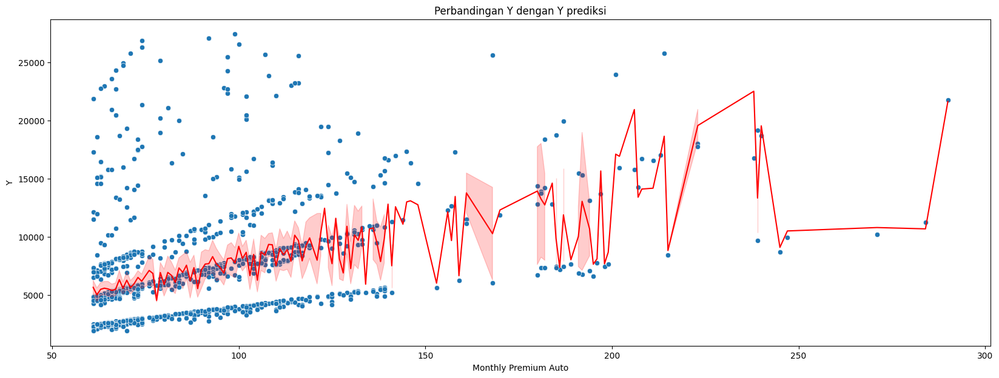

In [ ]:
# memeriksa grafik y prediksi dengan y test
plt.figure(figsize=(20,7))

sns.scatterplot(x = x_test['Monthly Premium Auto'], y = y_test['Customer Lifetime Value'])
sns.lineplot(x = x_test['Monthly Premium Auto'], y = y_pred.reshape(y_pred.shape[0],), color="red")

plt.title('Perbandingan Y dengan Y prediksi')
plt.xlabel('Monthly Premium Auto')
plt.ylabel('Y')

plt.show()

#### **3. Kandidat Model Ridge Polynomial**

##### **Data Test**

In [ ]:
## pembagian antara data x dan y
x = clv_cleaned.drop(columns = ['Customer Lifetime Value'])
y = clv_cleaned[['Customer Lifetime Value']]

In [ ]:
## variabel onehot
onehot_var = ['Vehicle Class','Coverage','Renew Offer Type','EmploymentStatus']
income_var = ['Income']
ordinal_var = ['Education']
polynom_var = ['remainder__Number of Policies', 'remainder__Monthly Premium Auto']

##### **Train Test Split**

In [ ]:
## split test train
x_trainval, x_test, y_trainval, y_test = train_test_split(
    x,
    y,
    random_state = 2020,
    test_size = 0.2
)

##### **Model Pipeline Regresi Linear Reguler**

In [ ]:
## penyusunan model linear
ridge = Ridge()

In [ ]:
## fungsi Polynomial Features
polynomial_transformer = PolynomialFeatures(degree = 2, include_bias = False)

In [ ]:
feature_names = ['robust__Income', 'ordinal__Education',
       'onehot__Vehicle Class_Luxury Car',
       'onehot__Vehicle Class_Luxury SUV', 'onehot__Vehicle Class_SUV',
       'onehot__Vehicle Class_Sports Car',
       'onehot__Vehicle Class_Two-Door Car', 'onehot__Coverage_Extended',
       'onehot__Coverage_Premium', 'onehot__Renew Offer Type_Offer2',
       'onehot__Renew Offer Type_Offer3',
       'onehot__Renew Offer Type_Offer4',
       'onehot__EmploymentStatus_Employed',
       'onehot__EmploymentStatus_Medical Leave',
       'onehot__EmploymentStatus_Retired',
       'onehot__EmploymentStatus_Unemployed',
       'remainder__Number of Policies', 'remainder__Monthly Premium Auto',
       'remainder__Total Claim Amount']

In [ ]:
## Fungsi mengubah numpy menjadi data frame
def df_transformer(X):
  df = pd.DataFrame(X,columns = feature_names)
  return df

to_df = FunctionTransformer(df_transformer)

In [ ]:
## penyusunan model transformer_1
transformer_1 = ColumnTransformer([
    ('robust',robust, income_var),
    ('ordinal',ordinal,ordinal_var),
    ('onehot',onehot, onehot_var)
],remainder = 'passthrough')

## penyusunan model transformer_2
transformer_2 = to_df

## penyusunan model transformer polynomial
transformer_3 = ColumnTransformer([
    ('polynom',polynomial_transformer,polynom_var)
], remainder = 'passthrough')

In [ ]:
## penyusunan model pipeline
pipeline_3 = Pipeline(steps = [
    ('transformer_1',transformer_1),
    ('transformer_2',transformer_2),
    ('transformer_3',transformer_3),
    ('clf',ridge)
])

pipeline_3

Pipeline(steps=[('transformer_1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('robust', RobustScaler(),
                                                  ['Income']),
                                                 ('ordinal',
                                                  OrdinalEncoder(cols=['Education'],
                                                                 mapping=[{'col': 'Education',
                                                                           'data_type': dtype('O'),
                                                                           'mapping': None                    0
High School or Below    1
College                 2
Bachelor                3
Master                  4
Doctor                  5
dtype: int64}]),
                                                  ['Education']),
                                                 ('onehot',
                                                  OneHotEncoder(drop='firs...
                                                  ['Vehicle Class', 'Coverage',
                                                   'Renew Offer Type',
                                                   'EmploymentStatus'])])),
                ('transformer_2',
                 FunctionTransformer(func=<function df_transformer at 0x7f06d9e89e10>)),
                ('transformer_3',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('polynom',
                                                  PolynomialFeatures(include_bias=False),
                                                  ['remainder__Number of '
                                                   'Policies',
                                                   'remainder__Monthly Premium '
                                                   'Auto'])])),
                ('clf', Ridge())])

##### **Hyperparameter Tuning**

In [ ]:
## variabel parameter
param_grid = {
    'clf__alpha':[0.01,0.1,0,1,5,10],
    'clf__solver':['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg','sag', 'saga', 'lbfgs']
}

##### **Cross Validasi**

In [ ]:
## pembagian data menjadi fold
kf = KFold(n_splits = 5, random_state = 2022, shuffle = True)

In [ ]:
## train model dengan trainval
grid_search_ridge = GridSearchCV(pipeline_3, param_grid=param_grid, scoring='r2',cv = kf, n_jobs = -1)
grid_search_ridge.fit(x_trainval,y_trainval)

best_params = grid_search_ridge.best_params_
best_score = grid_search_ridge.best_score_
cv_results = grid_search_ridge.cv_results_

print("Best Parameters:", best_params)
print("Best Score (R2):", best_score)
print("CV Results:")
pd.DataFrame(data = cv_results)

Best Parameters: {'clf__alpha': 10, 'clf__solver': 'svd'}
Best Score (R2): 0.24498925666566151
CV Results:


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
30 fits failed out of a total of 240.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/imblearn/pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py", line 1134, in fit
    return super().fit(X, y, sample_weight=sample_weight)
  File "

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_clf__alpha,param_clf__solver,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.054040,0.005236,0.021183,0.000703,0.01,auto,"{'clf__alpha': 0.01, 'clf__solver': 'auto'}",0.184584,0.292697,0.277796,0.230273,0.237168,0.244504,0.038152,14
1,0.058431,0.006068,0.024057,0.005069,0.01,svd,"{'clf__alpha': 0.01, 'clf__solver': 'svd'}",0.184584,0.292697,0.277796,0.230273,0.237168,0.244504,0.038152,13
2,0.049742,0.002332,0.022489,0.003259,0.01,cholesky,"{'clf__alpha': 0.01, 'clf__solver': 'cholesky'}",0.184584,0.292697,0.277796,0.230273,0.237168,0.244504,0.038152,14
3,0.050730,0.003195,0.024414,0.007630,0.01,lsqr,"{'clf__alpha': 0.01, 'clf__solver': 'lsqr'}",0.141354,0.245862,0.226350,0.179640,0.195967,0.197835,0.036454,29
4,0.048983,0.003982,0.022953,0.006107,0.01,sparse_cg,"{'clf__alpha': 0.01, 'clf__solver': 'sparse_cg'}",0.141354,0.245862,0.226350,0.179640,0.195968,0.197835,0.036454,23
5,2.828946,0.725783,0.037686,0.013211,0.01,sag,"{'clf__alpha': 0.01, 'clf__solver': 'sag'}",0.079424,0.187514,0.175656,0.112550,0.145466,0.140122,0.039954,34
6,2.312381,0.340299,0.019635,0.000583,0.01,saga,"{'clf__alpha': 0.01, 'clf__solver': 'saga'}",0.076250,0.183072,0.172600,0.109274,0.142395,0.136718,0.039694,38
7,0.043236,0.001166,0.000000,0.000000,0.01,lbfgs,"{'clf__alpha': 0.01, 'clf__solver': 'lbfgs'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,43
8,0.049710,0.003264,0.021001,0.000606,0.1,auto,"{'clf__alpha': 0.1, 'clf__solver': 'auto'}",0.184587,0.292709,0.277798,0.230285,0.237181,0.244512,0.038153,11
9,0.053007,0.006062,0.023996,0.003754,0.1,svd,"{'clf__alpha': 0.1, 'clf__solver': 'svd'}",0.184587,0.292709,0.277798,0.230285,0.237181,0.244512,0.038153,10


In [ ]:
## model terbaik
ridge = grid_search_ridge.best_estimator_
y_pred = ridge.predict(x_test)
y_pred = y_pred.reshape(y_pred.shape[0],1)

##### **Loss Function : MSE, MAPE, RMSE**

Tes menggunakan parameter error sebagai berikut:
1. Jika nilai MAPE < 10% : Model sangat baik
2. Jika nilai MAPE diantara 10% - 20% : Model tergolong baik,
3. Jika nilai MAPE lebih besar dari 20% : Model perlu diimprove.

In [ ]:
# Menghitung MSE
mse = mean_squared_error(y_test, y_pred)
print('MSE: ', mse)

# Menghitung MAE
mae = mean_absolute_error(y_test, y_pred)
print('MAE: ', mae)

# Menghitung MAPE
def mape(y_test, y_pred):
    return np.mean(np.abs((y_test - y_pred) / y_test)) * 100

mape = mape(y_test, y_pred)
print('MAPE: ', mape)

# Menghitung RMSE
rmse = mean_squared_error(y_test, y_pred, squared=False)
print('RMSE: ', rmse)

# Menghitung RMSLE
def rmsle(y_test, y_pred):
    return np.sqrt(np.mean(np.power(np.log1p(y_pred) - np.log1p(y_test), 2)))

rmsle = rmsle(y_test, y_pred)
print('RMSLE: ', rmsle)

MSE:  19354716.90431084
MAE:  3071.484424930578
MAPE:  Customer Lifetime Value    46.419589
dtype: float64
RMSE:  4399.399607254476
RMSLE:  Customer Lifetime Value    0.502958
dtype: float64


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


##### **Ridge Regression Prediction Plot**

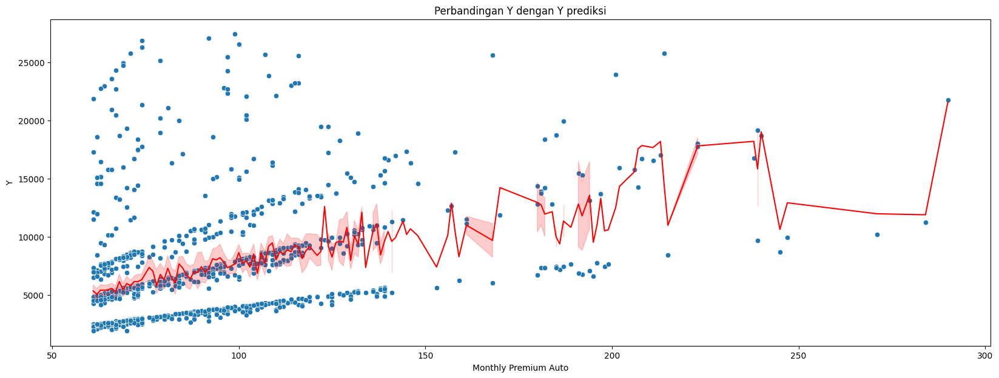

In [ ]:
# memeriksa grafik y prediksi dengan y test
plt.figure(figsize=(20,7))

sns.scatterplot(x = x_test['Monthly Premium Auto'], y = y_test['Customer Lifetime Value'])
sns.lineplot(x = x_test['Monthly Premium Auto'], y = y_pred.reshape(y_pred.shape[0],), color="red")

plt.title('Perbandingan Y dengan Y prediksi')
plt.xlabel('Monthly Premium Auto')
plt.ylabel('Y')

plt.show()

#### **4. Kandidat Model Random Forest Regressor**

In [ ]:
##import library Random Forest
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold

###### **Data Test**

In [ ]:
## definisi x dan y
x = clv_cleaned.drop(columns = 'Customer Lifetime Value')
y = clv_cleaned[['Customer Lifetime Value']]

In [ ]:
## encoded variables
onehot_var = ['Vehicle Class','Coverage','Renew Offer Type','EmploymentStatus']
income_var = ['Income','Total Claim Amount','Monthly Premium Auto']
ordinal_var = ['Education']
polinom_var = ['EmploymentStatus_Employed','EmploymentStatus_Medical Leave','EmploymentStatus_Retired']

###### **Train Test Split**

In [ ]:
## split data train dan test
x_trainval, x_test, y_trainval, y_test = train_test_split(
    x,
    y,
    random_state = 2021,
    test_size = 0.2
)

#####**Model Random Forest Regressor**

In [ ]:
## define model RandomForestRegressor
random_forest = RandomForestRegressor(random_state=2021,criterion='squared_error')
kf = KFold(n_splits = 5, shuffle = True)

In [ ]:
## define transformer
transformer_1 = ColumnTransformer([
    ('onehot',onehot,onehot_var),
    ('robust',robust, income_var),
    ('ordinal',ordinal,ordinal_var),
],remainder = 'passthrough')


In [ ]:
## define pipeline random forest
pipeline_random_forest = Pipeline([
    ('transformer_1',transformer_1),
    ('clf',random_forest)
])

pipeline_random_forest

Pipeline(steps=[('transformer_1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot',
                                                  OneHotEncoder(drop='first'),
                                                  ['Vehicle Class', 'Coverage',
                                                   'Renew Offer Type',
                                                   'EmploymentStatus']),
                                                 ('robust', RobustScaler(),
                                                  ['Income',
                                                   'Total Claim Amount',
                                                   'Monthly Premium Auto']),
                                                 ('ordinal',
                                                  OrdinalEncoder(cols=['Education'],
                                                                 mapping=[{'col': 'Education',
                                                                           'data_type': dtype('O'),
                                                                           'mapping': None                    0
High School or Below    1
College                 2
Bachelor                3
Master                  4
Doctor                  5
dtype: int64}]),
                                                  ['Education'])])),
                ('clf', RandomForestRegressor(random_state=2021))])

##### **Hyperparameter Tuning**

In [ ]:
## Hyperparameter
param_grid = {
    'clf__criterion':['squared_error','absolute_error','friedman_mse','poisson'],
    'clf__max_depth':[None],
    'clf__min_samples_split':[2,3,5],
    'clf__min_samples_leaf':[1,2]
}

##### **Cross Validasi**

In [ ]:
## cross validasi trainval
grid_search_rf = GridSearchCV(pipeline_random_forest,cv = kf, param_grid = param_grid, scoring = 'r2', n_jobs = -1)
grid_search_rf.fit(x_trainval, y_trainval)

print('Best params : ', grid_search_rf.best_params_)
print('Best score : ', grid_search_rf.best_score_)
result = pd.DataFrame(grid_search_rf.cv_results_)
result.sort_values(by = 'rank_test_score', ascending = True).head(3)


/usr/local/lib/python3.10/dist-packages/imblearn/pipeline.py:297: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self._final_estimator.fit(Xt, yt, **fit_params_last_step)


Best params :  {'clf__criterion': 'friedman_mse', 'clf__max_depth': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2}
Best score :  0.7613360635613117


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_clf__criterion,param_clf__max_depth,param_clf__min_samples_leaf,param_clf__min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
16,1.669463,0.015718,0.047517,0.001021,friedman_mse,None,2,3,"{'clf__criterion': 'friedman_mse', 'clf__max_depth': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 3}",0.786954,0.740371,0.751827,0.781837,0.745691,0.761336,0.019242,1
15,2.596758,0.637218,0.074815,0.021854,friedman_mse,None,2,2,"{'clf__criterion': 'friedman_mse', 'clf__max_depth': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2}",0.786954,0.740371,0.751827,0.781837,0.745691,0.761336,0.019242,1
3,1.696253,0.023070,0.053673,0.007382,squared_error,None,2,2,"{'clf__criterion': 'squared_error', 'clf__max_depth': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2}",0.787412,0.740633,0.752571,0.781959,0.743853,0.761286,0.019577,3


In [ ]:
## model terbaik
random_forest = grid_search_rf.best_estimator_
y_pred = random_forest.predict(x_test)
y_pred = y_pred.reshape(y_pred.shape[0],1)

##### **Loss Function : MSE, MAPE, RMSE**

Tes menggunakan parameter error sebagai berikut:
1. Jika nilai MAPE < 10% : Model sangat baik
2. Jika nilai MAPE diantara 10% - 20% : Model tergolong baik,
3. Jika nilai MAPE lebih besar dari 20% : Model perlu diimprove.

In [ ]:
# Menghitung MSE
mse = mean_squared_error(y_test, y_pred)
print('MSE: ', mse)

# Menghitung MAE
mae = mean_absolute_error(y_test, y_pred)
print('MAE: ', mae)

# Menghitung MAPE
def mape(y_test, y_pred):
    return np.mean(np.abs((y_test - y_pred) / y_test)) * 100

mape = mape(y_test, y_pred)
print('MAPE: ', mape)

# Menghitung RMSE
rmse = mean_squared_error(y_test, y_pred, squared=False)
print('RMSE: ', rmse)

# Menghitung RMSLE
def rmsle(y_test, y_pred):
    return np.sqrt(np.mean(np.power(np.log1p(y_pred) - np.log1p(y_test), 2)))

rmsle = rmsle(y_test, y_pred)
print('RMSLE: ', rmsle)

MSE:  6283804.631674566
MAE:  1028.5558630735773
MAPE:  Customer Lifetime Value    9.598355
dtype: float64
RMSE:  2506.7518089500936
RMSLE:  Customer Lifetime Value    0.188621
dtype: float64


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


##### **Feature Importances**

In [ ]:
best_model = grid_search_rf.best_estimator_.named_steps['clf']
feature_names = grid_search_rf.best_estimator_.named_steps['transformer_1']
feature_names = feature_names.get_feature_names_out() # Ganti dengan nama kolom fitur Anda
feature_importances = pd.DataFrame(best_model.feature_importances_, columns = ['importances'])
feature_importances['variable'] = feature_names
feature_importances.sort_values(by = 'importances', ascending = False)

,importances,variable
18,0.591800,remainder__Number of Policies
16,0.228404,robust__Monthly Premium Auto
15,0.061727,robust__Total Claim Amount
14,0.053416,robust__Income
17,0.018483,ordinal__Education
7,0.008180,onehot__Renew Offer Type_Offer2
8,0.007330,onehot__Renew Offer Type_Offer3
4,0.006550,onehot__Vehicle Class_Two-Door Car
11,0.005274,onehot__EmploymentStatus_Medical Leave
12,0.004245,onehot__EmploymentStatus_Retired


##### **Random Forest Regression Prediction Plot**

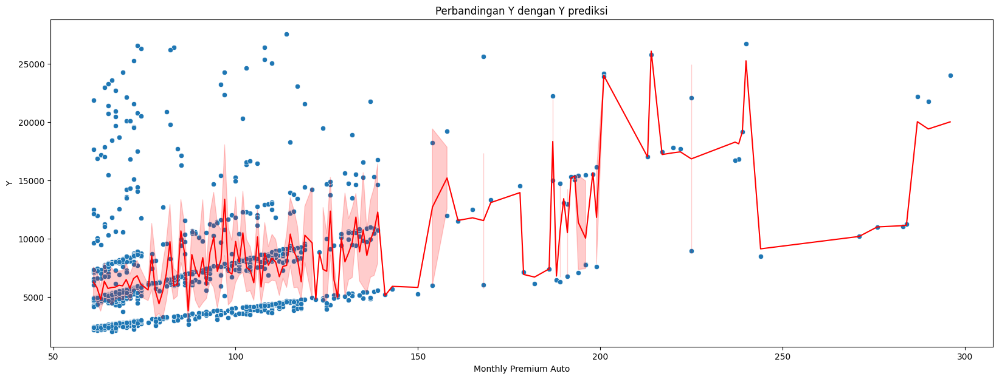

In [ ]:
# memeriksa grafik y prediksi dengan y test
plt.figure(figsize=(20,7))

sns.scatterplot(x = x_test['Monthly Premium Auto'], y = y_test['Customer Lifetime Value'])
sns.lineplot(x = x_test['Monthly Premium Auto'], y = y_pred.reshape(y_pred.shape[0],), color="red")

plt.title('Perbandingan Y dengan Y prediksi')
plt.xlabel('Monthly Premium Auto')
plt.ylabel('Y')

plt.show()

#### **5. Kandidat Model KNN Regressor**

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

###### **Data Test**

In [ ]:
## definisi x dan y
x = clv_cleaned.drop(columns = 'Customer Lifetime Value')
y = clv_cleaned[['Customer Lifetime Value']]

In [ ]:
## encoded variables
onehot_var = ['Vehicle Class','Coverage','Renew Offer Type','EmploymentStatus']
income_var = ['Income','Total Claim Amount','Monthly Premium Auto']
ordinal_var = ['Education']
polinom_var = ['EmploymentStatus_Employed','EmploymentStatus_Medical Leave','EmploymentStatus_Retired']

###### **Train Test Split**

In [ ]:
## split data train dan test
x_trainval, x_test, y_trainval, y_test = train_test_split(
    x,
    y,
    random_state = 2021,
    test_size = 0.2
)

#####**Model Random KNN Regressor**

In [ ]:
## define model RandomForestRegressor
knn_reg = KNeighborsRegressor(n_neighbors=5, weights='uniform')
kf = KFold(n_splits = 5, shuffle = True)

In [ ]:
## define transformer
transformer_1 = ColumnTransformer([
    ('onehot',onehot,onehot_var),
    ('robust',robust, income_var),
    ('ordinal',ordinal,ordinal_var),
],remainder = 'passthrough')


In [ ]:
## define pipeline random forest
pipeline_knn_reg = Pipeline([
    ('transformer_1',transformer_1),
    ('clf',knn_reg)
])

pipeline_knn_reg

Pipeline(steps=[('transformer_1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot',
                                                  OneHotEncoder(drop='first'),
                                                  ['Vehicle Class', 'Coverage',
                                                   'Renew Offer Type',
                                                   'EmploymentStatus']),
                                                 ('robust', RobustScaler(),
                                                  ['Income',
                                                   'Total Claim Amount',
                                                   'Monthly Premium Auto']),
                                                 ('ordinal',
                                                  OrdinalEncoder(cols=['Education'],
                                                                 mapping=[{'col': 'Education',
                                                                           'data_type': dtype('O'),
                                                                           'mapping': None                    0
High School or Below    1
College                 2
Bachelor                3
Master                  4
Doctor                  5
dtype: int64}]),
                                                  ['Education'])])),
                ('clf', KNeighborsRegressor())])

##### **Hyperparameter Tuning**

In [ ]:
## Hyperparameter
param_grid = {
    'clf__weights':['uniform','distance'],
    'clf__n_neighbors':[1,5,10,15,20],
    'clf__leaf_size':[10,20,30,40]
}

##### **Cross Validasi**

In [ ]:
## cross validasi trainval
grid_search_knn = GridSearchCV(pipeline_knn_reg,cv = kf, param_grid = param_grid, scoring = 'r2', n_jobs = -1)

grid_search_knn.fit(x_trainval, y_trainval)
print('Best params : ', grid_search_knn.best_params_)
print('Best score : ', grid_search_knn.best_score_)
result = pd.DataFrame(grid_search_knn.cv_results_)
result.sort_values(by = 'rank_test_score', ascending = True).head(3)


Best params :  {'clf__leaf_size': 10, 'clf__n_neighbors': 15, 'clf__weights': 'distance'}
Best score :  0.6431266195165891


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_clf__leaf_size,param_clf__n_neighbors,param_clf__weights,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
37,0.037699,0.002599,0.051437,0.002786,40,15,distance,"{'clf__leaf_size': 40, 'clf__n_neighbors': 15, 'clf__weights': 'distance'}",0.63835,0.6469,0.699179,0.610276,0.620928,0.643127,0.030825,1
27,0.037859,0.000871,0.051423,0.003581,30,15,distance,"{'clf__leaf_size': 30, 'clf__n_neighbors': 15, 'clf__weights': 'distance'}",0.63835,0.6469,0.699179,0.610276,0.620928,0.643127,0.030825,1
7,0.039811,0.002924,0.055743,0.011065,10,15,distance,"{'clf__leaf_size': 10, 'clf__n_neighbors': 15, 'clf__weights': 'distance'}",0.63835,0.6469,0.699179,0.610276,0.620928,0.643127,0.030825,1


In [ ]:
## model terbaik
knn_model = grid_search_knn.best_estimator_
y_pred = knn_model.predict(x_test)
y_pred = y_pred.reshape(y_pred.shape[0],1)

##### **Loss Function : MSE, MAPE, RMSE**

Tes menggunakan parameter error sebagai berikut:
1. Jika nilai MAPE < 10% : Model sangat baik
2. Jika nilai MAPE diantara 10% - 20% : Model tergolong baik,
3. Jika nilai MAPE lebih besar dari 20% : Model perlu diimprove.

In [ ]:
# Menghitung MSE
mse = mean_squared_error(y_test, y_pred)
print('MSE: ', mse)

# Menghitung MAE
mae = mean_absolute_error(y_test, y_pred)
print('MAE: ', mae)

# Menghitung MAPE
def mape(y_test, y_pred):
    return np.mean(np.abs((y_test - y_pred) / y_test)) * 100

mape = mape(y_test, y_pred)
print('MAPE: ', mape)

# Menghitung RMSE
rmse = mean_squared_error(y_test, y_pred, squared=False)
print('RMSE: ', rmse)

# Menghitung RMSLE
def rmsle(y_test, y_pred):
    return np.sqrt(np.mean(np.power(np.log1p(y_pred) - np.log1p(y_test), 2)))

rmsle = rmsle(y_test, y_pred)
print('RMSLE: ', rmsle)

MSE:  8494881.538001923
MAE:  1505.6871749436714
MAPE:  Customer Lifetime Value    17.659612
dtype: float64
RMSE:  2914.5980062440726
RMSLE:  Customer Lifetime Value    0.254874
dtype: float64


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


##### **KNN Regression Prediction Plot**

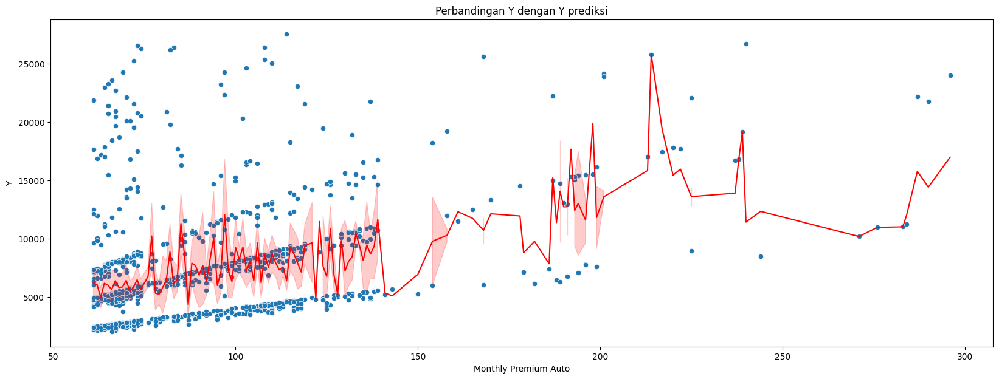

In [ ]:
# memeriksa grafik y prediksi dengan y test
plt.figure(figsize=(20,7))

sns.scatterplot(x = x_test['Monthly Premium Auto'], y = y_test['Customer Lifetime Value'])
sns.lineplot(x = x_test['Monthly Premium Auto'], y = y_pred.reshape(y_pred.shape[0],), color="red")

plt.title('Perbandingan Y dengan Y prediksi')
plt.xlabel('Monthly Premium Auto')
plt.ylabel('Y')

plt.show()

#### **6. Kandidat Model Multi Layer Perceptron Regressor**

In [ ]:
from sklearn.neural_network import MLPRegressor

###### **Data Test**

In [ ]:
## definisi x dan y
x = clv_cleaned.drop(columns = 'Customer Lifetime Value')
y = clv_cleaned[['Customer Lifetime Value']]

In [ ]:
## encoded variables
onehot_var = ['Vehicle Class','Coverage','Renew Offer Type','EmploymentStatus']
income_var = ['Income','Total Claim Amount','Monthly Premium Auto']
ordinal_var = ['Education']
polinom_var = ['EmploymentStatus_Employed','EmploymentStatus_Medical Leave','EmploymentStatus_Retired']

###### **Train Test Split**

In [ ]:
## split data train dan test
x_trainval, x_test, y_trainval, y_test = train_test_split(
    x,
    y,
    random_state = 2021,
    test_size = 0.2
)

#####**Model Random MLP Regressor**

In [ ]:
## define model MLPRegressor
mlp_reg = MLPRegressor()
kf = KFold(n_splits = 5, shuffle = True)

In [ ]:
## define transformer
transformer_1 = ColumnTransformer([
    ('onehot',onehot,onehot_var),
    ('robust',robust, income_var),
    ('ordinal',ordinal,ordinal_var),
],remainder = 'passthrough')


In [ ]:
## define pipeline MLPRegressor
pipeline_mlp_reg = Pipeline([
    ('transformer_1',transformer_1),
    ('clf',mlp_reg)
])

pipeline_mlp_reg

Pipeline(steps=[('transformer_1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot',
                                                  OneHotEncoder(drop='first'),
                                                  ['Vehicle Class', 'Coverage',
                                                   'Renew Offer Type',
                                                   'EmploymentStatus']),
                                                 ('robust', RobustScaler(),
                                                  ['Income',
                                                   'Total Claim Amount',
                                                   'Monthly Premium Auto']),
                                                 ('ordinal',
                                                  OrdinalEncoder(cols=['Education'],
                                                                 mapping=[{'col': 'Education',
                                                                           'data_type': dtype('O'),
                                                                           'mapping': None                    0
High School or Below    1
College                 2
Bachelor                3
Master                  4
Doctor                  5
dtype: int64}]),
                                                  ['Education'])])),
                ('clf', MLPRegressor())])

##### **Hyperparameter Tuning**

In [ ]:
## Hyperparameter
param_grid = {
    'clf__hidden_layer_sizes':[200],
    'clf__activation':['relu'],
    'clf__alpha':[0.0001],
    'clf__solver':['adam'],
    'clf__learning_rate':['adaptive']
}

##### **Cross Validasi**

In [ ]:
## cross validasi trainval
grid_search_mlp = GridSearchCV(pipeline_mlp_reg,cv = kf, param_grid = param_grid, scoring = 'r2', n_jobs = -1)

grid_search_mlp.fit(x_trainval, y_trainval)
print('Best params : ', grid_search_mlp.best_params_)
print('Best score : ', grid_search_mlp.best_score_)
result = pd.DataFrame(grid_search_mlp.cv_results_)
result.sort_values(by = 'rank_test_score', ascending = True).head(3)


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1623: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Best params :  {'clf__activation': 'relu', 'clf__alpha': 0.0001, 'clf__hidden_layer_sizes': 200, 'clf__learning_rate': 'adaptive', 'clf__solver': 'adam'}
Best score :  0.050047589895189204


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_clf__activation,param_clf__alpha,param_clf__hidden_layer_sizes,param_clf__learning_rate,param_clf__solver,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,5.941752,1.555777,0.026033,0.010979,relu,0.0001,200,adaptive,adam,"{'clf__activation': 'relu', 'clf__alpha': 0.0001, 'clf__hidden_layer_sizes': 200, 'clf__learning_rate': 'adaptive', 'clf__solver': 'adam'}",0.033017,0.057005,0.01711,0.085491,0.057615,0.050048,0.023396,1


In [ ]:
## model terbaik
mlp_model = grid_search_mlp.best_estimator_
y_pred = mlp_model.predict(x_test)
y_pred = y_pred.reshape(y_pred.shape[0],1)

##### **Loss Function : MSE, MAPE, RMSE**

Tes menggunakan parameter error sebagai berikut:
1. Jika nilai MAPE < 10% : Model sangat baik
2. Jika nilai MAPE diantara 10% - 20% : Model tergolong baik,
3. Jika nilai MAPE lebih besar dari 20% : Model perlu diimprove.

In [ ]:
# Menghitung MSE
mse = mean_squared_error(y_test, y_pred)
print('MSE: ', mse)

# Menghitung MAE
mae = mean_absolute_error(y_test, y_pred)
print('MAE: ', mae)

# Menghitung MAPE
def mape(y_test, y_pred):
    return np.mean(np.abs((y_test - y_pred) / y_test)) * 100

mape = mape(y_test, y_pred)
print('MAPE: ', mape)

# Menghitung RMSE
rmse = mean_squared_error(y_test, y_pred, squared=False)
print('RMSE: ', rmse)

# Menghitung RMSLE
def rmsle(y_test, y_pred):
    return np.sqrt(np.mean(np.power(np.log1p(y_pred) - np.log1p(y_test), 2)))

rmsle = rmsle(y_test, y_pred)
print('RMSLE: ', rmsle)

MSE:  21030463.83391653
MAE:  3108.5421003139304
MAPE:  Customer Lifetime Value    47.471243
dtype: float64
RMSE:  4585.89836715954
RMSLE:  Customer Lifetime Value    0.533864
dtype: float64


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


##### **MLP Regression Prediction Plot**

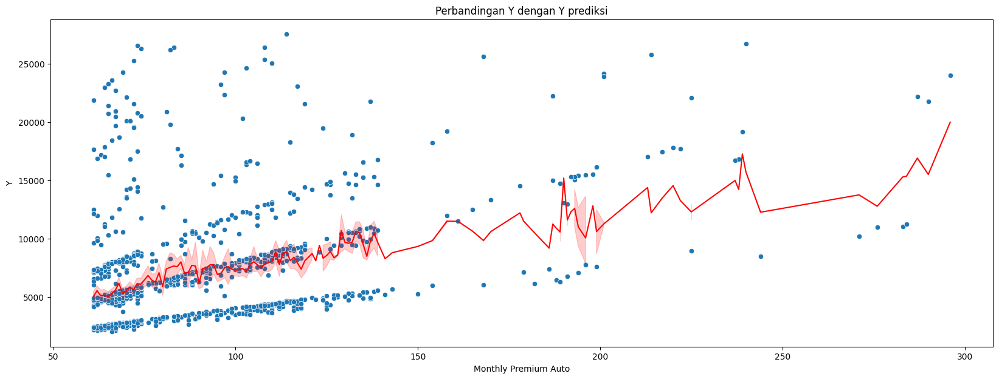

In [ ]:
# memeriksa grafik y prediksi dengan y test
plt.figure(figsize=(20,7))

sns.scatterplot(x = x_test['Monthly Premium Auto'], y = y_test['Customer Lifetime Value'])
sns.lineplot(x = x_test['Monthly Premium Auto'], y = y_pred.reshape(y_pred.shape[0],), color="red")

plt.title('Perbandingan Y dengan Y prediksi')
plt.xlabel('Monthly Premium Auto')
plt.ylabel('Y')

plt.show()

#### **7. Ensemble Method**

Sebelumnya kita sudah melakukan pemodelan terhadap berbagai model Machine Learning. Kita menemukan bahwa :
1. Pemodelan Linear Polynomial memiliki nilai yang lebih akurat bila dibandingkan dengan Lasso atau Ridge dalam skala Polynomial. Nilai **mean test score** pemodelan mencapai 70 persen. Artinya bahwa model tersebut mampu menjelaskan 70 persen terhadap variasi data, dengan tingkat nilai **MAPE** sebesar 14 persen. Model ini memiliki kelebihan :
    * Hasil pemodelan dapat kita interpretasikan. Kita dapat melihat dan mengetahui bagaimana hubungan antara variabel independen x terhadap variabel dependen y, apak hubungannya bersifat linear atau kuadratik.
    * Kita dapat menyusun model ini dalam sebuah rumus matematika yang dapat dipakai untuk melakukan prediksi nilai Y berdasarkan nilai X.
2. Pemodelan yang terbukti lebih akurat yaitu **RandomForestRegressor**, yang memilkiki tingkant **mean test score** sebesar 80 persen,lebih baik daripada regresi linear dan nilai **MAPE** mendekati 10 persen. Metode Random Forest lebih efektif mengatasi persebaran data yang tersebar dan tidak murni linear. Namun, metode ini memiliki satu kelemahan, yaitu kurang dapat diinterpretasikan dan di representasikan dengan baik. Karena model ini tidak menghasilkan sebuah rumus atau model matematis yang menggambarkan fenomena pengaruh X terhadap Y.
3. Pemodelan KNN terbukti juga efektif dalam menangani data dengan pola yang tersebar. Namun KNN cenderung terlalu sederhana dan berpotensi underfitting. Namun setelah kita lihat **mean test score** KNN berada pada nilai 70 dan dapat kita anggap juga, dapat secara baik menjadi pemodelan machine learning kita.
4. Tentu seperti yang sudah disebutkan pada 3 poin sebelumnya, ketika pemodelan ini memiliki keunggulan dan kelemahan masing-masing. Maka dari itu kita perlu menyusun suatu metode Machine Learning yang dapat mempertimbangkan hasil prediksi dari ketiganya, sehingga menjadi 1 hasil prediksi yang sudah lebih sempurna dan melihat dari berbagai sudut arah.
5. Pemodelan dengan **Neural Network** tidak terlalu efektif, karena selain menyita waktu yang terlalu lama, hasil pengukuran sementaranya pun tidak lebih baik daripada menggunakan Linear Regression. Maka kita tidak mempertimbangkan model ini untuk masuk ke dalam sistem voting, karena berpotensi memperlambat algoritma lain yang berada pada pipeline yang sama.

###### **Data Test**

###### **Train Test Split**

In [ ]:
## split data train dan test
x_trainval, x_test, y_trainval, y_test = train_test_split(
    x,
    y,
    random_state = 2021,
    test_size = 0.2
)

#####**Model Ensemble Regressor**

In [ ]:
# import model voting regressor
from sklearn.ensemble import VotingRegressor

## definisi x dan y
x = clv_cleaned.drop(columns = 'Customer Lifetime Value')
y = clv_cleaned[['Customer Lifetime Value']]

## encoded variables
onehot_var = ['Vehicle Class','Coverage','Renew Offer Type','EmploymentStatus']
income_var = ['Income']
ordinal_var = ['Education']
polynom_var = ['remainder__Number of Policies', 'remainder__Monthly Premium Auto']

linear_1 = LinearRegression()

feature_names = ['robust__Income', 'ordinal__Education',
       'onehot__Vehicle Class_Luxury Car',
       'onehot__Vehicle Class_Luxury SUV', 'onehot__Vehicle Class_SUV',
       'onehot__Vehicle Class_Sports Car',
       'onehot__Vehicle Class_Two-Door Car', 'onehot__Coverage_Extended',
       'onehot__Coverage_Premium', 'onehot__Renew Offer Type_Offer2',
       'onehot__Renew Offer Type_Offer3',
       'onehot__Renew Offer Type_Offer4',
       'onehot__EmploymentStatus_Employed',
       'onehot__EmploymentStatus_Medical Leave',
       'onehot__EmploymentStatus_Retired',
       'onehot__EmploymentStatus_Unemployed',
       'remainder__Number of Policies', 'remainder__Monthly Premium Auto',
       'remainder__Total Claim Amount']
       
## Fungsi mengubah numpy menjadi data frame
def df_transformer(X):
  df = pd.DataFrame(X,columns = feature_names)
  return df

to_df = FunctionTransformer(df_transformer)

## define model Voting
voting_regressor = VotingRegressor(estimators=[
    ('linear',  Pipeline(steps = [
          ('transformer_1',transformer_linear),
          ('transformer_2',transformer_2),
          ('transformer_3',transformer_3),
          ('clf',linear_1)
    ])), 
    ('random_forest', random_forest), 
    ('knn', knn_model)
     ])

kf = KFold(n_splits = 5, shuffle = True)

## define pipeline Voting
pipeline_voting = Pipeline([
    ('clf',voting_regressor)
])

pipeline_voting

Pipeline(steps=[('clf',
                 VotingRegressor(estimators=[('linear',
                                              Pipeline(steps=[('transformer_1',
                                                               ColumnTransformer(remainder='passthrough',
                                                                                 transformers=[('robust',
                                                                                                RobustScaler(),
                                                                                                ['Income']),
                                                                                               ('ordinal',
                                                                                                OrdinalEncoder(cols=['Education'],
                                                                                                               mapping=[{'col': 'Education',
                                                                                                                         'data_type': dtype('O'),
                                                                                                                         'mapping': None                    0
High School or Below    1
College                 2
Bachelor                3
Master                  4
Doctor                  5
dty...
                                                                                                RobustScaler(),
                                                                                                ['Income',
                                                                                                 'Total '
                                                                                                 'Claim '
                                                                                                 'Amount',
                                                                                                 'Monthly '
                                                                                                 'Premium '
                                                                                                 'Auto']),
                                                                                               ('ordinal',
                                                                                                OrdinalEncoder(cols=['Education'],
                                                                                                               mapping=[{'col': 'Education',
                                                                                                                         'data_type': dtype('O'),
                                                                                                                         'mapping': None                    0
High School or Below    1
College                 2
Bachelor                3
Master                  4
Doctor                  5
dtype: int64}]),
                                                                                                ['Education'])])),
                                                              ('clf',
                                                               KNeighborsRegressor(leaf_size=10,
                                                                                   n_neighbors=15,
                                                                                   weights='distance'))]))]))])

##### **Hyperparameter Tuning**

In [ ]:
## Hyperparameter

param_grid = {
    'clf__linear__clf__fit_intercept': [True], 
    'clf__linear__transformer_3__polynom__degree': [4]
}

##### **Cross Validasi**

In [ ]:
## cross validasi trainval
grid_search_voting = GridSearchCV(pipeline_voting,cv = kf, param_grid = param_grid, scoring = 'r2', n_jobs = -1)

grid_search_voting.fit(x_trainval, y_trainval)
print('Best params : ', grid_search_voting.best_params_)
print('Best score : ', grid_search_voting.best_score_)
result = pd.DataFrame(grid_search_voting.cv_results_)
result.sort_values(by = 'rank_test_score', ascending = True).head(3)


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_voting.py:597: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Best params :  {'clf__linear__clf__fit_intercept': True, 'clf__linear__transformer_3__polynom__degree': 4}
Best score :  0.7320885025373892


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_clf__linear__clf__fit_intercept,param_clf__linear__transformer_3__polynom__degree,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,1.773042,0.076588,0.118865,0.006292,True,4,"{'clf__linear__clf__fit_intercept': True, 'clf__linear__transformer_3__polynom__degree': 4}",0.731635,0.758356,0.743105,0.718156,0.70919,0.732089,0.017493,1


In [ ]:
## model terbaik
voting = grid_search_voting.best_estimator_
y_pred = voting.predict(x_test)
y_pred = y_pred.reshape(y_pred.shape[0],1)

##### **Loss Function : MSE, MAPE, RMSE**

Tes menggunakan parameter error sebagai berikut:
1. Jika nilai MAPE < 10% : Model sangat baik
2. Jika nilai MAPE diantara 10% - 20% : Model tergolong baik,
3. Jika nilai MAPE lebih besar dari 20% : Model perlu diimprove.

In [ ]:
# Menghitung MSE
mse = mean_squared_error(y_test, y_pred)
print('MSE: ', mse)

# Menghitung MAE
mae = mean_absolute_error(y_test, y_pred)
print('MAE: ', mae)

# Menghitung MAPE
def mape(y_test, y_pred):
    return np.mean(np.abs((y_test - y_pred) / y_test)) * 100

mape = mape(y_test, y_pred)
print('MAPE: ', mape)

# Menghitung RMSE
rmse = mean_squared_error(y_test, y_pred, squared=False)
print('RMSE: ', rmse)

# Menghitung RMSLE
def rmsle(y_test, y_pred):
    return np.sqrt(np.mean(np.power(np.log1p(y_pred) - np.log1p(y_test), 2)))

rmsle = rmsle(y_test, y_pred)
print('RMSLE: ', rmsle)

MSE:  6659385.823304855
MAE:  1415.8045661395215
MAPE:  Customer Lifetime Value    16.173443
dtype: float64
RMSE:  2580.578583051649
RMSLE:  Customer Lifetime Value    0.214986
dtype: float64


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


##### **Ensemble Regression Prediction Plot**

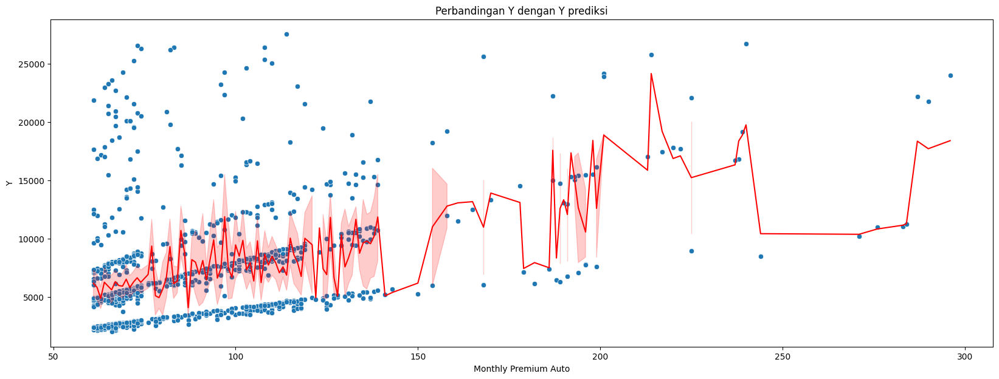

In [ ]:
# memeriksa grafik y prediksi dengan y test
plt.figure(figsize=(20,7))

sns.scatterplot(x = x_test['Monthly Premium Auto'], y = y_test['Customer Lifetime Value'])
sns.lineplot(x = x_test['Monthly Premium Auto'], y = y_pred.reshape(y_pred.shape[0],), color="red")

plt.title('Perbandingan Y dengan Y prediksi')
plt.xlabel('Monthly Premium Auto')
plt.ylabel('Y')

plt.show()

####**7. Boosting (XG Boost) Comparisson**

In [ ]:
## library XGBoost
!pip install xgboost

from xgboost.sklearn import XGBRegressor

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
## definisi x dan y
x = clv_cleaned.drop(columns = 'Customer Lifetime Value')
y = clv_cleaned[['Customer Lifetime Value']]

In [ ]:
## encoded variables
onehot_var = ['Vehicle Class','Coverage','Renew Offer Type','EmploymentStatus']
income_var = ['Income','Total Claim Amount','Monthly Premium Auto']
ordinal_var = ['Education']
polinom_var = ['EmploymentStatus_Employed','EmploymentStatus_Medical Leave','EmploymentStatus_Retired']

###### **Train Test Split**

In [ ]:
## split data train dan test
x_trainval, x_test, y_trainval, y_test = train_test_split(
    x,
    y,
    random_state = 2021,
    test_size = 0.2
)

#####**XGB Regressor**

In [ ]:
## define model XGBoost
xgb_reg = XGBRegressor()
kf = KFold(n_splits = 5, shuffle = True)

In [ ]:
## define transformer
transformer_1 = ColumnTransformer([
    ('onehot',onehot,onehot_var),
    ('robust',robust, income_var),
    ('ordinal',ordinal,ordinal_var),
],remainder = 'passthrough')


In [ ]:
## define pipeline xgb
pipeline_xgb = Pipeline([
    ('transformer_1',transformer_1),
    ('clf',xgb_reg)
])

pipeline_xgb

Pipeline(steps=[('transformer_1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot',
                                                  OneHotEncoder(drop='first'),
                                                  ['Vehicle Class', 'Coverage',
                                                   'Renew Offer Type',
                                                   'EmploymentStatus']),
                                                 ('robust', RobustScaler(),
                                                  ['Income',
                                                   'Total Claim Amount',
                                                   'Monthly Premium Auto']),
                                                 ('ordinal',
                                                  OrdinalEncoder(cols=['Education'],
                                                                 mapping=[{'col': 'Education',
                                                                           'data_ty...
                              feature_types=None, gamma=None, gpu_id=None,
                              grow_policy=None, importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, n_estimators=100,
                              n_jobs=None, num_parallel_tree=None,
                              predictor=None, random_state=None, ...))])

##### **Hyperparameter Tuning**

In [ ]:
## Hyperparameter
param_grid = {    
    'clf__max_depth':[4],
    'clf__learning_rate':[0.1,0.2,0.3],
    'clf__n_estimators':[80]
    }

##### **Cross Validasi**

In [ ]:
## cross validasi trainval
grid_search_xgb = GridSearchCV(pipeline_xgb,cv = kf, param_grid = param_grid, scoring = 'r2', n_jobs = -1)

grid_search_xgb.fit(x_trainval, y_trainval)
print('Best params : ', grid_search_xgb.best_params_)
print('Best score : ', grid_search_xgb.best_score_)
result = pd.DataFrame(grid_search_xgb.cv_results_)
result.sort_values(by = 'rank_test_score', ascending = True).head(3)


Best params :  {'clf__learning_rate': 0.2, 'clf__max_depth': 4, 'clf__n_estimators': 80}
Best score :  0.7547455689344639


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_clf__learning_rate,param_clf__max_depth,param_clf__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
1,0.615634,0.113971,0.029979,0.020324,0.2,4,80,"{'clf__learning_rate': 0.2, 'clf__max_depth': 4, 'clf__n_estimators': 80}",0.726295,0.742695,0.747844,0.773949,0.782945,0.754746,0.020815,1
0,0.501589,0.012742,0.022569,0.003551,0.1,4,80,"{'clf__learning_rate': 0.1, 'clf__max_depth': 4, 'clf__n_estimators': 80}",0.730651,0.739553,0.742205,0.766793,0.774398,0.750720,0.016846,2
2,0.685411,0.174508,0.032125,0.009918,0.3,4,80,"{'clf__learning_rate': 0.3, 'clf__max_depth': 4, 'clf__n_estimators': 80}",0.712613,0.748507,0.739032,0.770100,0.773775,0.748805,0.022282,3


In [ ]:
## model terbaik
xgb = grid_search_xgb.best_estimator_
y_pred = xgb.predict(x_test)
y_pred = y_pred.reshape(y_pred.shape[0],1)

##### **Loss Function : MSE, MAPE, RMSE**

Tes menggunakan parameter error sebagai berikut:
1. Jika nilai MAPE < 10% : Model sangat baik
2. Jika nilai MAPE diantara 10% - 20% : Model tergolong baik,
3. Jika nilai MAPE lebih besar dari 20% : Model perlu diimprove.

In [ ]:
# Menghitung MSE
mse = mean_squared_error(y_test, y_pred)
print('MSE: ', mse)

# Menghitung MAE
mae = mean_absolute_error(y_test, y_pred)
print('MAE: ', mae)

# Menghitung MAPE
def mape(y_test, y_pred):
    return np.mean(np.abs((y_test - y_pred) / y_test)) * 100

mape = mape(y_test, y_pred)
print('MAPE: ', mape)

# Menghitung RMSE
rmse = mean_squared_error(y_test, y_pred, squared=False)
print('RMSE: ', rmse)

# Menghitung RMSLE
def rmsle(y_test, y_pred):
    return np.sqrt(np.mean(np.power(np.log1p(y_pred) - np.log1p(y_test), 2)))

rmsle = rmsle(y_test, y_pred)
print('RMSLE: ', rmsle)

MSE:  6018112.918922167
MAE:  1215.7707846769865
MAPE:  Customer Lifetime Value    13.92146
dtype: float64
RMSE:  2453.1842407210606
RMSLE:  Customer Lifetime Value    0.285504
dtype: float64


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


##### **XGB Regression Prediction Plot**

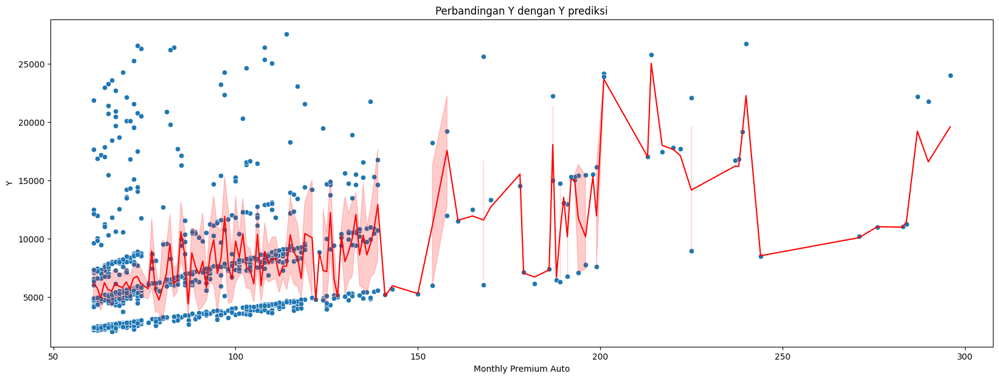

In [ ]:
# memeriksa grafik y prediksi dengan y test
plt.figure(figsize=(20,7))

sns.scatterplot(x = x_test['Monthly Premium Auto'], y = y_test['Customer Lifetime Value'])
sns.lineplot(x = x_test['Monthly Premium Auto'], y = y_pred.reshape(y_pred.shape[0],), color="red")

plt.title('Perbandingan Y dengan Y prediksi')
plt.xlabel('Monthly Premium Auto')
plt.ylabel('Y')

plt.show()

## **Kesimpulan dan Rekomendasi**

**Review Model ML**

Berdasarkan perancangan model Machine Learning yang kita sudah lakukan sebelumnya, kita menemukan bahwa model RandomForestRegressor memiliki tingkat akurasi yang paling tinggi dan nilai MAPE yang terbaik.

Dibandingkan dengan model Ensemble yang kita sudah susun dengan VotingRegressor, model Ensemble memiliki performa tidak sebaik RandomForestRegressor nilai MAPE-nya 16 persen, masih kalah apabila dibandingkan RandomForestRegressor yang MAPE berada dibawah 10 persen (9.598355 persen).

Dengan kata lain, kandidat model ML yang akan kita gunakan diurutkan dari yang terbaik:
1. RandomForestRegressor, nilai MAPE 9.6 persen, artinya prediksi dengan model Machine Learning ini akan meleset kurang lebih 10 persen dari nilai aktual prediksi.
2. XGBoostRegressor, nilai MAPE 13.92 persen, artinya prediksi dengan model Machine Learning ini akan meleset kurang lebih 13.92 persen dari nilai aktual prediksi.
3. Ensemble Learning, nilai MAPE 16.17 persen, artinya prediksi dengan model Machine Learning ini akan meleset kurang lebih 16.17 persen dari nilai aktual prediksi.

Ketiga model tersebut reliabel sejauh memenuhi asumsi sebagai berikut:
1. Data prediksi tidak melebihi pola normal / outliers (data lebih tinggi dari 22500)
2. Distribusi data secara umum mengikuti pola distribusi data yang menyerupai dataset saat ini.
3. Tidak menutup kemungkinan model dapat meleset jauh, terutama pada data anomali atau outliers. Mengenai data anomali ini perlu peninjauan lebih jauh, apakah ada variabel tidak tertulis yang menyebabkan anomali, dan dapat dicek apabila ada indikasi fraud.

**Permasalahan Utama**

Sekarang kita akan menjawab pertanyaan utama dari masalah yang kita hadapi, yaitu :
Untuk menjawab permasalahan bisnis tersebut, maka kita perlu menjawab pertanyaan sebagai berikut:

1. **Apa saja faktor-faktor yang terindikasi memberikan pengaruh terhadap Customer Lifetime Value (CLV)?**

>> Variabel - variabel yang berpengaruh terhadap CLV antara lain **(sesuai dengan koefisien regresi linear)**:

    1. polynom__remainder__Number of Policies, koefisien : 8.509931e+04 	
    2. remainder__onehot__EmploymentStatus_Medical Leave, koefisien 6.748863e+02 	
    3. remainder__robust__Income, koefisien 9.766829e+01 
    4. polynom__remainder__Number of Policies, koefisien 9.551147e+01 	
    5. polynom__remainder__Number of Policies^3 remainder__Monthly Premium Auto^2, koefisien 8.706127e-04 	

>> Variabel - variabel yang berpengaruh terhadap CLV antara lain **(sesuai dengan feature importances RandomForest)**:

    1. remainder__Number of Policies, importances : 0.591800
    2. robust__Monthly Premium Auto, importances : 0.228404
    3. robust__Total Claim Amount, importances : 0.061727
    4. robust__Income, importances : 0.053416
    5. ordinal__Education, importances : 0.018483
    6. onehot__Renew Offer Type_Offer2, importances : 0.008180 
    7. onehot__Renew Offer Type_Offer3, importances : 0.007330 	
    8. onehot__Vehicle Class_Two-Door Car, importances : 0.006550 	
    9.onehot__EmploymentStatus_Medical Leave, importances : 0.005274 

Sehingga kita simpulkan, variabel paling utama adalah:
1. Number of Policies, menggambarkan variabel **Customer Retention and Expansion**.
2. Income, menggambarkan tingkat daya beli Customer, akan cocok masuk ke variabel **Customer Acquisition**.
3. Monthly Premium Auto **Customer Retention and Expansion**.
4. Total Claim Amount

2. **Apakah faktor-faktor tersebut sungguh dapat memprediksi Customer Lifetime Value seorang customer?**

>> Sesuai dengan prediksi ML, variabel tersebut cukup dapat menjelaskan variasi Customer Lifetime Value dan variabel yang paling berpengaruh terhadap Customer Lifetime Value yaitu **Customer Retention** dan **Customer Expansion**.

**Final Note**

> Model ML yang sudah dibuat diatas tentunya masih memerlukan banyak pengembangan, seperti menguji secara eksperimentatif menggunakan kolom kontrol, apakah apabila kita membuat sebuah program atau penawaran fee diskon asuransi, customer kita akan tertarik untuk membeli produk tersebut, dan demikian meningkatkan tingkat retensi mereka terhadap suatu produk.

> Selain itu perlu pengujian lapangan, apakah kita sudah mempertimbangkan faktor lain yaitu Brand Awareness Customer terhadap produk asuransi kita, dan tingkat kepuasan mereka terhadap produk asuransi, atau produk asuransi kita apabila dibandingkan dengan kompetitor atau pesaing.

> Hal-hal tersebut yang perlu kita uji melalui metode riset yang lebih saintifik sepert Structural Equation Modelling dengan Partial Least Regression, untuk mengungkap apakah justru variabel laten seperti itu yang paling berpengaruh terhadap Customer Lifetime Value.

> Setidaknya apabila ada satu variabel yang menggambarkan kepuasan pelanggan disini yaitu **Number of Policies** dengan anggapan bahwa semakin puas pelanggan dengan produk kita, mereka akan semakin mau untuk bertahan dengan produk kita.

## **Pickle dan Uji Data**

In [6]:
##import modul penyimpanan model
import pickle
import joblib
import cloudpickle
from sklearn.metrics import r2_score

In [ ]:
# ## save model voting
filename_ensemble = '/content/drive/My Drive/machine_learning/model_ensemble.sav'
with open(filename_ensemble, 'wb') as file:
    cloudpickle.dump(voting, file)

## save model xgb
filename_xgb = '/content/drive/My Drive/machine_learning/model_xgb.sav'
pickle.dump(xgb, open(filename_xgb,'wb'))

## save model random forest
filename_rf = '/content/drive/My Drive/machine_learning/model_random_forest.sav'
pickle.dump(random_forest, open(filename_rf,'wb'))

In [4]:
# Load the model using cloudpickle
filename_ensemble = '/content/drive/My Drive/machine_learning/model_ensemble.sav'
with open(filename_ensemble, 'rb') as file:
    voting_model = cloudpickle.load(file)

## load model xgb
filename_xgb = '/content/drive/My Drive/machine_learning/model_xgb.sav'
xgb_model = pickle.load(open(filename_xgb,'rb'))

## load model xgb
filename_rf = '/content/drive/My Drive/machine_learning/model_random_forest.sav'
random_forest_model = pickle.load(open(filename_rf,'rb'))

In [17]:
##silahkan masukkan dataset yang akan diuji
dataset_target = x_test #= silahkan isi nama dataset disini

In [19]:
## prediksi dengan model voting
y_pred_vote = voting_model.predict(dataset_target)
print('r2_score : ',r2_score(y_test, y_pred_vote))

r2_score :  0.8871151122117154


In [21]:
## prediksi dengan model xgb
y_pred_xgb = xgb_model.predict(dataset_target)
print('r2_score : ',r2_score(y_test, y_pred_xgb))

r2_score :  0.8211141515772831


In [22]:
## prediksi dengan model random forest
y_pred_rf = random_forest_model.predict(dataset_target)
print('r2_score : ',r2_score(y_test, y_pred_rf))

r2_score :  0.8989341709210087
